In [1]:
pip install imbalanced-learn pgmpy

In [2]:
from pgmpy.base import DAG
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.estimators import HillClimbSearch, MaximumLikelihoodEstimator
from pgmpy.inference import VariableElimination
try:
    from pgmpy.estimators import BIC
except ImportError:
    from pgmpy.estimators.StructureScore import BIC

/usr/local/lib/python3.12/dist-packages/pgmpy/estimators/__init__.py:4: FutureWarning: `pgmpy.estimators.StructureScore` is deprecated and will be removed in v1.3.0. Use `pgmpy.structure_score` instead.
  from .StructureScore import (


In [3]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch, FancyArrowPatch
from matplotlib.lines import Line2D
from scipy import stats

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score, log_loss,
    brier_score_loss, confusion_matrix, classification_report,
    roc_curve, precision_recall_curve, auc
)
from sklearn.calibration import calibration_curve
from sklearn.feature_selection import mutual_info_classif

In [4]:

# Research-grade plot style
plt.rcParams.update({
    "figure.dpi": 150, "font.family": "DejaVu Sans",
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.grid": True, "grid.alpha": 0.3,
    "axes.titlesize": 13, "axes.labelsize": 11,
    "legend.fontsize": 9, "xtick.labelsize": 9, "ytick.labelsize": 9,
})

# Bảng màu thống nhất toàn pipeline
C = {
    "bn_blue"   : "#2c7bb6",   # BN model curve
    "red"       : "#d7191c",   # Treat-all / risk-high
    "gray"      : "#636363",   # Baseline / treat-none
    "target"    : "#ff5a00",   # Target node (orange)
    "feature"   : "#4f81bd",   # Feature node (steel blue)
    "parent"    : "#2166ac",   # Parent node (dark blue)
    "child"     : "#4dac26",   # Child node (green)
    "youden"    : "#e41a1c",   # Youden threshold
    "closest"   : "#377eb8",   # Closest-(0,1) threshold
    "symmetry"  : "#4daf4a",   # Symmetry threshold
    "highlight" : "#ff7f00",   # Best run highlight
    "low_risk"  : "#91bfdb",   # Low risk class
    "high_risk" : "#fc8d59",   # High risk class
}

# Nạp dữ liệu và Tiền xử lý cơ bản

In [5]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# 1. Đọc dữ liệu
df = pd.read_csv('german_credit_data.csv')

# Giả sử cột mục tiêu là 'target' (good/bad), ta map về 0 và 1
df['target'] = df['target'].map({'good': 0, 'bad': 1})



In [6]:
df

,status_account,month_duration,credit_history,purpose,credit_amount,status_savings,years_employment,payment_to_income_ratio,status_and_sex,secondary_obligor,...,collateral,age,other_installment_plans,housing,n_credits,job,n_guarantors,telephone,is_foreign_worker,target
0,< 0 DM,6,critical account/ other credits existing (not ...,radio/television,1169,unknown/ no savings account,>= 7 years,4,male : single,none,...,none,67,none,own,2,skilled employee/ official,1,"yes, registered under the customers name",yes,0
1,0 to < 200 DM,48,existing credits paid back duly till now,radio/television,5951,< 100 DM,1 to < 4 years,2,female : divorced/separated/married,none,...,none,22,none,own,1,skilled employee/ official,1,none,yes,1
2,no checking account,12,critical account/ other credits existing (not ...,education,2096,< 100 DM,4 to < 7 years,2,male : single,none,...,none,49,none,own,1,unskilled - resident,2,none,yes,0
3,< 0 DM,42,existing credits paid back duly till now,furniture/equipment,7882,< 100 DM,4 to < 7 years,2,male : single,guarantor,...,car,45,none,for free,1,skilled employee/ official,2,none,yes,0
4,< 0 DM,24,delay in paying off in the past,car (new),4870,< 100 DM,1 to < 4 years,3,male : single,none,...,savings agreement/life insurance,53,none,for free,2,skilled employee/ official,2,none,yes,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,no checking account,12,existing credits paid back duly till now,furniture/equipment,1736,< 100 DM,4 to < 7 years,3,female : divorced/separated/married,none,...,none,31,none,own,1,unskilled - resident,1,none,yes,0
996,< 0 DM,30,existing credits paid back duly till now,car (used),3857,< 100 DM,1 to < 4 years,4,male : divorced/separated,none,...,car,40,none,own,1,management/ self-employed/highly qualified emp...,1,"yes, registered under the customers name",yes,0
997,no checking account,12,existing credits paid back duly till now,radio/television,804,< 100 DM,>= 7 years,4,male : single,none,...,real estate,38,none,own,1,skilled employee/ official,1,none,yes,0
998,< 0 DM,45,existing credits paid back duly till now,radio/television,1845,< 100 DM,1 to < 4 years,4,male : single,none,...,savings agreement/life insurance,23,none,for free,1,skilled employee/ official,1,"yes, registered under the customers name",yes,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   status_account           1000 non-null   object
 1   month_duration           1000 non-null   int64 
 2   credit_history           1000 non-null   object
 3   purpose                  1000 non-null   object
 4   credit_amount            1000 non-null   int64 
 5   status_savings           1000 non-null   object
 6   years_employment         1000 non-null   object
 7   payment_to_income_ratio  1000 non-null   int64 
 8   status_and_sex           1000 non-null   object
 9   secondary_obligor        1000 non-null   object
 10  residence_since          1000 non-null   int64 
 11  collateral               1000 non-null   object
 12  age                      1000 non-null   int64 
 13  other_installment_plans  1000 non-null   object
 14  housing                  1000 non-null   

In [8]:
print("\nMissing values in Australian dataset:")
print(df.isnull().sum())


Missing values in Australian dataset:
status_account             0
month_duration             0
credit_history             0
purpose                    0
credit_amount              0
status_savings             0
years_employment           0
payment_to_income_ratio    0
status_and_sex             0
secondary_obligor          0
residence_since            0
collateral                 0
age                        0
other_installment_plans    0
housing                    0
n_credits                  0
job                        0
n_guarantors               0
telephone                  0
is_foreign_worker          0
target                     0
dtype: int64


In [9]:
for col in df.columns:
    print(f"\nFeature: {col}")
    print(df[col].unique())


Feature: status_account
['< 0 DM' '0 to < 200 DM' 'no checking account' '>= 200 DM']

Feature: month_duration
[ 6 48 12 42 24 36 30 15  9 10  7 60 18 45 11 27  8 54 20 14 33 21 16  4
 47 13 22 39 28  5 26 72 40]

Feature: credit_history
['critical account/ other credits existing (not at this bank)'
 'existing credits paid back duly till now'
 'delay in paying off in the past'
 'no credits taken/ all credits paid back duly'
 'all credits at this bank paid back duly']

Feature: purpose
['radio/television' 'education' 'furniture/equipment' 'car (new)'
 'car (used)' 'business' 'domestic appliances' 'repairs' 'others'
 'retraining']

Feature: credit_amount
[ 1169  5951  2096  7882  4870  9055  2835  6948  3059  5234  1295  4308
  1567  1199  1403  1282  2424  8072 12579  3430  2134  2647  2241  1804
  2069  1374   426   409  2415  6836  1913  4020  5866  1264  1474  4746
  6110  2100  1225   458  2333  1158  6204  6187  6143  1393  2299  1352
  7228  2073  5965  1262  3378  2225   783  646

In [10]:
df.columns

Index(['status_account', 'month_duration', 'credit_history', 'purpose',
       'credit_amount', 'status_savings', 'years_employment',
       'payment_to_income_ratio', 'status_and_sex', 'secondary_obligor',
       'residence_since', 'collateral', 'age', 'other_installment_plans',
       'housing', 'n_credits', 'job', 'n_guarantors', 'telephone',
       'is_foreign_worker', 'target'],
      dtype='object')

In [11]:
# 2. Tách biến độc lập (X) và biến phụ thuộc (y)
X = df.drop(columns=['target'])
y = df['target']


# Encoding ordinal và nominal feature

In [12]:
from sklearn.preprocessing import OrdinalEncoder

# =========================================================
# 1. ORDINAL FEATURES (CÓ PHÂN CẤP)
# Manual Mapping
# =========================================================

ordinal_mappings = {

    # -----------------------------------------------------
    # Status Account
    # Financial status hierarchy
    # -----------------------------------------------------
    'status_account': {
        '< 0 DM': 0,
        '0 to < 200 DM': 1,
        '>= 200 DM': 2,
        'no checking account': 3
    },

    # -----------------------------------------------------
    # Credit History
    # Credit reliability hierarchy
    # -----------------------------------------------------
    'credit_history': {
        'critical account/ other credits existing (not at this bank)': 0,
        'delay in paying off in the past': 1,
        'existing credits paid back duly till now': 2,
        'all credits at this bank paid back duly': 3,
        'no credits taken/ all credits paid back duly': 4
    },

    # -----------------------------------------------------
    # Savings
    # Increasing saving amount
    # -----------------------------------------------------
    'status_savings': {
        '< 100 DM': 0,
        '100 to < 500 DM': 1,
        '500 to < 1000 DM': 2,
        '>= 1000 DM': 3,
        'unknown/ no savings account': 4
    },

    # -----------------------------------------------------
    # Employment Years
    # Employment stability hierarchy
    # -----------------------------------------------------
    'years_employment': {
        'unemployed': 0,
        '< 1 year': 1,
        '1 to < 4 years': 2,
        '4 to < 7 years': 3,
        '>= 7 years': 4
    },

    # -----------------------------------------------------
    # Job hierarchy
    # -----------------------------------------------------
    'job': {
        'unemployed/ unskilled - non-resident': 0,
        'unskilled - resident': 1,
        'skilled employee/ official': 2,
        'management/ self-employed/highly qualified employee': 3
    }
}

# =========================================================
# APPLY ORDINAL ENCODING
# =========================================================

for col, mapping in ordinal_mappings.items():
    X[col] = X[col].map(mapping)

# =========================================================
# 2. NOMINAL FEATURES (KHÔNG PHÂN CẤP)
# Use OrdinalEncoder ONLY as identifiers
# =========================================================

nominal_cols = [
    'purpose',
    'status_and_sex',
    'secondary_obligor',
    'collateral',
    'other_installment_plans',
    'housing',
    'telephone',
    'is_foreign_worker'
]

# =========================================================
# SAVE ORIGINAL VALUES
# =========================================================

original_nominal_values = {}

for col in nominal_cols:
    original_nominal_values[col] = X[col].unique().tolist()

# =========================================================
# ORDINAL ENCODER FOR NOMINAL FEATURES
# =========================================================

nominal_encoder = OrdinalEncoder()

X[nominal_cols] = nominal_encoder.fit_transform(X[nominal_cols])

# =========================================================
# STORE ENCODING MAPPINGS
# =========================================================

nominal_mappings = {}

for i, col in enumerate(nominal_cols):

    categories = nominal_encoder.categories_[i]

    mapping = {
        category: idx
        for idx, category in enumerate(categories)
    }

    nominal_mappings[col] = mapping

# =========================================================
# DISPLAY RESULTS
# =========================================================

print("=" * 60)
print("ORDINAL FEATURE MAPPINGS")
print("=" * 60)

for col, mapping in ordinal_mappings.items():

    print(f"\nFeature: {col}")

    for k, v in mapping.items():
        print(f"{k} --> {v}")

# =========================================================

print("\n" + "=" * 60)
print("NOMINAL FEATURE MAPPINGS")
print("=" * 60)

for col, mapping in nominal_mappings.items():

    print(f"\nFeature: {col}")

    for k, v in mapping.items():
        print(f"{k} --> {v}")



ORDINAL FEATURE MAPPINGS

Feature: status_account
< 0 DM --> 0
0 to < 200 DM --> 1
>= 200 DM --> 2
no checking account --> 3

Feature: credit_history
critical account/ other credits existing (not at this bank) --> 0
delay in paying off in the past --> 1
existing credits paid back duly till now --> 2
all credits at this bank paid back duly --> 3
no credits taken/ all credits paid back duly --> 4

Feature: status_savings
< 100 DM --> 0
100 to < 500 DM --> 1
500 to < 1000 DM --> 2
>= 1000 DM --> 3
unknown/ no savings account --> 4

Feature: years_employment
unemployed --> 0
< 1 year --> 1
1 to < 4 years --> 2
4 to < 7 years --> 3
>= 7 years --> 4

Feature: job
unemployed/ unskilled - non-resident --> 0
unskilled - resident --> 1
skilled employee/ official --> 2
management/ self-employed/highly qualified employee --> 3

NOMINAL FEATURE MAPPINGS

Feature: purpose
business --> 0
car (new) --> 1
car (used) --> 2
domestic appliances --> 3
education --> 4
furniture/equipment --> 5
others --> 6


In [13]:
for col in X.columns:
    print(f"\nFeature: {col}")
    print(X[col].unique())


Feature: status_account
[0 1 3 2]

Feature: month_duration
[ 6 48 12 42 24 36 30 15  9 10  7 60 18 45 11 27  8 54 20 14 33 21 16  4
 47 13 22 39 28  5 26 72 40]

Feature: credit_history
[0 2 1 4 3]

Feature: purpose
[7. 4. 5. 1. 2. 0. 3. 8. 6. 9.]

Feature: credit_amount
[ 1169  5951  2096  7882  4870  9055  2835  6948  3059  5234  1295  4308
  1567  1199  1403  1282  2424  8072 12579  3430  2134  2647  2241  1804
  2069  1374   426   409  2415  6836  1913  4020  5866  1264  1474  4746
  6110  2100  1225   458  2333  1158  6204  6187  6143  1393  2299  1352
  7228  2073  5965  1262  3378  2225   783  6468  9566  1961  6229  1391
  1537  1953 14421  3181  5190  2171  1007  1819  2394  8133   730  1164
  5954  1977  1526  3965  4771  9436  3832  5943  1213  1568  1755  2315
  1412 12612  2249  1108   618  1409   797  3617  1318 15945  2012  2622
  2337  7057  1469  2323   932  1919  2445 11938  6458  6078  7721  1410
  1449   392  6260  7855  1680  3578  7174  2132  4281  2366  1835  38

In [14]:
X.shape

(1000, 20)

In [15]:
for col in X.columns:
    print(f"\nColumn: {col}")
    print(X[col].value_counts())


Column: status_account
status_account
3    394
0    274
1    269
2     63
Name: count, dtype: int64

Column: month_duration
month_duration
24    184
12    179
18    113
36     83
6      75
15     64
9      49
48     48
30     40
21     30
10     28
27     13
60     13
42     11
11      9
20      8
8       7
4       6
7       5
45      5
39      5
13      4
14      4
33      3
28      3
54      2
16      2
22      2
47      1
5       1
26      1
72      1
40      1
Name: count, dtype: int64

Column: credit_history
credit_history
2    530
0    293
1     88
3     49
4     40
Name: count, dtype: int64

Column: purpose
purpose
7.0    280
1.0    234
5.0    181
2.0    103
0.0     97
4.0     50
8.0     22
3.0     12
6.0     12
9.0      9
Name: count, dtype: int64

Column: credit_amount
credit_amount
1393    3
1275    3
1258    3
1478    3
1262    3
       ..
1567    1
1403    1
2073    1
5965    1
3378    1
Name: count, Length: 921, dtype: int64

Column: status_savings
status_savings
0    603

In [16]:
y.value_counts()

,count
target,
0,700
1,300


In [17]:
X

,status_account,month_duration,credit_history,purpose,credit_amount,status_savings,years_employment,payment_to_income_ratio,status_and_sex,secondary_obligor,residence_since,collateral,age,other_installment_plans,housing,n_credits,job,n_guarantors,telephone,is_foreign_worker
0,0,6,0,7.0,1169,4,4,4,3.0,2.0,4,1.0,67,1.0,1.0,2,2,1,1.0,1.0
1,1,48,2,7.0,5951,0,2,2,0.0,2.0,2,1.0,22,1.0,1.0,1,2,1,0.0,1.0
2,3,12,0,4.0,2096,0,3,2,3.0,2.0,3,1.0,49,1.0,1.0,1,1,2,0.0,1.0
3,0,42,2,5.0,7882,0,3,2,3.0,1.0,4,0.0,45,1.0,0.0,1,2,2,0.0,1.0
4,0,24,1,1.0,4870,0,2,3,3.0,2.0,4,3.0,53,1.0,0.0,2,2,2,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,12,2,5.0,1736,0,3,3,0.0,2.0,4,1.0,31,1.0,1.0,1,1,1,0.0,1.0
996,0,30,2,2.0,3857,0,2,4,1.0,2.0,4,0.0,40,1.0,1.0,1,3,1,1.0,1.0
997,3,12,2,7.0,804,0,4,4,3.0,2.0,4,2.0,38,1.0,1.0,1,2,1,0.0,1.0
998,0,45,2,7.0,1845,0,2,4,3.0,2.0,4,3.0,23,1.0,0.0,1,2,1,1.0,1.0


In [18]:
from sklearn.model_selection import train_test_split
# Chia tập train/test theo tỷ lệ
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [19]:
print(f"Phân phối biến mục tiêu tập train:\n{y_train.value_counts()}")
print(f"Phân phối biến mục tiêu tập test:\n{y_test.value_counts()}")


Phân phối biến mục tiêu tập train:
target
0    418
1    182
Name: count, dtype: int64
Phân phối biến mục tiêu tập test:
target
0    282
1    118
Name: count, dtype: int64


# Cân bằng dữ liệu với SMOTE (S_Pro)

In [20]:
categorical_cols = [
    'status_account',
    'credit_history',
    'status_savings',
    'years_employment',
    'job',
    'purpose',
    'status_and_sex',
    'secondary_obligor',
    'collateral',
    'other_installment_plans',
    'housing',
    'telephone',
    'is_foreign_worker'
]

cat_idx = [X_train.columns.get_loc(col) for col in categorical_cols]

from imblearn.over_sampling import SMOTENC

smote = SMOTENC(
    categorical_features=cat_idx,
    random_state=42
)

X_train, y_train = smote.fit_resample(X_train, y_train)

In [21]:
for col in X_train.columns:
    print(f"\nFeature: {col}")
    print(X_train[col].unique())


Feature: status_account
[3 2 1 0]

Feature: month_duration
[10 48 18 15 30 24 27  6 45  7 12 47 11 21 36  9 26 13 28 39  4 42 14 22
 60 20  8 54 16 41 17 43 33 32 25 23 34 40 37 53 46 19 35 29 31 58 49 51]

Feature: credit_history
[0 1 2 3 4]

Feature: purpose
[5. 7. 1. 2. 0. 8. 6. 4. 3. 9.]

Feature: credit_amount
[ 2069  7238  3049  2631  3441  2284  1049  4169  5965  6850  1361  1817
  1940  1231  1554   629  1478 11816  1203  2576 12579  7596   960  3979
  2058  3650  1755  1537  1493 12169 10722  1239   727  3905  4611  1567
  1647  3446  9277 12204  2978  5433  1514  8086  1333  1388  1980  2577
  6314  2080  2039   874  1957  7308  1925  1355   795  3017  7685  2292
  1977  7855  2775  2353  1820  2445  1680  8471  7966  3386   939   797
  1747  1108  2101  6579 12749   522  2828  2718  1240  1318  4308  2578
  1311  6187  6204  1068  1577  1585  4241  1299  1469  2743  1963  5096
  2579  7678  2181  1538   338 11760  4736  2892  1740  9857  1330  3656
   976  2149  7763  3384 

In [22]:
print(f"Kích thước tập dữ liệu train sau SMOTE: {X_train.shape}")
print(f"Phân phối biến mục tiêu tập train mới:\n{y_train.value_counts()}")

Kích thước tập dữ liệu train sau SMOTE: (836, 20)
Phân phối biến mục tiêu tập train mới:
target
0    418
1    418
Name: count, dtype: int64


In [23]:
print(f"Kích thước tập dữ liệu sau SMOTE: {X_test.shape}")
print(f"Phân phối biến mục tiêu mới:\n{y_test.value_counts()}")

Kích thước tập dữ liệu sau SMOTE: (400, 20)
Phân phối biến mục tiêu mới:
target
0    282
1    118
Name: count, dtype: int64


# Chọn lọc đặc trưng bằng Hồi quy Lasso (L_Pro)

In [24]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression

numeric_features = [
    'month_duration',
    'credit_amount',
    'age'
]

categorical_features = [
    'status_account',
    'credit_history',
    'status_savings',
    'years_employment',
    'payment_to_income_ratio',
    'status_and_sex',
    'secondary_obligor',
    'residence_since',
    'collateral',
    'other_installment_plans',
    'n_credits',
    'housing',
    'n_guarantors',
    'telephone',
    'is_foreign_worker',
    'job',
    'purpose'
]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),

        # Biến định tính: Chuyển thành Dummy variables (0/1) để Logistic hiểu đúng bản chất rời rạc
        (
            "cat",
            OneHotEncoder(handle_unknown="ignore", drop="first"),
            categorical_features,
        ),
    ]
)



In [25]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.base import clone
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import roc_auc_score

# ======================================================
# THAM SỐ CẤU HÌNH
# ======================================================
C_GRID        = np.logspace(-3, 1, 40)   # 40 giá trị C từ 0.001 đến 10
N_BOOTSTRAP  = 100                       # số bootstrap cho Stability
STABILITY_THR = 0.6                      # ngưỡng ổn định (Meinshausen 2010)
N_CV         = 5
RANDOM_STATE = 42

# Đảm bảo preprocessor đã được fit đầy đủ một lần trên toàn bộ dữ liệu huấn luyện ban đầu
preprocessor.fit(X_train)

# GIẢI PHÁP HIỆN ĐẠI: Lấy danh sách tên đặc trưng đồng bộ 100% với cấu trúc đầu ra
all_features = preprocessor.get_feature_names_out()
n_all_feats  = len(all_features)

# ======================================================
# 1. CV AUC THEO TỪNG GIÁ TRỊ C
# ======================================================
print("Bước 1: Cross-validation AUC theo C (Đã cô lập trạng thái)")

cv_results = []
skf = StratifiedKFold(n_splits=N_CV, shuffle=True, random_state=RANDOM_STATE)

for c_param_value in C_GRID:
    # Clone preprocessor để tránh ô nhiễm trạng thái toàn cục
    pipe_preprocessor = clone(preprocessor)
    pipe = Pipeline([
        ('preprocessor', pipe_preprocessor),
        ('selector',     SelectFromModel(
            LogisticRegression(penalty='l1', solver='liblinear',
                               C=c_param_value, random_state=RANDOM_STATE,
                               max_iter=5000)
        )),
        ('model',         LogisticRegression(
            penalty='l1', solver='liblinear', C=c_param_value,
            random_state=RANDOM_STATE, max_iter=5000
        ))
    ])

    try:
        aucs = cross_val_score(pipe, X_train, y_train, cv=skf, scoring='roc_auc')
    except ValueError as e:
        if "Found array with 0 feature(s)" in str(e):
            print(f"      Warning: For C={c_param_value:.4f}, no features selected. AUC set to NaN.")
            aucs = np.full(N_CV, np.nan)
        else:
            raise e

    # Đếm số lượng đặc trưng được chọn qua từng Fold một cách an toàn
    n_feats_per_fold = []
    for tr_idx, _ in skf.split(X_train, y_train):
        X_tr_fold = X_train.iloc[tr_idx]
        y_tr_fold = y_train.iloc[tr_idx]

        # Luôn sử dụng sao lưu độc lập (clone) trong vòng lặp
        p_tmp = Pipeline([
            ('preprocessor', clone(preprocessor)),
            ('selector', SelectFromModel(
                LogisticRegression(penalty='l1', solver='liblinear',
                                   C=c_param_value, random_state=RANDOM_STATE,
                                   max_iter=5000)
            ))
        ])
        try:
            p_tmp.fit(X_tr_fold, y_tr_fold)
            n_feats_per_fold.append(p_tmp.named_steps['selector'].get_support().sum())
        except ValueError as e:
            if "Found array with 0 feature(s)" in str(e):
                n_feats_per_fold.append(0)
            else:
                raise e

    cv_results.append({
        "C":           c_param_value,
        "log_C":      np.log10(c_param_value),
        "AUC_mean":   np.nanmean(aucs),
        "AUC_std":    np.nanstd(aucs),
        "N_features": np.mean(n_feats_per_fold),
    })

cv_df = pd.DataFrame(cv_results)
print(f"  Xong. AUC range: [{cv_df['AUC_mean'].min():.4f}, {cv_df['AUC_mean'].max():.4f}]")

# ======================================================
# 2. STABILITY SELECTION PATH (Đồng bộ hóa kênh dữ liệu)
# ======================================================
print("Bước 2: Stability Selection Path (Đã đồng bộ hóa 100% vector đặc trưng)")

X_train_transformed = preprocessor.transform(X_train)

stability_counts = {c_param_value: np.zeros(n_all_feats) for c_param_value in C_GRID}
rng = np.random.default_rng(RANDOM_STATE)

for b in range(N_BOOTSTRAP):
    idx = rng.choice(len(X_train), size=len(X_train)//2, replace=False)
    X_sub = X_train_transformed[idx] if hasattr(X_train_transformed, '__getitem__') else X_train_transformed[idx, :]
    y_sub = y_train.values[idx]

    for c_param_value in C_GRID:
        lr = LogisticRegression(penalty='l1', solver='liblinear',
                                C=c_param_value, random_state=RANDOM_STATE,
                                max_iter=5000)
        try:
            lr.fit(X_sub, y_sub)
            selected = (np.abs(lr.coef_[0]) > 1e-6).astype(int)

            # Khớp nối an toàn dựa trên chiều dài thực tế đầu ra
            if len(selected) >= n_all_feats:
                stability_counts[c_param_value] += selected[:n_all_feats]
            else:
                stability_counts[c_param_value] += np.pad(selected, (0, n_all_feats - len(selected)))
        except Exception:
            pass

stability_scores = {c_param_value: stability_counts[c_param_value] / N_BOOTSTRAP for c_param_value in C_GRID}
n_stable = [(stability_scores[c_param_value] >= STABILITY_THR).sum() for c_param_value in C_GRID]
cv_df["N_stable_features"] = n_stable
print(f"  Xong. Max stable features: {max(n_stable)}")

# ======================================================
# 3. BIC-PENALIZED AUC
# ======================================================
n_train = len(X_train)
cv_df["BIC_AUC"] = cv_df["AUC_mean"] - (cv_df["N_features"] / (2 * n_train)) * np.log(n_train)

# ======================================================
# 4. ELBOW DETECTION — Kneedle Algorithm
# ======================================================
def find_elbow(x, y):
    x, y = np.array(x, dtype=float), np.array(y, dtype=float)
    x_n = (x - x.min()) / (x.max() - x.min() + 1e-10)
    y_n = (y - y.min()) / (y.max() - y.min() + 1e-10)
    d = np.array([x_n[-1] - x_n[0], y_n[-1] - y_n[0]])
    d = d / np.linalg.norm(d)
    dists = [abs((xi - x_n[0])*d[1] - (yi - y_n[0])*d[0]) for xi, yi in zip(x_n, y_n)]
    return np.argmax(dists)

elbow_idx = find_elbow(cv_df["log_C"], cv_df["N_features"])
C_elbow   = float(cv_df.iloc[elbow_idx]["C"])

# ======================================================
# 5. XÁC ĐỊNH C* TỐI ƯU TỔNG HỢP
# ======================================================
C_best_auc = float(cv_df.loc[cv_df["AUC_mean"].idxmax(), "C"])
C_best_bic = float(cv_df.loc[cv_df["BIC_AUC"].idxmax(), "C"])

C_optimal = float(np.exp(np.mean([np.log(C_best_auc), np.log(C_best_bic), np.log(C_elbow)])))
C_optimal = float(C_GRID[np.argmin(np.abs(C_GRID - C_optimal))])

print(f"\n{'='*55}\nKẾT QUẢ CHỌN C TỐI ƯU\n{'='*55}")
print(f"  Tiêu chí 1 — Max CV AUC      : C = {C_best_auc:.4f}")
print(f"  Tiêu chí 2 — Max BIC-AUC     : C = {C_best_bic:.4f}")
print(f"  Tiêu chí 3 — Elbow N_features: C = {C_elbow:.4f}")
print(f"  ─────────────────────────────────────")
print(f"  C* tổng hợp (Hình học mean)   : C = {C_optimal:.4f}")

Bước 1: Cross-validation AUC theo C (Đã cô lập trạng thái)
  Xong. AUC range: [0.6128, 0.8564]
Bước 2: Stability Selection Path (Đã đồng bộ hóa 100% vector đặc trưng)
  Xong. Max stable features: 54

KẾT QUẢ CHỌN C TỐI ƯU
  Tiêu chí 1 — Max CV AUC      : C = 0.7444
  Tiêu chí 2 — Max BIC-AUC     : C = 0.0702
  Tiêu chí 3 — Elbow N_features: C = 0.0134
  ─────────────────────────────────────
  C* tổng hợp (Hình học mean)   : C = 0.0889


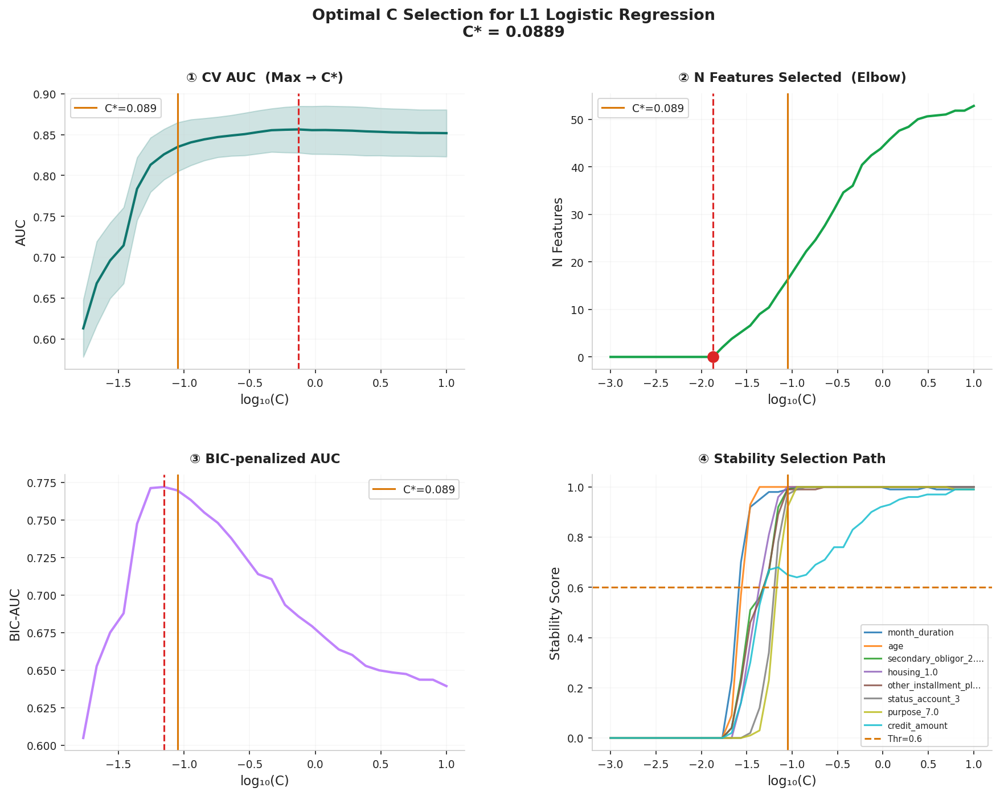

In [26]:
# ======================================================
# 6. BIỂU ĐỒ TRỰC QUAN 4-PANEL (Giữ nguyên giao diện tối cao cấp)
# ======================================================
fig = plt.figure(figsize=(14, 10))
fig.patch.set_facecolor('white')
gs  = gridspec.GridSpec(2, 2, figure=fig, hspace=0.38, wspace=0.32)
PANEL_BG, GOLD, TEAL, CORAL, GREEN, GRAY_LINE, TEXT_COLOR ='white', '#d97706', '#0f766e', '#dc2626', '#16a34a', '#cccccc', '#222222'

def style_ax(ax, title):
    ax.set_facecolor(PANEL_BG)
    for sp in ax.spines.values(): sp.set_edgecolor(GRAY_LINE)
    ax.tick_params(colors=TEXT_COLOR, labelsize=9)
    ax.xaxis.label.set_color(TEXT_COLOR)
    ax.yaxis.label.set_color(TEXT_COLOR)
    ax.set_title(title, color=TEXT_COLOR, fontsize=11, fontweight='bold', pad=10)
    ax.grid(alpha=0.15, color=GRAY_LINE)

log_C = cv_df["log_C"].values

# Ax1 - CV AUC
ax1 = fig.add_subplot(gs[0, 0]); style_ax(ax1, "① CV AUC  (Max → C*)")
ax1.fill_between(log_C, cv_df["AUC_mean"] - cv_df["AUC_std"], cv_df["AUC_mean"] + cv_df["AUC_std"], alpha=0.2, color=TEAL)
ax1.plot(log_C, cv_df["AUC_mean"], color=TEAL, lw=2)
ax1.axvline(np.log10(C_best_auc), color=CORAL, linestyle='--')
ax1.axvline(np.log10(C_optimal), color=GOLD, linestyle='-', label=f"C*={C_optimal:.3f}")
ax1.set_xlabel("log₁₀(C)"); ax1.set_ylabel("AUC"); ax1.legend(facecolor=PANEL_BG, edgecolor=GRAY_LINE, labelcolor=TEXT_COLOR)

# Ax2 - N Features
ax2 = fig.add_subplot(gs[0, 1]); style_ax(ax2, "② N Features Selected  (Elbow)")
ax2.plot(log_C, cv_df["N_features"], color=GREEN, lw=2)
ax2.axvline(np.log10(C_elbow), color=CORAL, linestyle='--')
ax2.axvline(np.log10(C_optimal), color=GOLD, linestyle='-', label=f"C*={C_optimal:.3f}")
ax2.scatter([np.log10(C_elbow)], [cv_df.iloc[elbow_idx]["N_features"]], color=CORAL, s=80, zorder=5)
ax2.set_xlabel("log₁₀(C)"); ax2.set_ylabel("N Features"); ax2.legend(facecolor=PANEL_BG, edgecolor=GRAY_LINE, labelcolor=TEXT_COLOR)

# Ax3 - BIC
ax3 = fig.add_subplot(gs[1, 0]); style_ax(ax3, "③ BIC-penalized AUC")
ax3.plot(log_C, cv_df["BIC_AUC"], color='#c084fc', lw=2)
ax3.axvline(np.log10(C_best_bic), color=CORAL, linestyle='--')
ax3.axvline(np.log10(C_optimal), color=GOLD, linestyle='-', label=f"C*={C_optimal:.3f}")
ax3.set_xlabel("log₁₀(C)"); ax3.set_ylabel("BIC-AUC"); ax3.legend(facecolor=PANEL_BG, edgecolor=GRAY_LINE, labelcolor=TEXT_COLOR)

# Ax4 - Stability Path
ax4 = fig.add_subplot(gs[1, 1]); style_ax(ax4, "④ Stability Selection Path")
mean_stab = np.mean([stability_scores[C] for C in C_GRID], axis=0)
top_idx   = np.argsort(mean_stab)[-8:][::-1]
cmap      = plt.cm.get_cmap('tab10', len(top_idx))

for i, feat_idx in enumerate(top_idx):
    if feat_idx < len(all_features):
        fname = all_features[feat_idx]
        # Xử lý cắt chuỗi bóc tách tiền tố do get_feature_names_out tạo ra (ví dụ cat__ hay num__)
        clean_name = fname.split("__")[-1]
        fname_short = (clean_name[:20] + '…') if len(clean_name) > 20 else clean_name
        stab_curve = [stability_scores[C][feat_idx] for C in C_GRID]
        ax4.plot(log_C, stab_curve, color=cmap(i), lw=1.5, alpha=0.85, label=fname_short)

ax4.axhline(STABILITY_THR, color=GOLD, linestyle='--', label=f"Thr={STABILITY_THR}")
ax4.axvline(np.log10(C_optimal), color=GOLD, linestyle='-')
ax4.set_xlabel("log₁₀(C)"); ax4.set_ylabel("Stability Score"); ax4.set_ylim(-0.05, 1.05)
ax4.legend(fontsize=7, facecolor=PANEL_BG, edgecolor=GRAY_LINE, labelcolor=TEXT_COLOR, loc='lower right')

fig.suptitle(f"Optimal C Selection for L1 Logistic Regression\nC* = {C_optimal:.4f}", color=TEXT_COLOR, fontsize=13, fontweight='bold', y=0.98)
plt.savefig("optimal_C_selection.png", dpi=150, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

In [27]:
# ======================================================
# 7. ÁP DỤNG C* — KIỂM SOÁT THỨ TỰ DỮ LIỆU TUYỆT ĐỐI
# ======================================================
print(f"\n{'='*55}\nÁP DỤNG C* = {C_optimal:.4f} ĐỂ TRÍCH XUẤT ĐẶC TRƯNG GỐC\n{'='*55}")

lasso_optimal = LogisticRegression(penalty='l1', solver='liblinear', C=C_optimal, random_state=RANDOM_STATE, max_iter=5000)
pipeline_optimal = Pipeline([('preprocessor', clone(preprocessor)), ('selector', SelectFromModel(lasso_optimal))])
pipeline_optimal.fit(X_train, y_train)

# Lấy chính xác mặt nạ các biến được chọn
support_mask = pipeline_optimal.named_steps["selector"].get_support()
selected_features_raw = all_features[support_mask]

# GIẢI PHÁP AN TOÀN: Bóc tách ánh xạ ngược về danh sách đặc trưng gốc
selected_original_set = set()
# Sắp xếp giảm dần theo độ dài để tránh lỗi Prefix Collision (ví dụ loan_type đè lên loan)
sorted_cat_features = sorted(categorical_features, key=len, reverse=True)

for sf in selected_features_raw:
    # Loại bỏ tiền tố của encoder (ví dụ: 'num__age' -> 'age', 'cat__purpose_Kinh doanh' -> 'purpose_Kinh doanh')
    clean_feature_name = sf.split("__")[-1] if "__" in sf else sf

    if clean_feature_name in numeric_features:
        selected_original_set.add(clean_feature_name)
    else:
        for oc in sorted_cat_features:
            if clean_feature_name.startswith(oc + "_") or clean_feature_name == oc:
                selected_original_set.add(oc)
                break

# GIẢI PHÁP ĐẢM BẢO TÍNH ĐÚNG ĐẮN: Ép giữ nguyên bản thứ tự cột của X_train gốc (Không dùng set() tùy tiện)
ordered_selected_features = [col for col in X_train.columns if col in selected_original_set]

X_train_selected = X_train[ordered_selected_features]
X_test_selected  = X_test[ordered_selected_features]

print(f"Số lượng đặc trưng gốc được chọn : {len(ordered_selected_features)}")
print(f"Danh sách đặc trưng chuẩn thứ tự : {ordered_selected_features}")

# In Stability Score chính xác với nhãn cột
print(f"\nStability scores thực tế tại C* = {C_optimal:.4f}:")
stab_at_C = stability_scores[C_optimal]
for sf in selected_features_raw:
    idx_ = np.where(all_features == sf)[0]
    if len(idx_) > 0:
        sc = stab_at_C[idx_[0]]
        flag = "✓" if sc >= STABILITY_THR else "⚠"
        clean_name = sf.split("__")[-1]
        print(f"  {flag} {clean_name:<40} stability = {sc:.3f}")


ÁP DỤNG C* = 0.0889 ĐỂ TRÍCH XUẤT ĐẶC TRƯNG GỐC
Số lượng đặc trưng gốc được chọn : 15
Danh sách đặc trưng chuẩn thứ tự : ['status_account', 'month_duration', 'credit_history', 'purpose', 'credit_amount', 'status_and_sex', 'secondary_obligor', 'residence_since', 'collateral', 'age', 'other_installment_plans', 'housing', 'n_credits', 'job', 'is_foreign_worker']

Stability scores thực tế tại C* = 0.0889:
  ✓ month_duration                           stability = 0.990
  ✓ credit_amount                            stability = 0.650
  ✓ age                                      stability = 1.000
  ✓ status_account_3                         stability = 0.970
  ⚠ credit_history_4                         stability = 0.580
  ⚠ status_and_sex_1.0                       stability = 0.230
  ⚠ status_and_sex_3.0                       stability = 0.430
  ✓ secondary_obligor_2.0                    stability = 0.990
  ⚠ residence_since_2                        stability = 0.500
  ⚠ residence_since_3      

In [28]:
import numpy as np
import pandas as pd

# ======================================================
# 8. LỌC ĐẶC TRƯNG BẰNG INFORMATION VALUE (IV & WOE)
# Tiêu chuẩn vàng trong Credit Scoring để loại bỏ biến yếu
# ======================================================

print(f"\n{'='*55}")
print("ÁP DỤNG MÀNG LỌC INFORMATION VALUE (IV)")
print(f"{'='*55}")

def calculate_woe_iv(dataset, feature, target):
    """
    Hàm tính toán Weight of Evidence (WoE) và Information Value (IV) cho một biến.
    Tự động chia bin (decile) đối với biến liên tục.
    """
    df = dataset[[feature, target]].copy()

    # Nếu là biến liên tục (nhiều hơn 10 giá trị duy nhất), chia thành 10 bins (deciles)
    if pd.api.types.is_numeric_dtype(df[feature]) and df[feature].nunique() > 10:
        # Sử dụng qcut để chia quantile, duplicates='drop' để xử lý các bin trùng lặp
        df[feature] = pd.qcut(df[feature], q=10, duplicates='drop')

    # Tính toán số lượng rủi ro (Bads: target=1) và an toàn (Goods: target=0)
    grouped = df.groupby(feature, observed=False)[target].agg(['count', 'sum'])
    grouped.columns = ['Total', 'Bads']
    grouped['Goods'] = grouped['Total'] - grouped['Bads']

    # Kỹ thuật Laplace Smoothing: Cộng thêm 0.5 vào các bin bằng 0
    # để tránh lỗi chia cho 0 hoặc log(0) trong toán học
    grouped['Goods'] = grouped['Goods'].replace(0, 0.5)
    grouped['Bads']  = grouped['Bads'].replace(0, 0.5)

    total_goods = grouped['Goods'].sum()
    total_bads  = grouped['Bads'].sum()

    # Tính tỷ lệ %Goods và %Bads
    grouped['%Goods'] = grouped['Goods'] / total_goods
    grouped['%Bads']  = grouped['Bads'] / total_bads

    # Công thức WoE và IV chuẩn
    grouped['WoE'] = np.log(grouped['%Goods'] / grouped['%Bads'])
    grouped['IV']  = (grouped['%Goods'] - grouped['%Bads']) * grouped['WoE']

    return grouped['IV'].sum()

# ------------------------------------------------------
# Thực thi tính toán IV cho tập selected_features từ Bước 7
# ------------------------------------------------------
# Gộp tạm X_train và y_train để tính toán
df_iv_calc = X_train_selected.copy()
df_iv_calc['target_for_iv'] = y_train.values

iv_results = []
for feat in ordered_selected_features:
    try:
        iv_val = calculate_woe_iv(df_iv_calc, feat, 'target_for_iv')
        iv_results.append({'Feature': feat, 'IV': iv_val})
    except Exception as e:
        print(f"  [Skip] Lỗi tính IV cho biến {feat}: {e}")

iv_df = pd.DataFrame(iv_results).sort_values(by='IV', ascending=False).reset_index(drop=True)

# ------------------------------------------------------
# Phân loại và Áp dụng luật loại bỏ
#   - IV < 0.02: Vô dụng (Loại bỏ)
#   - 0.02 <= IV < 0.1: Yếu (Cân nhắc loại nếu cần ép giảm biến)
#   - IV >= 0.1: Tốt (Giữ lại)
# ------------------------------------------------------
# Thiết lập ngưỡng IV tối thiểu (bạn có thể đổi thành 0.1 nếu muốn cực kỳ khắt khe)
MIN_IV_THRESHOLD = 0.05

final_features_after_iv = []
print(f"{'Feature':<40} | {'IV Score':<10} | {'Sức mạnh':<15} | {'Hành động'}")
print("-" * 85)

for _, row in iv_df.iterrows():
    f_name = row['Feature']
    iv     = row['IV']

    # Đánh giá sức mạnh
    if iv < 0.02:
        power = "Vô dụng"
        action = "❌ Xóa bỏ"
    elif 0.02 <= iv < 0.05:
        power = "Yếu"
        action =  "❌ Xóa bỏ"
    elif 0.05 <= iv < 0.3:
        power = "Trung bình"
        action = "✅ Giữ lại"
    elif 0.3 <= iv < 0.5:
        power = "Mạnh"
        action = "✅ Giữ lại"
    else:
        power = "Cực mạnh (Cảnh báo: Dễ Leakage)"
        action = "✅ Giữ lại"

    if iv >= MIN_IV_THRESHOLD:
        final_features_after_iv.append(f_name)

    print(f"{f_name:<40} | {iv:<10.4f} | {power:<15} | {action}")

# ------------------------------------------------------
# Cập nhật lại tập dữ liệu cuối cùng
# ------------------------------------------------------
X_train_selected = X_train_selected[final_features_after_iv]
X_test_selected  = X_test_selected[final_features_after_iv]

print(f"\nTổng kết lọc IV:")
print(f"  - Số biến ban đầu từ Bước 7 (Lasso) : {len(ordered_selected_features)}")
print(f"  - Số biến bị cắt bỏ do IV < {MIN_IV_THRESHOLD:<4}    : {len(ordered_selected_features) - len(final_features_after_iv)}")
print(f"  - SỐ BIẾN FINAL ĐƯA VÀO BAYESIAN NET: {len(final_features_after_iv)}")


ÁP DỤNG MÀNG LỌC INFORMATION VALUE (IV)
Feature                                  | IV Score   | Sức mạnh        | Hành động
-------------------------------------------------------------------------------------
secondary_obligor                        | 0.6419     | Cực mạnh (Cảnh báo: Dễ Leakage) | ✅ Giữ lại
other_installment_plans                  | 0.6278     | Cực mạnh (Cảnh báo: Dễ Leakage) | ✅ Giữ lại
purpose                                  | 0.6040     | Cực mạnh (Cảnh báo: Dễ Leakage) | ✅ Giữ lại
credit_history                           | 0.5370     | Cực mạnh (Cảnh báo: Dễ Leakage) | ✅ Giữ lại
is_foreign_worker                        | 0.5135     | Cực mạnh (Cảnh báo: Dễ Leakage) | ✅ Giữ lại
housing                                  | 0.4715     | Mạnh            | ✅ Giữ lại
job                                      | 0.4641     | Mạnh            | ✅ Giữ lại
status_account                           | 0.3247     | Mạnh            | ✅ Giữ lại
status_and_sex                       

# Rời rạc hóa dữ liệu bằng K-means (K_Pro)

In [29]:
from sklearn.preprocessing import KBinsDiscretizer, PowerTransformer
import numpy as np
import pandas as pd

# ======================================================
# ADVANCED POWER-TRANSFORM K-MEANS PROCESS CHO BAYESIAN NETWORK
# ======================================================
# Các cột liên tục nằm trong selected_features
continuous_cols_selected = [col for col in numeric_features if col in final_features_after_iv]

# [CẢI TIẾN HIỆN ĐẠI] Khởi tạo Yeo-Johnson Transformer để chuẩn hóa phân phối lệch
pt = PowerTransformer(method='yeo-johnson')

# Khôi phục đúng bản chất K-Means lý thuyết
kbins = KBinsDiscretizer(
    n_bins=4,
    encode='ordinal',
    strategy='kmeans'   # ← Giữ nguyên ý tưởng phân cụm theo mật độ hình học
)

X_train_kpro = X_train_selected.copy()
X_test_kpro  = X_test_selected.copy()

if continuous_cols_selected:
    # Bước 1: Biến đổi không gian dữ liệu sang phân phối đối xứng (Không làm mất dữ liệu như Capping)
    X_train_kpro[continuous_cols_selected] = pt.fit_transform(X_train_selected[continuous_cols_selected])
    X_test_kpro[continuous_cols_selected]  = pt.transform(X_test_selected[continuous_cols_selected])

    # Bước 2: Chạy K-Means ổn định tuyệt đối trên không gian đã chuẩn hóa
    X_train_kpro[continuous_cols_selected] = kbins.fit_transform(X_train_kpro[continuous_cols_selected])
    X_test_kpro[continuous_cols_selected]  = kbins.transform(X_test_kpro[continuous_cols_selected])

# [FIX-2] Ép kiểu int cho TẤT CẢ cột — pgmpy yêu cầu không có float
X_train_kpro = X_train_kpro.round().astype(int)
X_test_kpro  = X_test_kpro.round().astype(int)

# Kiểm tra nhanh: không được có giá trị âm hoặc NaN
assert X_train_kpro.isnull().sum().sum() == 0, "Còn NaN sau discretize!"
assert (X_train_kpro < 0).sum().sum() == 0,    "Còn giá trị âm sau discretize!"

# Ghép target
train_data = X_train_kpro.copy()
train_data['target'] = y_train.values



In [30]:
# ======================================================
# BIN LABELS MAP — CHUẨN XÁC
# Không inverse transform edges (dễ sai)
# Thay bằng: lấy min/max thực tế từ dữ liệu gốc
# trong từng bin → luôn đúng, không bao giờ "0 ~ 0"
# ======================================================

bin_labels_map = {}
for col in continuous_cols_selected:
    x_orig   = X_train_selected[col].values
    x_binned = X_train_kpro[col].values
    is_int = (pd.api.types.is_integer_dtype(X_train_selected[col]) or
              np.all(x_orig == x_orig.astype(int)))

    def fmt(v):
        return str(int(round(v))) if is_int else f"{v:.2f}"

    bin_ids = sorted(np.unique(x_binned))

    # Bước 1: lấy lo/hi thật của từng bin (dùng list để sửa được sau)
    bounds = {}
    for b in bin_ids:
        mask = x_binned == b
        bounds[b] = [x_orig[mask].min(), x_orig[mask].max()]

    # Bước 2: gán max(bin k) = min(bin k+1) — khớp liên tục
    for i in range(len(bin_ids) - 1):
        b_cur, b_next = bin_ids[i], bin_ids[i + 1]
        bounds[b_cur][1] = bounds[b_next][0]

    # Bước 3: build label string (giữ nguyên logic chống "lo==hi" giả)
    bin_labels_map[col] = {}
    for b in bin_ids:
        lo, hi = bounds[b]
        if lo == hi:
            label_str = f"= {fmt(lo)}"
        else:
            label_str = f"{fmt(lo)} ~ {fmt(hi)}"
        bin_labels_map[col][float(b)] = label_str


print("Đã lưu trữ mapping nâng cao cho các cột:", list(bin_labels_map.keys()))

Đã lưu trữ mapping nâng cao cho các cột: ['month_duration', 'credit_amount', 'age']


In [31]:

# In kết quả
print("===== BIN LABELS (GIÁ TRỊ GỐC THỰC TẾ) =====")
for col, mapping in bin_labels_map.items():
    print(f"\nĐặc trưng: {col}")
    print(f"{'Nhãn':^8} | {'Khoảng giá trị':<25} | {'N':>6} | {'Event%':>8}")
    print("-" * 55)

    x_binned = X_train_kpro[col].values
    for idx in sorted(mapping.keys()):
        b     = int(idx)
        mask  = x_binned == b
        n     = mask.sum()
        er    = y_train.values[mask].mean() if n > 0 else 0
        print(f"{b:^8} | {mapping[idx]:<25} | {n:>6} | {er:>8.2%}")

===== BIN LABELS (GIÁ TRỊ GỐC THỰC TẾ) =====

Đặc trưng: month_duration
  Nhãn   | Khoảng giá trị            |      N |   Event%
-------------------------------------------------------
   0     | 4 ~ 9                     |     50 |   14.00%
   1     | 9 ~ 17                    |    274 |   46.35%
   2     | 17 ~ 31                   |    334 |   47.31%
   3     | 31 ~ 60                   |    178 |   70.79%

Đặc trưng: credit_amount
  Nhãn   | Khoảng giá trị            |      N |   Event%
-------------------------------------------------------
   0     | 250 ~ 1068                |    103 |   47.57%
   1     | 1068 ~ 2279               |    304 |   49.01%
   2     | 2279 ~ 5433               |    252 |   43.65%
   3     | 5433 ~ 18424              |    177 |   62.15%

Đặc trưng: age
  Nhãn   | Khoảng giá trị            |      N |   Event%
-------------------------------------------------------
   0     | 19 ~ 25                   |    122 |   57.38%
   1     | 25 ~ 32                

In [32]:
for col in X_train_kpro.columns:
    print(f"\nFeature: {col}")
    print(X_train_kpro[col].unique())


Feature: secondary_obligor
[2 0 1]

Feature: other_installment_plans
[1 0 2]

Feature: purpose
[5 7 1 2 0 8 6 4 3 9]

Feature: credit_history
[0 1 2 3 4]

Feature: is_foreign_worker
[0 1]

Feature: housing
[1 2 0]

Feature: job
[2 1 3 0]

Feature: status_account
[3 2 1 0]

Feature: status_and_sex
[2 3 0 1]

Feature: month_duration
[1 3 2 0]

Feature: credit_amount
[1 3 2 0]

Feature: age
[1 2 3 0]

Feature: collateral
[2 0 1 3]

Feature: residence_since
[1 3 4 2]

Feature: n_credits
[2 1 4 3]


# Xây dựng Mạng Bayesian (BN_Pro)

In [33]:
X_true, X_val, y_true, y_val = train_test_split(X_test_kpro, y_test, test_size=0.5, random_state=42)
# X_val, X_true, y_val, y_true = train_test_split(X_test_kpro, y_test, test_size=0.5, random_state=42)

In [34]:
print(f"Phân phối biến mục tiêu tập test:\n{y_true.value_counts()}")
print(f"Phân phối biến mục tiêu tập val:\n{y_val.value_counts()}")

Phân phối biến mục tiêu tập test:
target
0    137
1     63
Name: count, dtype: int64
Phân phối biến mục tiêu tập val:
target
0    145
1     55
Name: count, dtype: int64


In [35]:
# ======================================================
# 3.4 BN_Pro
# Structure learning: BIC + Tabu search
# Parameter learning: Maximum Likelihood Estimation
# Exact inference: Variable Elimination
# ======================================================
import networkx as nx
from pgmpy.base import DAG
from pgmpy.estimators import HillClimbSearch, MaximumLikelihoodEstimator
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.estimators import ExpertKnowledge

try:
    from pgmpy.estimators import BIC
except ImportError:
    from pgmpy.estimators.StructureScore import BIC


# ======================================================
# CONFIG
# ======================================================

TARGET = "target"
RANDOM_STATE = 42

N_RUNS = 50              # đúng với paper: 50 lần network training
TABU_LENGTH = 100        # Tabu memory
MAX_INDEGREE = 5         # tránh CPT quá lớn
EDGE_PROB = 0.3
MAX_ITER = 1000          # số bước search trong mỗi lần training
THRESHOLD_DEFAULT = 0.5

forbidden_edges = [
    # ('target', 'status_account'),
    # ('target', 'month_duration'),
    # ('target', 'credit_history'),
    # ('target', 'purpose'),
    # ('target', 'credit_amount'),
    # ('target', 'status_savings'),
    # ('target', 'years_employment'),
    # ('target', 'payment_to_income_ratio'),
    # ('target', 'status_and_sex'),
    # ('target', 'secondary_obligor'),
    # ('target', 'residence_since'),
    # ('target', 'collateral'),
    # ('target', 'age'),
    # ('target', 'n_credits'),
    # ('target', 'job'),
    # ('target', 'n_guarantors'),
    # ('target', 'telephone'),
    ('target', 'housing'),
    ('target', 'other_installment_plans'),
    ('target', 'is_foreign_worker')
]
expert_knowledge = ExpertKnowledge(
    forbidden_edges=forbidden_edges
)

# ======================================================
# 1. PREPARE GLOBAL BN DATASET
# ======================================================

X_train_bn = X_train_kpro.copy().round().astype(int)
X_true_bn = X_true.copy().round().astype(int)
X_val_bn = X_val.copy().round().astype(int)

y_train_bn = pd.Series(
    y_train.values,
    index=X_train_bn.index,
    name=TARGET
).astype(int)

y_true_bn = pd.Series(
    y_true.values,
    index=X_true_bn.index,
    name=TARGET
).astype(int)

train_bn = pd.concat([X_train_bn, y_train_bn], axis=1)

# pgmpy nhận dạng dữ liệu rời rạc tốt hơn khi để category
train_bn_cat = train_bn.astype("category")

feature_cols = [col for col in train_bn.columns if col != TARGET]

# Khai báo trạng thái rời rạc cho từng node
state_names = {
    col: sorted(train_bn[col].dropna().unique().tolist())
    for col in train_bn.columns
}

# Prior probability — dùng làm fallback khi VE không tính được
prior_default = float(y_train_bn.mean())

print(f"\nData prepared:")
print(f"  Train : {train_bn.shape}  |  Test : {X_true_bn.shape}")
print(f"  Features : {len(feature_cols)}  |  Prior P(default=1) : {prior_default:.4f}")

# ======================================================
# 2. RANDOM START DAG FOR 50 TRAININGS
# ======================================================

def make_random_start_dag(
    nodes,
    rng,
    edge_prob= EDGE_PROB, #Đồ thị sinh ra sẽ rất dày đặc (dense), các nút kết nối chằng chịt với nhau
    max_indegree= MAX_INDEGREE
):
    """
    Tạo DAG ngẫu nhiên làm điểm khởi đầu cho mỗi Tabu run.

    Mục đích: Random start giúp Tabu khám phá nhiều vùng khác nhau
    của không gian cấu trúc, tránh hội tụ vào local optimum.

    Đảm bảo acyclic (DAG): chỉ cho cạnh từ topo[i] → topo[j] (i<j)
    Constraint: indegree ≤ max_indegree cho mỗi node
    """

    nodes = list(nodes)
    order = nodes.copy()
    rng.shuffle(order)

    dag = DAG()
    dag.add_nodes_from(nodes)
    indegree = {node: 0 for node in nodes}

    for i, parent in enumerate(order):
        for child in order[i + 1:]:
            if indegree[child] >= max_indegree:
                continue
            if rng.random() < edge_prob:
                dag.add_edge(parent, child)
                indegree[child] += 1

    return dag


# ======================================================
# 3. STRUCTURE LEARNING: BIC + TABU SEARCH
# ======================================================

print("\nRunning BIC-Tabu structure learning...")

rng = np.random.default_rng(RANDOM_STATE)

hc = HillClimbSearch(
    train_bn_cat,
    state_names=state_names
)

bic_score = BIC(
    train_bn_cat,
    state_names=state_names
)

best_dag = None
best_bic = -np.inf
training_records = []

for run in range(N_RUNS):
    print(f"  [Run {run+1:2d}/{N_RUNS}] ", end="")

    # Random DAG khởi đầu khác nhau mỗi run
    start_dag = make_random_start_dag(
        nodes=train_bn.columns,
        rng=rng,
        edge_prob=EDGE_PROB,
        max_indegree=MAX_INDEGREE
    )

    # Tabu Search với BIC-d scoring (Section 3.4.1)
    # scoring_method="bic-d": BIC cho biến discrete
    # Q(N) trong pseudocode paper = BIC score của network N
    learned_dag = hc.estimate(
        scoring_method = "bic-d",
        start_dag = start_dag,
        tabu_length = TABU_LENGTH,
        max_indegree = MAX_INDEGREE,
        max_iter = MAX_ITER,
        expert_knowledge = expert_knowledge,
        show_progress = (run == 0)
    )

    # Áp dụng causal constraint: target → feature bị cấm

    candidate_bn = DiscreteBayesianNetwork()
    candidate_bn.add_nodes_from(train_bn.columns)
    candidate_bn.add_edges_from(learned_dag.edges())
    score = bic_score.score(candidate_bn)

    training_records.append({
        "run": run + 1,
        "bic_score": score,
        "n_edges": len(candidate_bn.edges()),
        "edges": list(candidate_bn.edges())
    })

    print(f"BIC={score:,.1f} | Edges={len(learned_dag.edges())}", end="")

    if score > best_bic:
        best_bic = score
        best_dag = learned_dag
        print(" ★ BEST", end="")
    print()

training_summary_df = (
    pd.DataFrame(training_records)
    .sort_values("bic_score", ascending=False)
    .reset_index(drop=True)
)
best_run    = training_summary_df.loc[training_summary_df["bic_score"].idxmax(), "run"]

print("\n--- TOP 5 BIC-TABU TRAINING RESULTS ---")
print(training_summary_df[["run", "bic_score", "n_edges"]].head())

print(f"\n  Best BIC: {best_bic:,.2f}  (Run {best_run})")
print("Best DAG edges:")
print(list(best_dag.edges()))



Data prepared:
  Train : (836, 16)  |  Test : (200, 15)
  Features : 15  |  Prior P(default=1) : 0.5000

Running BIC-Tabu structure learning...
  [Run  1/50] 

  0%|          | 0/1000 [00:00<?, ?it/s]

BIC=-14,829.3 | Edges=17 ★ BEST
  [Run  2/50] BIC=-14,816.3 | Edges=18 ★ BEST
  [Run  3/50] BIC=-14,801.1 | Edges=17 ★ BEST
  [Run  4/50] BIC=-14,799.3 | Edges=16 ★ BEST
  [Run  5/50] BIC=-14,815.3 | Edges=15
  [Run  6/50] BIC=-14,810.7 | Edges=17
  [Run  7/50] BIC=-14,800.8 | Edges=17
  [Run  8/50] BIC=-14,802.4 | Edges=16
  [Run  9/50] BIC=-14,806.2 | Edges=16
  [Run 10/50] BIC=-14,829.5 | Edges=16
  [Run 11/50] BIC=-14,808.7 | Edges=17
  [Run 12/50] BIC=-14,828.9 | Edges=17
  [Run 13/50] BIC=-14,769.0 | Edges=18 ★ BEST
  [Run 14/50] BIC=-14,780.8 | Edges=17
  [Run 15/50] BIC=-14,804.6 | Edges=17
  [Run 16/50] BIC=-14,808.2 | Edges=17
  [Run 17/50] BIC=-14,821.6 | Edges=17
  [Run 18/50] BIC=-14,808.2 | Edges=15
  [Run 19/50] BIC=-14,827.9 | Edges=18
  [Run 20/50] BIC=-14,755.3 | Edges=18 ★ BEST
  [Run 21/50] BIC=-14,778.0 | Edges=19
  [Run 22/50] BIC=-14,837.6 | Edges=19
  [Run 23/50] BIC=-14,818.7 | Edges=18
  [Run 24/50] BIC=-14,837.2 | Edges=16
  [Run 25/50] BIC=-14,783.9 | Edges=

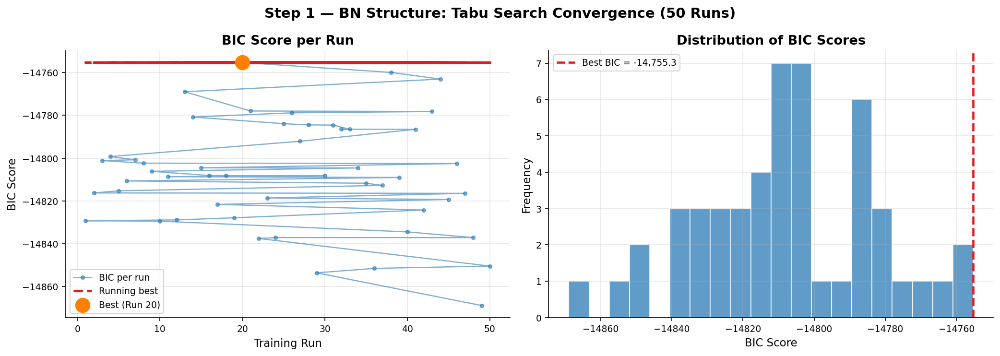

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Step 1 — BN Structure: Tabu Search Convergence (50 Runs)",
             fontsize=14, fontweight="bold")

ax = axes[0]
ax.plot(training_summary_df["run"].tolist(), training_summary_df["bic_score"].tolist(),
        "o-", color=C["bn_blue"], alpha=0.6, markersize=3.5, linewidth=1.2,
        label="BIC per run")
ax.plot(training_summary_df["run"].tolist(), training_summary_df["bic_score"].cummax().tolist(),
        color=C["youden"], linewidth=2.5, linestyle="--", label="Running best")
bidx = training_summary_df["bic_score"].idxmax()

# Explicitly extract scalar values using .item()
run_val = training_summary_df.loc[bidx,"run"].item()
bic_val = training_summary_df.loc[bidx,"bic_score"].item()

ax.scatter(run_val, bic_val,
           s=200, color=C["highlight"], zorder=5,
           label=f"Best (Run {run_val})")
ax.set_xlabel("Training Run"); ax.set_ylabel("BIC Score")
ax.set_title("BIC Score per Run", fontweight="bold"); ax.legend()

ax = axes[1]
ax.hist(training_summary_df["bic_score"], bins=20,
        color=C["bn_blue"], alpha=0.75, edgecolor="white")
ax.axvline(best_bic, color=C["youden"], linestyle="--", linewidth=2.2,
           label=f"Best BIC = {best_bic:,.1f}")
ax.set_xlabel("BIC Score"); ax.set_ylabel("Frequency")
ax.set_title("Distribution of BIC Scores", fontweight="bold"); ax.legend()

plt.tight_layout();
plt.show()

In [37]:
# ============================================================
# STEP 2: BN PARAMETER LEARNING
#         (MLE + Variable Elimination Algorithm)
# ============================================================
# Paper Section 3.4.2 — MLE:
#   θ = argmax_θ L(θ|D)  ,  L(θ|D) = Π P(d_l|θ)
#   log L = Σ_i Σ_j Σ_k  m_ijk · log(θ_ijk)
#   θ*_ijk = m_ijk / Σ_k m_ijk        (frequency estimate)
#   θ_ijk = P(Xi=k | pa(Xi)=j)
#
# Paper Section 3.4.3 — Variable Elimination (VE):
#   P(Q|E=e) ∝ Σ_hidden  Π_i P(Xi | pa(Xi))
#   VE loại dần từng biến ẩn bằng sum-product marginalization
#   Elimination order ρ: ưu tiên node bậc nhỏ nhất
# ============================================================


# ======================================================
# BUILD FINAL GLOBAL BAYESIAN NETWORK
# ======================================================
print("\n" + "═"*68)
print("  MODULE 1 ▸ BN_Pro  |  STEP 2: PARAMETER LEARNING")
print("  Method: Maximum Likelihood Estimation  +  Variable Elimination")
print("═"*68)

bn_model = DiscreteBayesianNetwork()
bn_model.add_nodes_from(best_dag.nodes())
bn_model.add_edges_from(best_dag.edges())

print(f"Final BN: \nNumber of nodes : {len(list(bn_model.nodes()))}")
print("\nNodes in final BN:", list(bn_model.nodes()))

print(f"Number of edges : {len(list(bn_model.edges()))}")
print("Edges in final BN:", list(bn_model.edges()))


# ======================================================
# 5. PARAMETER LEARNING BY MAXIMUM LIKELIHOOD ESTIMATION
# ======================================================

# MLE Parameter Estimation ─────────────────────────────────────
# θ*_ijk = m_ijk / m_ij  (maximum likelihood = relative frequency)
# pgmpy tự động tính CPT cho mỗi node từ tần suất trong training data

print("\nLearning CPT parameters by Maximum Likelihood Estimation...")

try:
    mle = MaximumLikelihoodEstimator(
        model=bn_model,
        data=train_bn_cat,
        state_names=state_names
    )
except TypeError:
    mle = MaximumLikelihoodEstimator(
        model=bn_model,
        data=train_bn_cat
    )

cpds = mle.get_parameters()

bn_model.add_cpds(*cpds)

assert bn_model.check_model(), "BN model is invalid. Check DAG or CPDs."

print("\nMLE parameter learning completed.")
print("\nCPT of target:")
print(bn_model.get_cpds(TARGET))

# ---- In CPT tóm tắt của tất cả nodes -----------------------
print("\n  Summary of all CPDs:")
for cpd in bn_model.cpds:
    n_params = cpd.values.size
    print(f"    Node: {cpd.variable:20s} | Parents: {cpd.variables[1:]} | CPT size: {n_params}")



════════════════════════════════════════════════════════════════════
  MODULE 1 ▸ BN_Pro  |  STEP 2: PARAMETER LEARNING
  Method: Maximum Likelihood Estimation  +  Variable Elimination
════════════════════════════════════════════════════════════════════
Final BN: 
Number of nodes : 16

Nodes in final BN: ['secondary_obligor', 'other_installment_plans', 'purpose', 'credit_history', 'is_foreign_worker', 'housing', 'job', 'status_account', 'status_and_sex', 'month_duration', 'credit_amount', 'age', 'collateral', 'residence_since', 'n_credits', 'target']
Number of edges : 18
Edges in final BN: [('other_installment_plans', 'housing'), ('other_installment_plans', 'target'), ('credit_history', 'n_credits'), ('is_foreign_worker', 'other_installment_plans'), ('is_foreign_worker', 'secondary_obligor'), ('is_foreign_worker', 'target'), ('is_foreign_worker', 'residence_since'), ('housing', 'collateral'), ('month_duration', 'credit_amount'), ('residence_since', 'age'), ('target', 'status_account')

In [38]:
# ============================================================
# 6. VARIABLE ELIMINATION ENGINE
# ============================================================
# Theo paper Section 3.4.3:
#   "We use Variable Elimination (VE) for exact inference."
#   VE là thuật toán suy diễn chính xác (exact inference).
#
# Thuật toán VE (Table 1 trong paper):
#   Input : BN, Evidence E=e, Query Q, Elimination ordering ρ
#   Output: P(Q|E=e)
#
#   Bước 1: Lấy tất cả factor (CPD) từ BN
#   Bước 2: Gán giá trị quan sát e cho evidence variable E
#   Bước 3: Lần lượt eliminate từng biến X trong ρ:
#           - Nhóm tất cả factor chứa X
#           - Nhân các factor đó lại
#           - Marginalize X ra khỏi tích (sum-out X)
#   Bước 4: Nhân tất cả factor còn lại => h(Q)
#   Bước 5: Normalize: P(Q|E=e) = h(Q) / Σ_Q h(Q)
#
# NP-hard problem: Thứ tự elimination ρ ảnh hưởng lớn đến
# độ phức tạp tính toán. pgmpy tự động chọn thứ tự tốt.
# ============================================================

print("\n Initializing Variable Elimination engine...")

# VariableElimination: engine suy diễn chính xác
infer = VariableElimination(bn_model)

print("\n  Variable Elimination engine initialized ✓")

# Markov Blanket(target) = parents ∪ children ∪ parents-of-children
# = tập biến đủ để predict target (d-separates target từ phần còn lại)
parents_of_target  = list(bn_model.get_parents(TARGET))
children_of_target = list(bn_model.get_children(TARGET))
markov_blanket     = list(bn_model.get_markov_blanket(TARGET))

# ---- Quick sanity check: P(target) --------------------------
# Tính prior probability của target không điều kiện
# (không có evidence) để kiểm tra engine hoạt động đúng
try:
    prior_query = infer.query(variables=[TARGET], show_progress=False)
    p_default_ve = float(prior_query.values[1])  # P(target=1) từ VE
    print(f"\n  Sanity check — P(target=1) from VE  : {p_default_ve:.4f}")
    print(f"  Prior P(target=1) from data         : {prior_default:.4f}")
    print(f"  Match: {'OK' if abs(p_default_ve - prior_default) < 0.05 else 'WARNING: mismatch > 0.05'}")
except Exception as e:
    print(f"  Sanity check skipped: {e}")
    p_default_ve = prior_default

# ---- Markov blanket của target ------------------------------
# Markov blanket = parents U children U parents-of-children
# Đây là tập biến đủ để dự đoán target (isolate target từ phần còn lại)

print(f"\n  Parents of target   ({len(parents_of_target)}) : {parents_of_target}")
print(f"  Children of target  ({len(children_of_target)}) : {children_of_target}")
print(f"  Markov Blanket size ({len(markov_blanket)}) : {markov_blanket}")



 Initializing Variable Elimination engine...

  Variable Elimination engine initialized ✓

  Sanity check — P(target=1) from VE  : 0.5000
  Prior P(target=1) from data         : 0.5000
  Match: OK

  Parents of target   (2) : ['other_installment_plans', 'is_foreign_worker']
  Children of target  (8) : ['status_account', 'purpose', 'credit_history', 'job', 'collateral', 'secondary_obligor', 'month_duration', 'status_and_sex']
  Markov Blanket size (11) : ['collateral', 'is_foreign_worker', 'secondary_obligor', 'other_installment_plans', 'purpose', 'month_duration', 'credit_history', 'housing', 'status_account', 'status_and_sex', 'job']


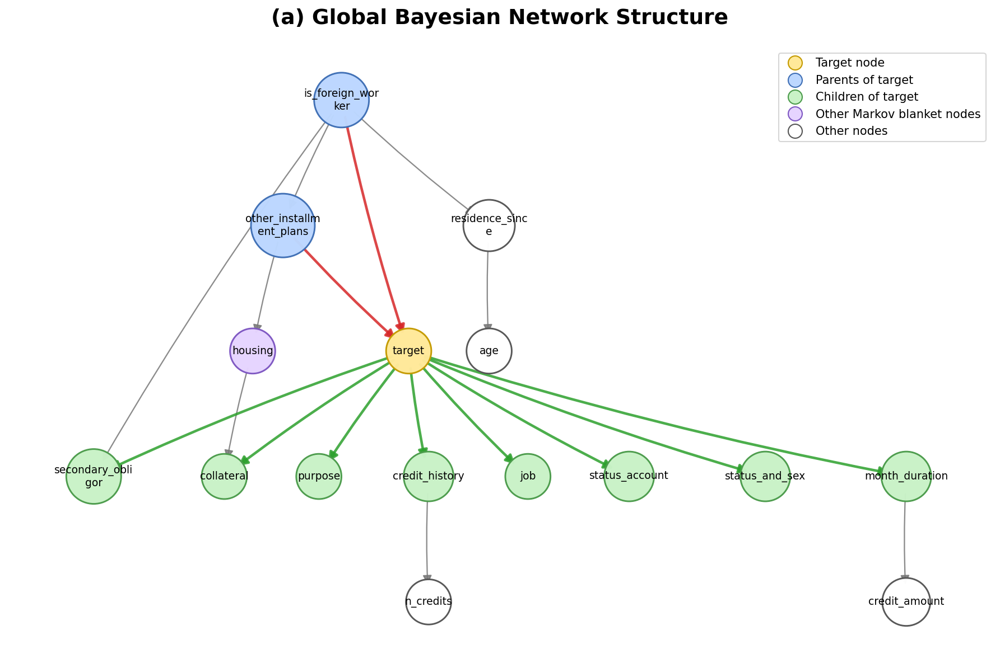

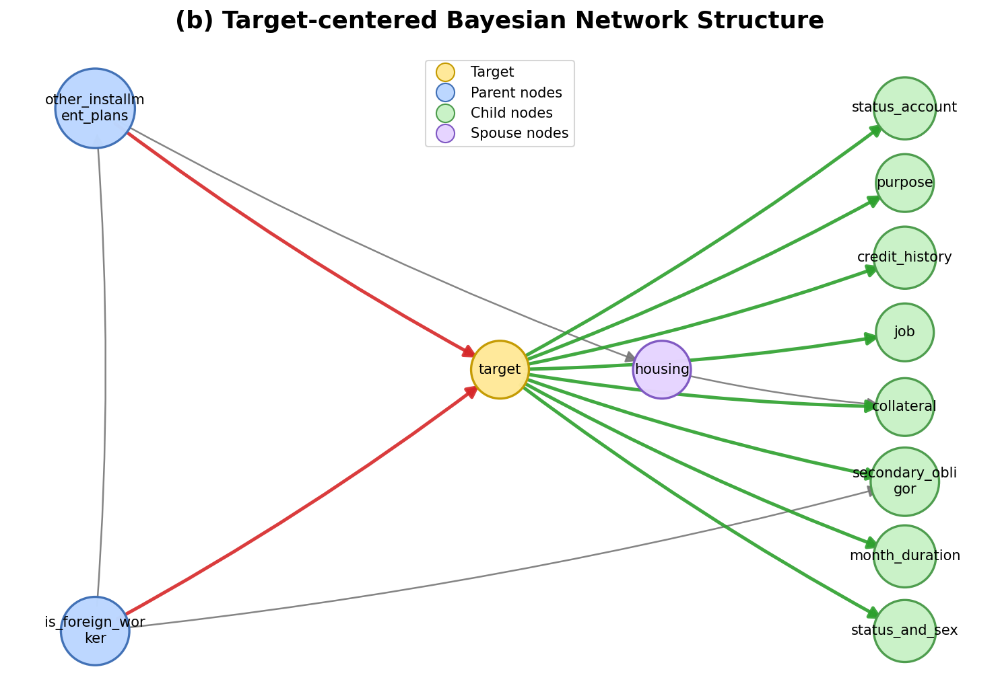


--- TARGET-CENTERED STRUCTURE SUMMARY ---
Target: target
Parents: ['is_foreign_worker', 'other_installment_plans']
Children: ['collateral', 'credit_history', 'job', 'month_duration', 'purpose', 'secondary_obligor', 'status_account', 'status_and_sex']
Spouses: ['housing']
Displayed mode: Markov Blanket of Target


In [39]:
# ======================================================
# 7. VISUALIZATION OF BAYESIAN NETWORK STRUCTURE
#    Figure 1: Global BN
#    Figure 2: Target-centered BN after selecting target
# ======================================================

import textwrap
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# ------------------------------------------------------
# Helper: convert pgmpy model to networkx DiGraph
# ------------------------------------------------------
def build_nx_graph_from_bn(bn_model):
    G = nx.DiGraph()
    G.add_nodes_from(list(bn_model.nodes()))
    G.add_edges_from(list(bn_model.edges()))
    return G


# ------------------------------------------------------
# Helper: wrap long labels
# ------------------------------------------------------
def wrap_node_labels(nodes, width=14):
    return {
        node: "\n".join(textwrap.wrap(str(node), width=width))
        for node in nodes
    }


# ------------------------------------------------------
# Helper: graph layout
# Prefer Graphviz if installed; otherwise fallback to spring layout
# ------------------------------------------------------
def get_bn_layout(G, seed=42):
    try:
        from networkx.drawing.nx_agraph import graphviz_layout
        return graphviz_layout(G, prog="dot")
    except Exception:
        pass

    try:
        from networkx.drawing.nx_pydot import graphviz_layout
        return graphviz_layout(G, prog="dot")
    except Exception:
        pass

    # fallback nếu máy chưa cài graphviz / pygraphviz / pydot
    return nx.spring_layout(
        G,
        seed=seed,
        k=1.4,
        iterations=300
    )


# ------------------------------------------------------
# Helper: target-centered manual layout
# ------------------------------------------------------
def get_target_centered_layout(G, target):
    parents = list(G.predecessors(target))
    children = list(G.successors(target))

    spouses = set()
    for child in children:
        spouses.update(set(G.predecessors(child)))

    spouses = list(spouses - set(parents) - {target})

    pos = {}
    pos[target] = (0.0, 0.0)

    def place_vertical(nodes, x, y_top=1.8, y_bottom=-1.8):
        if len(nodes) == 0:
            return

        if len(nodes) == 1:
            ys = [0.0]
        else:
            ys = np.linspace(y_top, y_bottom, len(nodes))

        for node, y in zip(nodes, ys):
            pos[node] = (x, y)

    place_vertical(parents, x=-3.0)
    place_vertical(children, x=3.0)
    place_vertical(spouses, x=1.2, y_top=-2.2, y_bottom=-4.0)

    # Các node còn lại nếu có
    remaining_nodes = [
        node for node in G.nodes()
        if node not in pos
    ]

    place_vertical(remaining_nodes, x=0.0, y_top=3.0, y_bottom=2.2)

    return pos


# ------------------------------------------------------
# Figure 1: Global Bayesian Network
# ------------------------------------------------------
def plot_global_bn_structure(
    bn_model,
    target,
    title="(a) Global Bayesian Network Structure",
    save_path=None,
    figsize=None
):
    G = build_nx_graph_from_bn(bn_model)

    if figsize is None:
        n_nodes = len(G.nodes())
        figsize = (
            max(12, n_nodes * 0.75),
            max(8, n_nodes * 0.45)
        )

    pos = get_bn_layout(G)
    labels = wrap_node_labels(G.nodes(), width=14)

    target_node = {target}
    parent_nodes = set(G.predecessors(target))
    child_nodes = set(G.successors(target))

    try:
        markov_blanket_nodes = set(bn_model.get_markov_blanket(target))
    except Exception:
        markov_blanket_nodes = parent_nodes | child_nodes

    node_colors = []
    node_edge_colors = []
    node_sizes = []

    for node in G.nodes():
        label_len = len(str(node))
        node_sizes.append(max(1500, label_len * 130))

        if node in target_node:
            node_colors.append("#ffe999")       # yellow target
            node_edge_colors.append("#c49a00")
        elif node in parent_nodes:
            node_colors.append("#bcd7ff")       # blue parents
            node_edge_colors.append("#3f6fb5")
        elif node in child_nodes:
            node_colors.append("#c9f2c7")       # green children
            node_edge_colors.append("#4b9b4b")
        elif node in markov_blanket_nodes:
            node_colors.append("#e6d4ff")       # purple MB
            node_edge_colors.append("#7e57c2")
        else:
            node_colors.append("#ffffff")       # normal nodes
            node_edge_colors.append("#555555")

    edge_colors = []
    edge_widths = []

    for u, v in G.edges():
        if v == target:
            edge_colors.append("#d62728")
            edge_widths.append(2.2)
        elif u == target:
            edge_colors.append("#2ca02c")
            edge_widths.append(2.2)
        else:
            edge_colors.append("#777777")
            edge_widths.append(1.1)

    plt.figure(figsize=figsize)
    ax = plt.gca()
    ax.set_title(title, fontsize=18, fontweight="bold", pad=20)

    nx.draw_networkx_edges(
        G,
        pos,
        arrows=True,
        arrowstyle="-|>",
        arrowsize=16,
        width=edge_widths,
        edge_color=edge_colors,
        alpha=0.85,
        connectionstyle="arc3,rad=0.03",
        min_source_margin=15,
        min_target_margin=15
    )

    nx.draw_networkx_nodes(
        G,
        pos,
        node_color=node_colors,
        edgecolors=node_edge_colors,
        linewidths=1.4,
        node_size=node_sizes,
        alpha=0.98
    )

    nx.draw_networkx_labels(
        G,
        pos,
        labels=labels,
        font_size=9,
        font_weight="normal"
    )

    legend_elements = [
        Line2D([0], [0], marker="o", color="w", label="Target node",
               markerfacecolor="#ffe999", markeredgecolor="#c49a00", markersize=12),
        Line2D([0], [0], marker="o", color="w", label="Parents of target",
               markerfacecolor="#bcd7ff", markeredgecolor="#3f6fb5", markersize=12),
        Line2D([0], [0], marker="o", color="w", label="Children of target",
               markerfacecolor="#c9f2c7", markeredgecolor="#4b9b4b", markersize=12),
        Line2D([0], [0], marker="o", color="w", label="Other Markov blanket nodes",
               markerfacecolor="#e6d4ff", markeredgecolor="#7e57c2", markersize=12),
        Line2D([0], [0], marker="o", color="w", label="Other nodes",
               markerfacecolor="#ffffff", markeredgecolor="#555555", markersize=12),
    ]

    ax.legend(
        handles=legend_elements,
        loc="best",
        frameon=True,
        fontsize=10
    )

    plt.axis("off")
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()


# ------------------------------------------------------
# Figure 2: Target-centered BN after selecting target
# ------------------------------------------------------
def plot_target_centered_bn(
    bn_model,
    target,
    mode="markov_blanket",
    title=None,
    save_path=None,
    figsize=(10, 7)
):
    full_G = build_nx_graph_from_bn(bn_model)

    parents = set(full_G.predecessors(target))
    children = set(full_G.successors(target))

    spouses = set()
    for child in children:
        spouses.update(set(full_G.predecessors(child)))

    spouses = spouses - parents - {target}

    if mode == "parents_only":
        selected_nodes = parents | {target}
        mode_name = "Parents of Target"

    elif mode == "direct":
        selected_nodes = parents | children | {target}
        mode_name = "Direct Dependencies of Target"

    elif mode == "markov_blanket":
        try:
            selected_nodes = set(bn_model.get_markov_blanket(target)) | {target}
        except Exception:
            selected_nodes = parents | children | spouses | {target}
        mode_name = "Markov Blanket of Target"

    else:
        raise ValueError("mode must be one of: 'parents_only', 'direct', 'markov_blanket'.")

    sub_G = full_G.subgraph(selected_nodes).copy()

    if title is None:
        title = f"(b) Target-centered Bayesian Network Structure\n{mode_name}: {target}"

    pos = get_target_centered_layout(sub_G, target)
    labels = wrap_node_labels(sub_G.nodes(), width=14)

    node_colors = []
    node_edge_colors = []
    node_sizes = []

    for node in sub_G.nodes():
        label_len = len(str(node))
        node_sizes.append(max(1700, label_len * 140))

        if node == target:
            node_colors.append("#ffe999")
            node_edge_colors.append("#c49a00")
        elif node in parents:
            node_colors.append("#bcd7ff")
            node_edge_colors.append("#3f6fb5")
        elif node in children:
            node_colors.append("#c9f2c7")
            node_edge_colors.append("#4b9b4b")
        elif node in spouses:
            node_colors.append("#e6d4ff")
            node_edge_colors.append("#7e57c2")
        else:
            node_colors.append("#ffffff")
            node_edge_colors.append("#555555")

    edge_colors = []
    edge_widths = []

    for u, v in sub_G.edges():
        if v == target:
            edge_colors.append("#d62728")
            edge_widths.append(2.4)
        elif u == target:
            edge_colors.append("#2ca02c")
            edge_widths.append(2.4)
        else:
            edge_colors.append("#777777")
            edge_widths.append(1.2)

    plt.figure(figsize=figsize)
    ax = plt.gca()
    ax.set_title(title, fontsize=17, fontweight="bold", pad=18)

    nx.draw_networkx_edges(
        sub_G,
        pos,
        arrows=True,
        arrowstyle="-|>",
        arrowsize=18,
        width=edge_widths,
        edge_color=edge_colors,
        alpha=0.9,
        connectionstyle="arc3,rad=0.04",
        min_source_margin=18,
        min_target_margin=18
    )

    nx.draw_networkx_nodes(
        sub_G,
        pos,
        node_color=node_colors,
        edgecolors=node_edge_colors,
        linewidths=1.6,
        node_size=node_sizes,
        alpha=0.98
    )

    nx.draw_networkx_labels(
        sub_G,
        pos,
        labels=labels,
        font_size=10
    )

    legend_elements = [
        Line2D([0], [0], marker="o", color="w", label="Target",
               markerfacecolor="#ffe999", markeredgecolor="#c49a00", markersize=13),
        Line2D([0], [0], marker="o", color="w", label="Parent nodes",
               markerfacecolor="#bcd7ff", markeredgecolor="#3f6fb5", markersize=13),
        Line2D([0], [0], marker="o", color="w", label="Child nodes",
               markerfacecolor="#c9f2c7", markeredgecolor="#4b9b4b", markersize=13),
        Line2D([0], [0], marker="o", color="w", label="Spouse nodes",
               markerfacecolor="#e6d4ff", markeredgecolor="#7e57c2", markersize=13),
    ]

    ax.legend(
        handles=legend_elements,
        loc="best",
        frameon=True,
        fontsize=10
    )

    plt.axis("off")
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

    print("\n--- TARGET-CENTERED STRUCTURE SUMMARY ---")
    print("Target:", target)
    print("Parents:", sorted(list(parents)))
    print("Children:", sorted(list(children)))
    print("Spouses:", sorted(list(spouses)))
    print("Displayed mode:", mode_name)


# ======================================================
# CALL VISUALIZATION
# ======================================================

plot_global_bn_structure(
    bn_model=bn_model,
    target=TARGET,
    title="(a) Global Bayesian Network Structure",
    save_path="figure_global_bn_structure.png"
)

plot_target_centered_bn(
    bn_model=bn_model,
    target=TARGET,
    mode="markov_blanket",
    title="(b) Target-centered Bayesian Network Structure",
    save_path="figure_target_centered_bn_structure.png"
)

In [40]:
!pip install ipympl

from google.colab import output
output.enable_custom_widget_manager()

# Kích hoạt backend widget cho matplotlib
%matplotlib widget

In [41]:
# ======================================================
# 7. VISUALIZATION OF BAYESIAN NETWORK STRUCTURE
#    Figure 1: Global BN (circular layout, target ở tâm)
#    Figure 2: Target-centered BN sau khi chọn target
#
#    PHIÊN BẢN 3 - ĐỒNG NHẤT KHUNG NODE:
#    - Tất cả node (trừ target) dùng CHUNG 1 kích thước ellipse
#      (lấy max cần thiết qua toàn bộ label) -> khung đồng nhất.
#    - Label dài được chia thành tối đa 2 dòng cân đối (ưu tiên
#      cắt tại dấu "_"), ví dụ "other_installment_plans" ->
#      "other_installment\nplans".
#    - Cạnh là ĐƯỜNG THẲNG, cắt đúng biên ellipse, TẤT CẢ cùng
#      màu xám (không phân loại theo chiều quan hệ với target).
#    - Chỉ TARGET có màu (vàng); tất cả node khác đồng nhất
#      màu xám.
#    - Vẫn giữ layout vòng tròn: target ở tâm, các feature khác
#      chia đều 360 độ quanh target.
# ======================================================

import textwrap
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse, FancyArrowPatch
from matplotlib.lines import Line2D



# ------------------------------------------------------
# Figure 1: Global Bayesian Network (circular layout)
# ------------------------------------------------------
def plot_global_bn_structure(
    bn_model,
    target,
    title="(a) Global Bayesian Network Structure",
    save_path=None,
    figsize=None
):
    G = build_nx_graph_from_bn(bn_model)
    _draw_circular_bn(
        G, target, title, save_path, figsize=figsize,
        legend_other_label="Other features"
    )


# ------------------------------------------------------
# Figure 2: Target-centered BN (circular layout)
# mode: 'parents_only' | 'direct' | 'markov_blanket'
# ------------------------------------------------------
def plot_target_centered_bn(
    bn_model,
    target,
    mode="markov_blanket",
    title=None,
    save_path=None,
    figsize=None
):
    full_G = build_nx_graph_from_bn(bn_model)

    parents = set(full_G.predecessors(target))
    children = set(full_G.successors(target))

    spouses = set()
    for child in children:
        spouses.update(set(full_G.predecessors(child)))
    spouses = spouses - parents - {target}

    if mode == "parents_only":
        selected_nodes = parents | {target}
        mode_name = "Parents of Target"
    elif mode == "direct":
        selected_nodes = parents | children | {target}
        mode_name = "Direct Dependencies of Target"
    elif mode == "markov_blanket":
        try:
            selected_nodes = set(bn_model.get_markov_blanket(target)) | {target}
        except Exception:
            selected_nodes = parents | children | spouses | {target}
        mode_name = "Markov Blanket of Target"
    else:
        raise ValueError("mode must be one of: 'parents_only', 'direct', 'markov_blanket'.")

    sub_G = full_G.subgraph(selected_nodes).copy()

    if title is None:
        title = f"(b) Target-centered Bayesian Network Structure\n{mode_name}: {target}"

    _draw_circular_bn(
        sub_G, target, title, save_path, figsize=figsize,
        legend_other_label="Other features"
    )

    print("\n--- TARGET-CENTERED STRUCTURE SUMMARY ---")
    print("Target:", target)
    print("Parents:", sorted(list(parents)))
    print("Children:", sorted(list(children)))
    print("Spouses:", sorted(list(spouses)))
    print("Displayed mode:", mode_name)



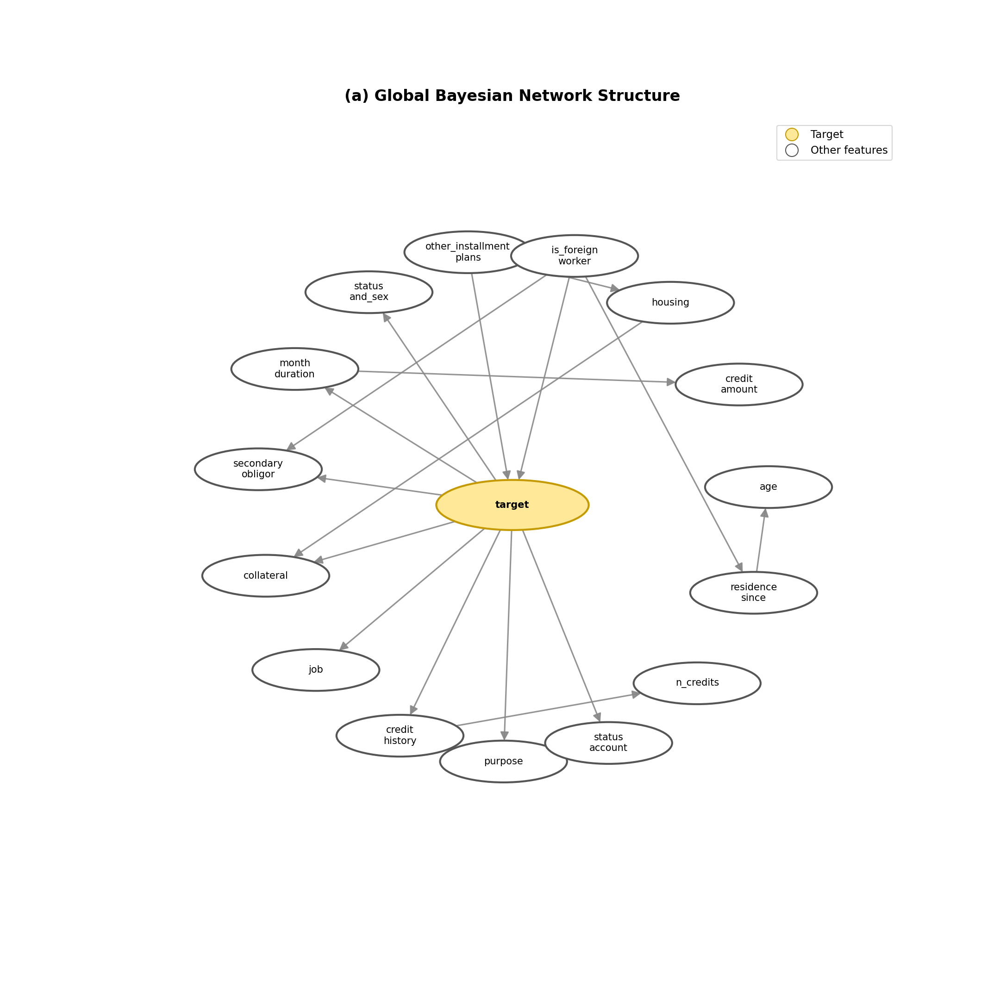

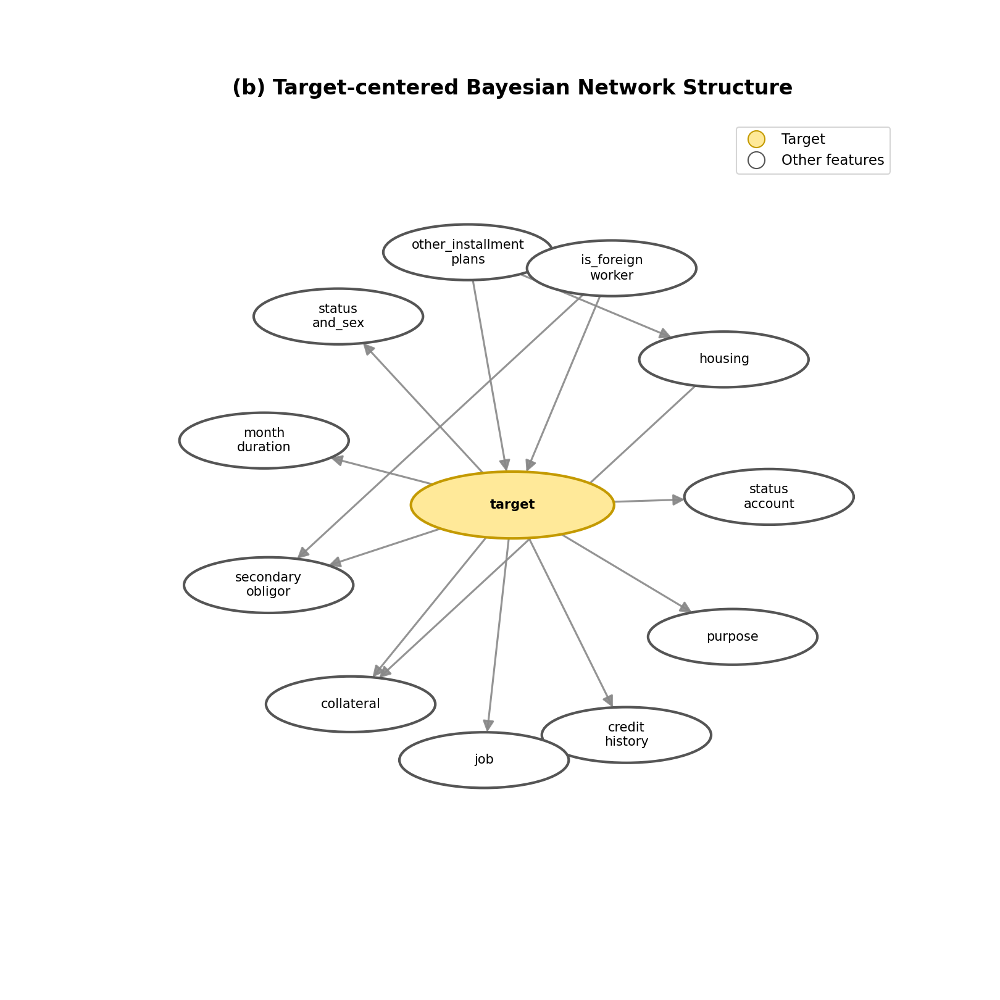


--- TARGET-CENTERED STRUCTURE SUMMARY ---
Target: target
Parents: ['is_foreign_worker', 'other_installment_plans']
Children: ['collateral', 'credit_history', 'job', 'month_duration', 'purpose', 'secondary_obligor', 'status_account', 'status_and_sex']
Spouses: ['housing']
Displayed mode: Markov Blanket of Target


In [42]:
import textwrap
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse, FancyArrowPatch
from matplotlib.lines import Line2D

# ------------------------------------------------------
# 1. Helper: convert pgmpy model to networkx DiGraph
# ------------------------------------------------------
def build_nx_graph_from_bn(bn_model):
    G = nx.DiGraph()
    G.add_nodes_from(list(bn_model.nodes()))
    G.add_edges_from(list(bn_model.edges()))
    return G

# ------------------------------------------------------
# 2. Helper: wrap long labels
# ------------------------------------------------------
def wrap_node_labels(nodes, max_chars_per_line=12):
    labels = {}
    for node in nodes:
        s = str(node)
        if len(s) <= max_chars_per_line:
            labels[node] = s
            continue
        mid = len(s) / 2
        split_positions = [i for i, ch in enumerate(s) if ch in ("_", "-")]
        if split_positions:
            best = min(split_positions, key=lambda i: abs(i - mid))
            line1, line2 = s[:best], s[best + 1:]
        else:
            best = round(mid)
            line1, line2 = s[:best], s[best:]
        labels[node] = f"{line1}\n{line2}"
    return labels

# ------------------------------------------------------
# 3. Layout: Giảm khoảng cách giữa các node (Radius nhỏ hơn)
# ------------------------------------------------------
def get_circular_target_centered_layout(
    G, target, radius=None, start_angle_deg=100, group_order=("parents", "spouses", "others", "children")
):
    other_nodes = [n for n in G.nodes() if n != target]
    n = len(other_nodes)

    # ĐIỀU CHỈNH: Giảm bán kính để các node xích lại gần nhau và gần target hơn
    if radius is None:
        radius = max(3.5, n * 0.55)

    pos = {target: (0.0, 0.0)}
    if n == 0:
        return pos, radius

    parents = [x for x in G.predecessors(target) if x in other_nodes]
    children = [x for x in G.successors(target) if x in other_nodes]

    spouses_set = set()
    for c in children:
        spouses_set.update(G.predecessors(c))
    spouses = [x for x in spouses_set if x not in parents and x not in children and x != target]

    used = set(parents) | set(children) | set(spouses)
    others = [x for x in other_nodes if x not in used]

    groups = {"parents": parents, "spouses": spouses, "others": others, "children": children}
    ordered = []
    for g in group_order:
        ordered.extend(groups.get(g, []))

    ordered = list(dict.fromkeys(ordered))
    missing = [x for x in other_nodes if x not in set(ordered)]
    ordered += missing

    start_angle = np.deg2rad(start_angle_deg)
    angles = start_angle - 2 * np.pi * np.arange(n) / n

    for node, angle in zip(ordered, angles):
        pos[node] = (radius * np.cos(angle), radius * np.sin(angle))

    return pos, radius

# ------------------------------------------------------
# 4. Tính toán Ellipse (Tăng kích thước khung)
# ------------------------------------------------------
def _get_text_size_in_data_coords(ax, fig, text_str, fontsize):
    renderer = fig.canvas.get_renderer()
    t = ax.text(0, 0, text_str, fontsize=fontsize, ha="center", va="center")
    bbox = t.get_window_extent(renderer=renderer)
    t.remove()
    inv = ax.transData.inverted()
    x0, y0 = inv.transform((bbox.x0, bbox.y0))
    x1, y1 = inv.transform((bbox.x1, bbox.y1))
    return abs(x1 - x0), abs(y1 - y0)

def _ellipse_size_for_label(ax, fig, label, fontsize=10, pad_w_factor=1.5, pad_h_factor=2.2):
    # ĐIỀU CHỈNH: Tăng pad_w_factor và pad_h_factor để khung node bự hơn
    lines = label.split("\n")
    widths, heights = [], []
    for line in lines:
        w, h = _get_text_size_in_data_coords(ax, fig, line, fontsize)
        widths.append(w)
        heights.append(h)
    return max(widths) * pad_w_factor, sum(heights) * pad_h_factor

def _get_ellipse_edge_point(center, target_point, width, height):
    cx, cy = center
    tx, ty = target_point
    dx, dy = tx - cx, ty - cy
    a, b = width / 2.0, height / 2.0
    denom = (dx / a) ** 2 + (dy / b) ** 2
    if denom == 0:
        return center
    t = 1.0 / np.sqrt(denom)
    return (cx + dx * t, cy + dy * t)

# ------------------------------------------------------
# 5. Lớp xử lý Kéo - Thả tương tác (Drag & Drop)
# ------------------------------------------------------
class InteractiveBN:
    def __init__(self, fig, ax, pos, sizes, target, ellipse_patches, text_objs, arrow_patches):
        self.fig = fig
        self.ax = ax
        self.pos = pos
        self.sizes = sizes
        self.target = target

        self.ellipse_patches = ellipse_patches
        self.text_objs = text_objs
        self.arrow_patches = arrow_patches

        self.selected_node = None

        self.fig.canvas.mpl_connect('button_press_event', self.on_press)
        self.fig.canvas.mpl_connect('button_release_event', self.on_release)
        self.fig.canvas.mpl_connect('motion_notify_event', self.on_motion)

    def on_press(self, event):
        if event.inaxes != self.ax: return
        # Tìm node bị click
        for node, patch in self.ellipse_patches.items():
            contains, _ = patch.contains(event)
            if contains:
                self.selected_node = node
                break

    def on_release(self, event):
        self.selected_node = None

    def on_motion(self, event):
        if self.selected_node is None or event.inaxes != self.ax:
            return

        # Cập nhật vị trí node
        new_x, new_y = event.xdata, event.ydata
        self.pos[self.selected_node] = (new_x, new_y)

        # Di chuyển Ellipse và Text
        self.ellipse_patches[self.selected_node].set_center((new_x, new_y))
        self.text_objs[self.selected_node].set_position((new_x, new_y))

        # Cập nhật lại tất cả các cạnh (Arrow) liên quan
        for (u, v), arrow in self.arrow_patches.items():
            if u == self.selected_node or v == self.selected_node:
                pu, pv = self.pos[u], self.pos[v]
                wu, hu = self.sizes[u]
                wv, hv = self.sizes[v]

                start = _get_ellipse_edge_point(pu, pv, wu, hu)
                end = _get_ellipse_edge_point(pv, pu, wv, hv)
                arrow.set_positions(start, end)

        self.fig.canvas.draw_idle()

# ------------------------------------------------------
# 6. Core Renderer
# ------------------------------------------------------
def _draw_circular_bn(
    G, target, title, save_path, figsize=None, fontsize=10, legend_other_label="Other features"
):
    pos, radius = get_circular_target_centered_layout(G, target)
    labels = wrap_node_labels(G.nodes(), max_chars_per_line=12)

    n_nodes = G.number_of_nodes()
    if figsize is None:
        side = max(10, n_nodes * 0.9)
        figsize = (side, side)

    # BẮT BUỘC NỀN TRẮNG
    fig, ax = plt.subplots(figsize=figsize, facecolor='white')
    ax.set_facecolor('white')

    ax.set_title(title, fontsize=16, fontweight="bold", pad=20)
    ax.set_aspect("equal", adjustable="box")
    lim = radius * 1.5
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)
    ax.axis("off")
    fig.canvas.draw()

    # Đo kích thước
    raw_sizes = {}
    for node in G.nodes():
        w, h = _ellipse_size_for_label(ax, fig, labels[node], fontsize=fontsize)
        raw_sizes[node] = (w, h)

    other_nodes = [n for n in G.nodes() if n != target]
    if other_nodes:
        common_w = max(raw_sizes[n][0] for n in other_nodes)
        common_h = max(raw_sizes[n][1] for n in other_nodes)
    else:
        common_w, common_h = raw_sizes[target]

    sizes = {node: (common_w, common_h) for node in other_nodes}
    tw, th = raw_sizes[target]
    sizes[target] = (max(tw, common_w) * 1.2, max(th, common_h) * 1.2)

    ellipse_patches = {}
    text_objs = {}
    arrow_patches = {}

# ---------- Vẽ Cạnh (Bắt buộc đường thẳng) ----------
    for u, v in G.edges():
        pu, pv = pos[u], pos[v]
        wu, hu = sizes[u]
        wv, hv = sizes[v]

        start = _get_ellipse_edge_point(pu, pv, wu, hu)
        end = _get_ellipse_edge_point(pv, pu, wv, hv)

        arrow = FancyArrowPatch(
            start, end,
            arrowstyle="-|>",
            mutation_scale=18,
            color="#888888",
            linewidth=1.5,
            alpha=0.9,
            shrinkA=0, shrinkB=0,
            zorder=1,
            connectionstyle="arc3,rad=0.0", # ÉP BUỘC TẤT CẢ LÀ ĐƯỜNG THẲNG
        )
        ax.add_patch(arrow)
        arrow_patches[(u, v)] = arrow

    # Vẽ Node
    for node in G.nodes():
        x, y = pos[node]
        w, h = sizes[node]
        if node == target:
            face, edge, z = "#ffe999", "#c49a00", 5
        else:
            face, edge, z = "#ffffff", "#555555", 4 # Để nền node trắng/sáng cho rõ chữ

        ell = Ellipse((x, y), width=w, height=h, facecolor=face,
                       edgecolor=edge, linewidth=2.0, zorder=z)
        ax.add_patch(ell)
        ellipse_patches[node] = ell

        t = ax.text(x, y, labels[node], ha="center", va="center",
                fontsize=fontsize, fontweight="bold" if node == target else "normal", zorder=z + 1)
        text_objs[node] = t

    legend_elements = [
        Line2D([0], [0], marker="o", color="w", label="Target",
               markerfacecolor="#ffe999", markeredgecolor="#c49a00", markersize=13),
        Line2D([0], [0], marker="o", color="w", label=legend_other_label,
               markerfacecolor="#ffffff", markeredgecolor="#555555", markersize=13),
    ]
    ax.legend(handles=legend_elements, loc="upper right", frameon=True, fontsize=11, facecolor='white')

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')

    # Kích hoạt tính năng kéo thả
    interactive_handler = InteractiveBN(fig, ax, pos, sizes, target, ellipse_patches, text_objs, arrow_patches)

    # Gắn handler vào fig để tránh bị garbage collection xóa mất
    fig._interactive_handler = interactive_handler

    plt.show()

# ======================================================
# CALL VISUALIZATION EXAMPLES
# ======================================================
# Giả sử bạn đã có biến `bn_model` và `TARGET` ở các cell trước đó.
# Bạn gọi hàm như cũ:

plot_global_bn_structure(
    bn_model=bn_model,
    target=TARGET,
    title="(a) Global Bayesian Network Structure",
    save_path="figure_global_bn_structure.png"
)

plot_target_centered_bn(
    bn_model=bn_model,
    target=TARGET,
    mode="markov_blanket",
    title="(b) Target-centered Bayesian Network Structure",
    save_path="figure_target_centered_bn_structure.png"
)

# PREDICTION RESULTS COMPARISON & EVALUATION

In [43]:
# ============================================================
# STEP 3: CAUSAL INFERENCE ON TESTING DATA
# ============================================================
# Áp dụng BN đã học lên testing data để thực hiện causal inference.
# Dùng Variable Elimination (VE) cho mỗi test sample:
#   P(target=1 | X_test_i) = VE exact inference
#
# Hàm predict_probability của pgmpy là batch VE:
#   Với mỗi mẫu i, tính P(target | X_i) bằng VE
#   Fallback về prior nếu evidence OOV (out-of-vocabulary)
# ============================================================

print("\n" + "═"*68)
print("  MODULE 1 ▸ BN_Pro  |  STEP 3: CAUSAL INFERENCE ON TESTING DATA")
print("  Engine: Variable Elimination (Exact Inference)")
print("═"*68)


def nearest_valid_state(value, valid_states):
    """
    Ánh xạ L1-nearest: đưa giá trị về state gần nhất trong state space.
    Giải quyết vấn đề OOV (giá trị trong test chưa thấy trong train).
    """
    value = int(round(value))
    return value if value in valid_states else min(valid_states, key=lambda s: abs(s-value))


def prepare_bn_features(X_raw):
    """
    Chuẩn hóa input DataFrame:
      1. Chọn đúng feature_cols
      2. Ánh xạ mỗi giá trị về valid state (L1-nearest)
      3. Chuyển sang category dtype cho pgmpy
    """
    X = pd.DataFrame(X_raw, columns=feature_cols) if isinstance(X_raw, np.ndarray) else X_raw.copy()
    X = X[feature_cols]
    for col in feature_cols:
        X[col] = X[col].apply(lambda v: nearest_valid_state(v, state_names[col]))
    return X.astype("category")


def bn_predict_proba(X_raw):
    """
    Batch VE prediction: P(target=0), P(target=1) cho toàn bộ dataset.

    Công thức VE (paper Section 3.4.3):
      P(target | X_i) = Normalize(Σ_hidden Π_j P(Xj | pa(Xj)))
    Fallback: prior_default khi evidence không nhất quán.

    Returns: ndarray (n_samples, 2) — [P(default=0), P(default=1)]
    """
    X_bn  = prepare_bn_features(X_raw)
    probs = bn_model.predict_probability(X_bn)
    t1_col, t0_col = f"{TARGET}_1", f"{TARGET}_0"
    probs[t1_col] = probs[t1_col].fillna(prior_default)
    if t0_col not in probs.columns:
        probs[t0_col] = 1 - probs[t1_col]
    probs[t0_col] = probs[t0_col].fillna(1 - prior_default)
    return probs[[t0_col, t1_col]].values


print("\n  Running VE inference on test set...")
y_prob_bn = bn_predict_proba(X_true_bn)[:, 1]   # P(default=1)
y_pred_bn = (y_prob_bn >= THRESHOLD_DEFAULT).astype(int)

n_test = len(y_true)
print(f"  Test samples : {n_test}")
print(f"  P(default=1) range : [{y_prob_bn.min():.4f}, {y_prob_bn.max():.4f}]")
print(f"  Predicted default  : {y_pred_bn.sum()} ({y_pred_bn.mean()*100:.1f}%)")
print(f"  Actual default     : {int(y_true.sum())} ({y_true.mean()*100:.1f}%)")




════════════════════════════════════════════════════════════════════
  MODULE 1 ▸ BN_Pro  |  STEP 3: CAUSAL INFERENCE ON TESTING DATA
  Engine: Variable Elimination (Exact Inference)
════════════════════════════════════════════════════════════════════

  Running VE inference on test set...
  Test samples : 200
  P(default=1) range : [0.0013, 1.0000]
  Predicted default  : 43 (21.5%)
  Actual default     : 63 (31.5%)


In [44]:
# ============================================================
# STEP 4: PREDICTION RESULTS COMPARISON & EVALUATION
# ============================================================
# So sánh kết quả dự đoán của BN với ground truth.
# Metrics đánh giá toàn diện:
#   Classification : Accuracy, Precision, Recall, F1
#   Probabilistic  : ROC-AUC, PR-AUC, Log Loss, Brier Score
#   Calibration    : ECE (Expected Calibration Error)
#   Threshold      : Youden, Closest-(0,1), Symmetry
#   DCA            : Net Benefit analysis
# ============================================================

print("\n" + "═"*68)
print("  MODULE 1 ▸ BN_Pro  |  STEP 4: PREDICTION RESULTS COMPARISON")
print("═"*68)

# ── 4A. Core Metrics ─────────────────────────────────────────────────
acc     = accuracy_score(y_true, y_pred_bn)
prec    = precision_score(y_true, y_pred_bn, zero_division=0)
rec     = recall_score(y_true, y_pred_bn, zero_division=0)
f1      = f1_score(y_true, y_pred_bn, zero_division=0)
roc_auc = roc_auc_score(y_true, y_prob_bn)
pr_auc  = average_precision_score(y_true, y_prob_bn)
ll      = log_loss(y_true, y_prob_bn)

cm_res              = confusion_matrix(y_true, y_pred_bn)
tn, fp, fn, tp_val  = cm_res.ravel()
specificity_val     = tn/(tn+fp) if (tn+fp)>0 else 0
sensitivity_val     = tp_val/(tp_val+fn) if (tp_val+fn)>0 else 0



print(f"\n  {'Metric':<22} {'Value':>8}")
print("  " + "─"*32)
for name, val in [
    ("Accuracy",acc), ("Precision",prec), ("Recall (Sensitivity)",rec),
    ("F1-Score",f1),  ("Specificity",specificity_val),
    ("ROC-AUC",roc_auc), ("PR-AUC",pr_auc),
    ("Log Loss",ll)
]:
    print(f"  {name:<22} {val:>8.4f}")

print(f"\n  Confusion Matrix: TN={tn} FP={fp} FN={fn} TP={tp_val}")
print("\n" + classification_report(y_true, y_pred_bn, target_names=["Non-Default","Default"]))



════════════════════════════════════════════════════════════════════
  MODULE 1 ▸ BN_Pro  |  STEP 4: PREDICTION RESULTS COMPARISON
════════════════════════════════════════════════════════════════════

  Metric                    Value
  ────────────────────────────────
  Accuracy                 0.7300
  Precision                0.6047
  Recall (Sensitivity)     0.4127
  F1-Score                 0.4906
  Specificity              0.8759
  ROC-AUC                  0.7667
  PR-AUC                   0.5421
  Log Loss                 0.9114

  Confusion Matrix: TN=120 FP=17 FN=37 TP=26

              precision    recall  f1-score   support

 Non-Default       0.76      0.88      0.82       137
     Default       0.60      0.41      0.49        63

    accuracy                           0.73       200
   macro avg       0.68      0.64      0.65       200
weighted avg       0.71      0.73      0.71       200



# ROC, PR, DCA


===== ROC-AUC =====
Bayesian Network AUC = 0.7255

===== THREE ROC-BASED OPTIMAL THRESHOLDS =====
       Criterion Notation  Threshold  Sensitivity  Specificity    FPR    TPR
    Youden Index      c_J     0.2619       0.6182       0.7724 0.2276 0.6182
Closest to (0,1)      c_D     0.1895       0.6909       0.6897 0.3103 0.6909
  Symmetry Point      c_S     0.1901       0.6902       0.6902 0.3098 0.6902

===== CLASSIFICATION METRICS AT THREE ROC THRESHOLDS =====
       Criterion Notation  Threshold  Accuracy  Sensitivity  Specificity  Precision  F1_score  TP  FP  TN  FN
    Youden Index      c_J     0.2619     0.735       0.6364       0.7724     0.5147    0.5691  35  33 112  20
Closest to (0,1)      c_D     0.1895     0.695       0.7091       0.6897     0.4643    0.5612  39  45 100  16
  Symmetry Point      c_S     0.1901     0.695       0.7091       0.6897     0.4643    0.5612  39  45 100  16


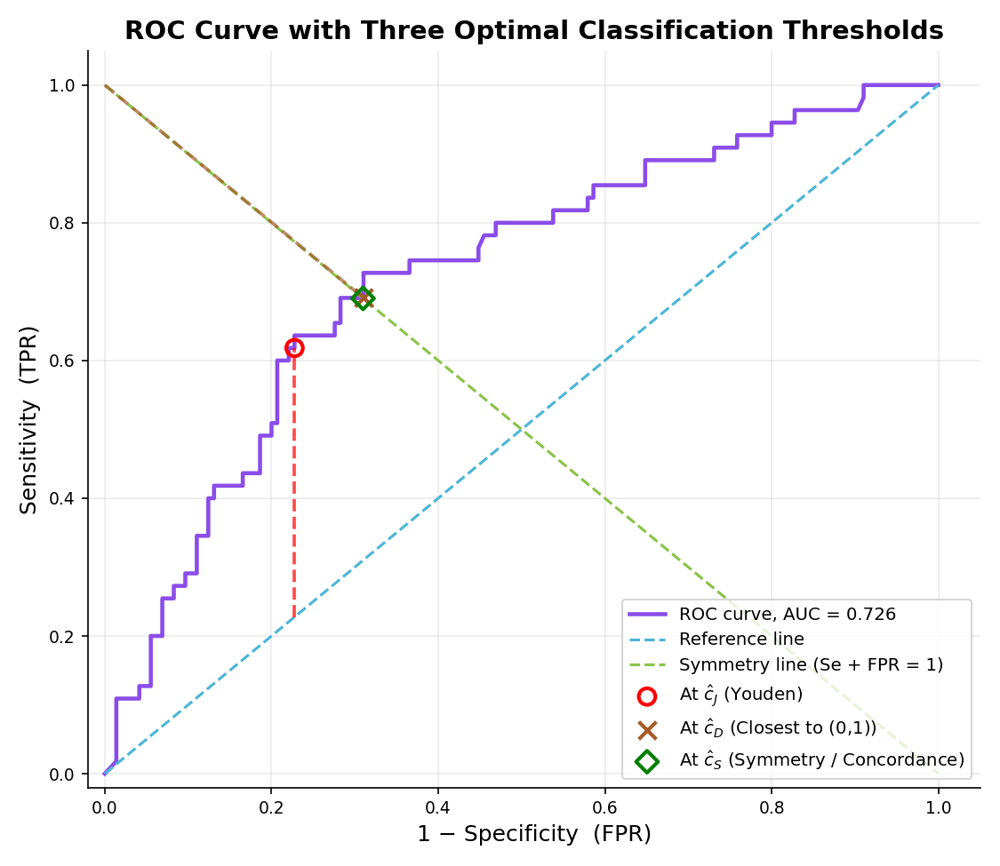

In [45]:
# ======================================================
# FULL SCRIPT: ROC CURVE & THREE OPTIMAL THRESHOLDS
# Phiên bản đã sửa toàn bộ lỗi lý thuyết và kỹ thuật
# ======================================================


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

from sklearn.metrics import (
    roc_curve,
    auc,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# ======================================================
# INPUT
# ======================================================
MODEL_NAME = "Bayesian Network"

y_prob_val = bn_predict_proba(X_val_bn)[:, 1]   # P(default=1)
y_pred_val = (y_prob_val >= THRESHOLD_DEFAULT).astype(int)

y_val = np.asarray(y_val).astype(int)
y_prob_val = np.asarray(y_prob_val).astype(float)
y_prob_val = np.clip(y_prob_val, 0, 1)

# ======================================================
# 1. TÍNH ROC CURVE TỪ SKLEARN
# ======================================================
# sklearn trả về:
#   fpr, tpr: giảm dần theo threshold (tức tăng dần theo FPR)
#   thresholds: giảm dần; phần tử đầu = max(y_prob_val) + 1e-3 (điểm giả)
fpr_raw, tpr_raw, thresholds_raw = roc_curve(y_val, y_prob_val)
roc_auc = auc(fpr_raw, tpr_raw)

print(f"\n===== ROC-AUC =====")
print(f"{MODEL_NAME} AUC = {roc_auc:.4f}")

# ======================================================
# 2. NỘI SUY TPR(FPR) TRỰC TIẾP TRÊN KHÔNG GIAN ROC
#    [FIX-1] [FIX-2] [FIX-4]
#
#    LÝ DO: Đường ROC là tập điểm (FPR, TPR).
#    Nội suy đúng phải là TPR = f(FPR), không phải
#    nội suy FPR(t) và TPR(t) riêng lẻ theo threshold t.
# ======================================================

# Đảm bảo FPR tăng nghiêm ngặt (unique) cho interp1d
# Giữ điểm đầu (0,0) và cuối (1,1) để nội suy bao phủ [0,1]
fpr_unique, unique_idx = np.unique(fpr_raw, return_index=True)
tpr_unique = tpr_raw[unique_idx]

# [FIX-1] Nội suy TPR theo FPR — đúng về hình học ROC
tpr_of_fpr = interp1d(fpr_unique, tpr_unique, kind='linear',
                      bounds_error=False, fill_value=(tpr_unique[0], tpr_unique[-1]))

# Lưới mịn 10,000 điểm trên trục FPR ∈ [0, 1] — đủ chính xác
fine_fpr = np.linspace(0.0, 1.0, 10_000)
fine_tpr = tpr_of_fpr(fine_fpr)
fine_specificity = 1.0 - fine_fpr
fine_sensitivity = fine_tpr

fine_roc_df = pd.DataFrame({
    "FPR":         fine_fpr,
    "Sensitivity": fine_sensitivity,
    "Specificity": fine_specificity,
})

# ======================================================
# 3. TÌM NGƯỠNG TỐI ƯU THEO 3 TIÊU CHÍ
#    (tính trên lưới mịn TPR(FPR) đã nội suy đúng)
# ======================================================

# --- Tiêu chí 1: Youden Index ---
# J(c) = Se(c) + Sp(c) - 1  → tối đa hóa
# Ý nghĩa: tối đa hóa tổng độ nhạy và độ đặc hiệu đồng thời
fine_roc_df["Youden_Index"] = fine_sensitivity + fine_specificity - 1.0

# --- Tiêu chí 2: Closest to (0,1) — khoảng cách Euclidean thực ---
# [FIX-3] D(c) = sqrt((1-Se)² + (1-Sp)²) → tối thiểu hóa
# Gốc có D² thay vì D; minimize D² ≡ minimize D về mặt kết quả,
# nhưng tên và giá trị in ra phải là khoảng cách thực.
fine_roc_df["Distance_to_01"] = np.sqrt(
    (1.0 - fine_sensitivity) ** 2 + (1.0 - fine_specificity) ** 2
)

# --- Tiêu chí 3: Symmetry Point (Concordance Point) ---
# [FIX-6] Điểm giao của đường ROC với đường Se = Sp,
# tương đương đường Se + FPR = 1 (hay TPR = 1 - FPR).
# Khoảng cách vuông góc từ điểm ROC đến đường này:
#   gap = |Se + FPR - 1| / sqrt(2)  → tối thiểu hóa
# Thuật ngữ: "Symmetry Point" hoặc "Concordance Threshold"
# (Liu, 2012; Perkins & Schisterman, 2006)
fine_roc_df["Symmetry_Gap"] = (
    np.abs(fine_sensitivity + fine_fpr - 1.0) / np.sqrt(2)
)

# Trích xuất điểm tối ưu trên lưới mịn
idx_youden   = fine_roc_df["Youden_Index"].idxmax()
idx_closest  = fine_roc_df["Distance_to_01"].idxmin()
idx_symmetry = fine_roc_df["Symmetry_Gap"].idxmin()

point_youden   = fine_roc_df.loc[idx_youden]
point_closest  = fine_roc_df.loc[idx_closest]
point_symmetry = fine_roc_df.loc[idx_symmetry]

# ======================================================
# 4. TÌM THRESHOLD TƯƠNG ỨNG VỚI MỖI ĐIỂM FPR TỐI ƯU
#    Tra ngược: threshold(FPR*) qua nội suy threshold(FPR)
# ======================================================
# Loại bỏ điểm đặc biệt (threshold > 1) trước khi tra ngược
valid_mask = thresholds_raw <= 1.0
fpr_valid  = fpr_raw[valid_mask]
thr_valid  = thresholds_raw[valid_mask]

# FPR tăng đơn điệu → threshold giảm đơn điệu; dùng flip để interp1d hợp lệ
fpr_for_thr = np.flip(fpr_valid)
thr_for_fpr = np.flip(thr_valid)
fpr_u2, u2_idx = np.unique(fpr_for_thr, return_index=True)
thr_u2 = thr_for_fpr[u2_idx]

threshold_of_fpr = interp1d(fpr_u2, thr_u2, kind='linear',
                            bounds_error=False,
                            fill_value=(thr_u2[0], thr_u2[-1]))

def get_threshold(fpr_val):
    """Tra ngược threshold từ giá trị FPR tối ưu."""
    return float(threshold_of_fpr(fpr_val))

# # Bảng tổng hợp 3 ngưỡng tối ưu
threshold_summary = pd.DataFrame([
    {
        "Criterion":   "Youden Index",
        "Notation":    "c_J",
        "Threshold":   get_threshold(point_youden["FPR"]),
        "Sensitivity": float(point_youden["Sensitivity"]),
        "Specificity": float(point_youden["Specificity"]),
        "FPR":         float(point_youden["FPR"]),
        "TPR":         float(point_youden["Sensitivity"]),
    },
    {
        "Criterion":   "Closest to (0,1)",
        "Notation":    "c_D",
        "Threshold":   get_threshold(point_closest["FPR"]),
        "Sensitivity": float(point_closest["Sensitivity"]),
        "Specificity": float(point_closest["Specificity"]),
        "FPR":         float(point_closest["FPR"]),
        "TPR":         float(point_closest["Sensitivity"]),
    },
    {
        "Criterion":   "Symmetry Point",
        "Notation":    "c_S",
        "Threshold":   get_threshold(point_symmetry["FPR"]),
        "Sensitivity": float(point_symmetry["Sensitivity"]),
        "Specificity": float(point_symmetry["Specificity"]),
        "FPR":         float(point_symmetry["FPR"]),
        "TPR":         float(point_symmetry["Sensitivity"]),
    },
])

print("\n===== THREE ROC-BASED OPTIMAL THRESHOLDS =====")
print(threshold_summary.round(4).to_string(index=False))

# ======================================================
# 5. ĐÁNH GIÁ CHỈ SỐ PHÂN LOẠI TẠI 3 NGƯỠNG
#    [FIX-5] Bỏ cột Recall thừa (Recall ≡ Sensitivity)
# ======================================================
def evaluate_threshold(y_val, y_prob_val, threshold):
    """Tính các chỉ số phân loại tại một ngưỡng cụ thể."""
    y_pred = (y_prob_val >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    return {
        "Threshold":   threshold,
        "Accuracy":    accuracy_score(y_val, y_pred),
        "Sensitivity": sensitivity,           # = Recall = TPR
        "Specificity": specificity,           # = 1 - FPR
        "Precision":   precision_score(y_val, y_pred, zero_division=0),
        "F1_score":    f1_score(y_val, y_pred, zero_division=0),
        "TP": tp, "FP": fp, "TN": tn, "FN": fn,
    }

metric_records = []
for _, row in threshold_summary.iterrows():
    metrics = evaluate_threshold(y_val, y_prob_val, row["Threshold"])
    metrics["Criterion"] = row["Criterion"]
    metrics["Notation"]  = row["Notation"]
    metric_records.append(metrics)

threshold_metrics_df = pd.DataFrame(metric_records)[[
    "Criterion", "Notation", "Threshold",
    "Accuracy", "Sensitivity", "Specificity", "Precision", "F1_score",
    "TP", "FP", "TN", "FN"
]]

print("\n===== CLASSIFICATION METRICS AT THREE ROC THRESHOLDS =====")
print(threshold_metrics_df.round(4).to_string(index=False))

# ======================================================
# 6. ĐỒ THỊ ROC + ĐƯỜNG GIÓNG HÌNH HỌC
#    [FIX-7] Vẽ đường ROC từ (fpr_raw, tpr_raw) của sklearn,
#    không vẽ đường nội suy thay thế đường ROC gốc.
# ======================================================
fig, ax = plt.subplots(figsize=(7.5, 6.5))

# --- Đường ROC gốc từ sklearn (piecewise-linear, chính xác) ---
ax.plot(fpr_raw, tpr_raw,
        color="#8b4de8", linewidth=2.2,
        label=f"ROC curve, AUC = {roc_auc:.3f}")

# --- Đường tham chiếu (random classifier) ---
ax.plot([0, 1], [0, 1],
        linestyle="--", color="#4db6d6", linewidth=1.5,
        label="Reference line")

# --- Đường đối xứng: Se + FPR = 1  ↔  TPR = 1 − FPR ---
ax.plot([0, 1], [1, 0],
        linestyle="--", color="#8bc34a", linewidth=1.5,
        label="Symmetry line (Se + FPR = 1)")

# Đọc lại tọa độ từ bảng tổng hợp
xj = threshold_summary.loc[threshold_summary.Notation == "c_J", "FPR"].values[0]
yj = threshold_summary.loc[threshold_summary.Notation == "c_J", "TPR"].values[0]
xd = threshold_summary.loc[threshold_summary.Notation == "c_D", "FPR"].values[0]
yd = threshold_summary.loc[threshold_summary.Notation == "c_D", "TPR"].values[0]
xs = threshold_summary.loc[threshold_summary.Notation == "c_S", "FPR"].values[0]
ys = threshold_summary.loc[threshold_summary.Notation == "c_S", "TPR"].values[0]

# --- ĐIỂM 1: Youden Index (c_J) ---
# Gióng thẳng đứng từ c_J xuống đường tham chiếu y = x tại (xj, xj)
ax.scatter(xj, yj, marker="o", s=80,
           facecolors="none", edgecolors="red", linewidths=2,
           label=r"At $\hat{c}_J$ (Youden)", zorder=5)
ax.plot([xj, xj], [xj, yj],
        linestyle="--", color="red", linewidth=1.8, alpha=0.7)

# --- ĐIỂM 2: Closest to (0,1) (c_D) ---
# Nối trực tiếp từ góc hoàn hảo (0,1) đến c_D
ax.scatter(xd, yd, marker="x", s=90,
           color="#a65a2a", linewidths=2,
           label=r"At $\hat{c}_D$ (Closest to (0,1))", zorder=5)
ax.plot([0, xd], [1, yd],
        linestyle="--", color="#a65a2a", linewidth=1.8, alpha=0.7)

# --- ĐIỂM 3: Symmetry Point (c_S) ---
# Chiếu vuông góc từ c_S lên đường Se + FPR = 1
# Công thức hình chiếu của (xs, ys) lên đường x + y = 1:
#   proj = ((xs - ys + 1)/2,  (ys - xs + 1)/2)
proj_x = (xs - ys + 1.0) / 2.0
proj_y = (ys - xs + 1.0) / 2.0
ax.scatter(xs, ys, marker="D", s=70,
           facecolors="none", edgecolors="green", linewidths=2,
           label=r"At $\hat{c}_S$ (Symmetry / Concordance)", zorder=5)
ax.plot([xs, proj_x], [ys, proj_y],
        linestyle="--", color="green", linewidth=1.8, alpha=0.7)

# --- Cấu hình khung đồ thị ---
ax.set_xlim(-0.02, 1.05)
ax.set_ylim(-0.02, 1.05)
ax.set_xlabel("1 − Specificity  (FPR)", fontsize=12)
ax.set_ylabel("Sensitivity  (TPR)", fontsize=12)
ax.set_title("ROC Curve with Three Optimal Classification Thresholds",
             fontsize=14, fontweight="bold")
ax.grid(alpha=0.25)
ax.legend(loc="lower right", fontsize=9.5)

plt.tight_layout()
plt.show()


===== NET BENEFIT AT THREE ROC-OPTIMAL THRESHOLDS =====
(Note: DCA evaluates strategies across all c, not selects a single threshold)
       Criterion Notation  Threshold (c)  NB Model  NB Treat All  NB Treat None Delta NB (baseline)  Delta NB
    Youden Index      c_J         0.2619    0.1164        0.0177            0.0        vs Treat All    0.0987
Closest to (0,1)      c_D         0.1895    0.1474        0.1055            0.0        vs Treat All    0.0419
  Symmetry Point      c_S         0.1901    0.1467        0.1049            0.0        vs Treat All    0.0419


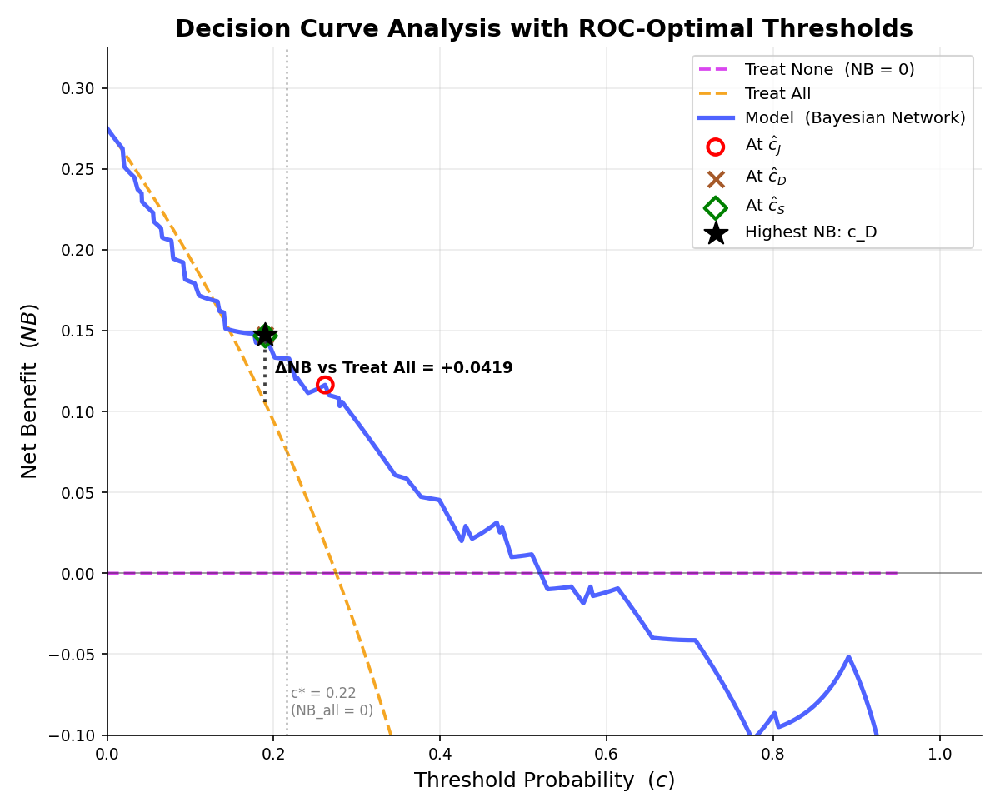


===== DCA SUMMARY =====
Prevalence               : 0.2750
c* (NB_treat_all = 0)    : 0.2157
Clinically useful range  : c ∈ [0.00, 0.22]

Highest NB among 3 ROC thresholds: c_D (c = 0.1895, NB = 0.1474)
Note: This is a supplementary comparison, not a DCA-based threshold selection.


In [46]:
# ======================================================
# DECISION CURVE ANALYSIS
# ======================================================


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# ======================================================
#  các biến dưới đây đã có từ script 1
#   y_val, y_prob_val          — dữ liệu thực tế
#   fpr_raw, tpr_raw, thresholds_raw  — từ roc_curve()
#   threshold_summary       — bảng 3 ngưỡng tối ưu ROC
#   roc_auc, MODEL_NAME
# ======================================================

prevalence = float(np.mean(y_val))

# ======================================================
# 1. XÂY DỰNG HÀM Se(c) VÀ Sp(c) TỪ DỮ LIỆU SKLEARN
#    [FIX-1] [FIX-2]
#
#    Lưới DCA là lưới c độc lập ∈ (0, 1).
#    Se(c) và Sp(c) được tra từ đường ROC:
#      - sklearn trả về (threshold → FPR, TPR)
#      - Ta nội suy TPR(c) và FPR(c) theo threshold c
#        (đây là nội suy hợp lệ: threshold → metric,
#         không phải nội suy ROC space như ở script 1)
# ======================================================

# Loại bỏ điểm đặc biệt (threshold > 1) của sklearn
valid_mask  = thresholds_raw <= 1.0
thr_valid   = thresholds_raw[valid_mask]   # giảm dần
fpr_valid   = fpr_raw[valid_mask]
tpr_valid   = tpr_raw[valid_mask]

# Đảo chiều để threshold tăng dần → interp1d hợp lệ
thr_asc = np.flip(thr_valid)
fpr_asc = np.flip(fpr_valid)
tpr_asc = np.flip(tpr_valid)

# Loại trùng lặp (cùng threshold cho kết quả FPR/TPR khác nhau rất hiếm
# nhưng np.unique đảm bảo interp1d không gặp lỗi)
thr_u, u_idx  = np.unique(thr_asc, return_index=True)
fpr_u = fpr_asc[u_idx]
tpr_u = tpr_asc[u_idx]

# Hàm nội suy Se(c) và Sp(c) theo ngưỡng c
# fill_value extrapolate = giữ giá trị biên nếu c nằm ngoài phạm vi observed
se_of_c = interp1d(thr_u, tpr_u, kind='linear',
                   bounds_error=False,
                   fill_value=(tpr_u[0], tpr_u[-1]))
fpr_of_c = interp1d(thr_u, fpr_u, kind='linear',
                    bounds_error=False,
                    fill_value=(fpr_u[0], fpr_u[-1]))

def sp_of_c(c):
    return 1.0 - fpr_of_c(c)

# ======================================================
# 2. CÔNG THỨC NET BENEFIT (Vickers & Elkin, 2006)
# ======================================================
def net_benefit_model(c, prevalence):
    """
    NB(c) = p·Se(c) − (1−p)·(1−Sp(c))·[c/(1−c)]
    Clip c để tránh chia cho 0 tại biên.
    """
    c = np.clip(c, 1e-6, 1.0 - 1e-6)
    se  = se_of_c(c)
    sp  = sp_of_c(c)
    nb  = prevalence * se - (1.0 - prevalence) * (1.0 - sp) * (c / (1.0 - c))
    return nb

def net_benefit_treat_all(c, prevalence):
    """
    NB_all(c) = p − (1−p)·[c/(1−c)]
    Tương đương Se=1, Sp=0 (điều trị tất cả).
    """
    c = np.clip(c, 1e-6, 1.0 - 1e-6)
    return prevalence - (1.0 - prevalence) * (c / (1.0 - c))

# ======================================================
# 3. LƯỚI C ĐỘC LẬP CHO DCA
#    [FIX-4] Giới hạn thực hành: c_max nhỏ hơn giá trị
#    mà NB_treat_all = 0, tức c* = prevalence / (1 + prevalence)
#    Ngoài điểm này, Treat All luôn kém hơn Treat None
#    và DCA mất ý nghĩa lâm sàng.
# ======================================================

# Điểm c* mà NB_treat_all(c*) = 0 → c* = p / (1+p)
c_star    = prevalence / (1.0 + prevalence)
c_max_plot = 0.95   # mở rộng thêm 0.10 để thấy điểm giao
c_min_plot = 0


# Lưới DCA: 2,000 điểm độc lập
c_grid = np.linspace(c_min_plot, c_max_plot, 2_000)

dca_df = pd.DataFrame({
    "c":                   c_grid,
    "Net_Benefit_Model":   net_benefit_model(c_grid, prevalence),
    "Net_Benefit_Treat_All": net_benefit_treat_all(c_grid, prevalence),
    "Net_Benefit_Treat_None": 0.0,
})

# ======================================================
# 4. PHÂN TÍCH PHỤ: NB TẠI 3 NGƯỠNG ROC TỐI ƯU
#    [FIX-3] Đây là bảng so sánh phụ, KHÔNG phải
#    "Best by DCA". DCA không chọn ngưỡng — nó đánh giá
#    lợi ích mô hình trên toàn vùng c.
# ======================================================
nb_records = []
for _, row in threshold_summary.iterrows():
    c  = float(row["Threshold"])
    nb_m   = float(net_benefit_model(c, prevalence))
    nb_all = float(net_benefit_treat_all(c, prevalence))

    # [FIX-6] Delta NB so với baseline thích hợp
    # Nếu NB_all > 0: mô hình cần vượt Treat All để có ý nghĩa
    # Nếu NB_all ≤ 0: baseline là Treat None (= 0)
    if nb_all > 0:
        baseline_label = "vs Treat All"
        delta_nb = nb_m - nb_all
    else:
        baseline_label = "vs Treat None"
        delta_nb = nb_m

    nb_records.append({
        "Criterion":             row["Criterion"],
        "Notation":              row["Notation"],
        "Threshold (c)":         c,
        "NB Model":              nb_m,
        "NB Treat All":          nb_all,
        "NB Treat None":         0.0,
        "Delta NB (baseline)":   baseline_label,
        "Delta NB":              delta_nb,
    })

nb_summary = pd.DataFrame(nb_records)

print("\n===== NET BENEFIT AT THREE ROC-OPTIMAL THRESHOLDS =====")
print("(Note: DCA evaluates strategies across all c, not selects a single threshold)")
print(nb_summary.round(4).to_string(index=False))

# Ngưỡng có NB Model cao nhất trong 3 — chỉ dùng làm tham chiếu phụ
best_idx     = nb_summary["NB Model"].idxmax()
best_row     = nb_summary.loc[best_idx]
best_c       = float(best_row["Threshold (c)"])
best_nb      = float(best_row["NB Model"])
best_notation = best_row["Notation"]

# ======================================================
# 5. ĐỒ THỊ DCA CHUẨN
#    [FIX-1] Trục X = lưới c độc lập, KHÔNG phải cột threshold ROC
#    [FIX-4] Giới hạn trục X thực hành
# ======================================================

# Giới hạn trục Y: không hiển thị vùng NB âm sâu vô nghĩa
nb_max = max(dca_df["Net_Benefit_Model"].max(),
             dca_df["Net_Benefit_Treat_All"].max(),
             prevalence) + 0.05
nb_min = -0.1   # Cho phép thấy nhẹ vùng âm quanh điểm giao

fig, ax = plt.subplots(figsize=(8, 6.5))

# --- 3 đường nền DCA ---
ax.plot(dca_df["c"], dca_df["Net_Benefit_Treat_None"],
        linestyle="--", color="#d946ef", linewidth=1.8, label="Treat None  (NB = 0)")
ax.plot(dca_df["c"], dca_df["Net_Benefit_Treat_All"],
        linestyle="--", color="#f5a623", linewidth=1.8, label="Treat All")
ax.plot(dca_df["c"], dca_df["Net_Benefit_Model"],
        color="#4f63ff", linewidth=2.5, label=f"Model  ({MODEL_NAME})")

# --- Đánh dấu 3 điểm ngưỡng ROC trên đường DCA ---
for _, row in nb_summary.iterrows():
    c_pt = float(row["Threshold (c)"])
    nb_pt = float(row["NB Model"])

    if row["Notation"] == "c_J":
        marker, color, label = "o", "red", r"At $\hat{c}_J$"
        kw = dict(facecolors="none", edgecolors=color)
    elif row["Notation"] == "c_D":
        marker, color, label = "x", "#a65a2a", r"At $\hat{c}_D$"
        kw = dict(color=color)
    else:
        marker, color, label = "D", "green", r"At $\hat{c}_S$"
        kw = dict(facecolors="none", edgecolors=color)

    ax.scatter(c_pt, nb_pt, marker=marker, s=80, linewidths=2, zorder=5,
               label=label, **kw)

# --- Ngôi sao: ngưỡng có NB cao nhất trong 3 (chỉ tham chiếu) ---
ax.scatter(best_c, best_nb, marker="*", s=200, color="black", zorder=6,
           label=f"Highest NB: {best_notation}")

# --- Đường gióng tại ngưỡng có NB cao nhất ---
# [FIX-6] Xác định baseline đúng để tính ΔNB
nb_all_at_best = float(net_benefit_treat_all(best_c, prevalence))
if nb_all_at_best > 0:
    ymin_line = nb_all_at_best
    delta_label = f"ΔNB vs Treat All = {best_nb - ymin_line:+.4f}"
else:
    ymin_line = 0.0
    delta_label = f"ΔNB vs Treat None = {best_nb:+.4f}"

ax.vlines(x=best_c, ymin=ymin_line, ymax=best_nb,
          linestyle=":", color="black", linewidth=1.8, alpha=0.75)

# [FIX-5] Offset cố định để tránh label bị cắt rìa phải
text_x_offset = 0.012
ax.text(x=best_c + text_x_offset,
        y=(ymin_line + best_nb) / 2.0,
        s=delta_label,
        fontsize=9, fontweight="bold", color="black", va="center")

# --- Đường dọc tại điểm c* (NB_treat_all = 0) ---
ax.axvline(x=c_star, linestyle=":", color="gray", linewidth=1.2, alpha=0.6)
ax.text(x=c_star + 0.005, y=nb_min + 0.01,
        s=f"c* = {c_star:.2f}\n(NB_all = 0)",
        fontsize=8, color="gray", va="bottom")

# --- Cấu hình khung đồ thị ---
ax.set_xlim(0.0, 1.05)
ax.set_ylim(nb_min, nb_max)
ax.set_xlabel("Threshold Probability  ($c$)", fontsize=12)
ax.set_ylabel("Net Benefit  ($NB$)", fontsize=12)
ax.set_title("Decision Curve Analysis with ROC-Optimal Thresholds",
             fontsize=14, fontweight="bold")
ax.axhline(y=0, color="black", linewidth=0.8, alpha=0.4)   # Đường y=0 làm mốc
ax.grid(alpha=0.25)
ax.legend(loc="upper right", fontsize=9.5)

plt.tight_layout()
plt.show()

# ======================================================
# IN TÓM TẮT CUỐI
# ======================================================
print(f"\n===== DCA SUMMARY =====")
print(f"Prevalence               : {prevalence:.4f}")
print(f"c* (NB_treat_all = 0)    : {c_star:.4f}")
print(f"Clinically useful range  : c ∈ [{c_min_plot:.2f}, {c_star:.2f}]")
print(f"\nHighest NB among 3 ROC thresholds: {best_notation} "
      f"(c = {best_c:.4f}, NB = {best_nb:.4f})")
print("Note: This is a supplementary comparison, not a DCA-based threshold selection.")

HUẤN LUYỆN CÁC MÔ HÌNH
  Fitting Logistic Regression...  AUC = 0.7311
  Fitting Random Forest...  AUC = 0.7583
  Fitting XGBoost...  AUC = 0.7757
  Fitting KNN...  AUC = 0.7325

STACKING ENSEMBLE
Kiến trúc:
  Level-0: BN + LR + RF + XGBoost + KNN
  Level-1: Logistic Regression (meta-learner)
  CV: 5-fold stratified (out-of-fold, no leakage)

  Stacking AUC = 0.7766

  Meta-learner weights (tầm quan trọng từng base model):
    RF        : +2.8635  ████████████████████████████
    LR        : +2.4643  ████████████████████████
    XGBoost   : +0.7216  ███████

TỔNG HỢP KẾT QUẢ
Model                   AUC-ROC  AP (AUC-PR)
---------------------------------------------
  Bayesian Network         0.7667       0.5421
  Logistic Regression      0.7311       0.5015
  Random Forest            0.7583       0.5433
  XGBoost                  0.7757       0.6048
  KNN                      0.7325       0.5172
  Stacking Ensemble        0.7766       0.5830


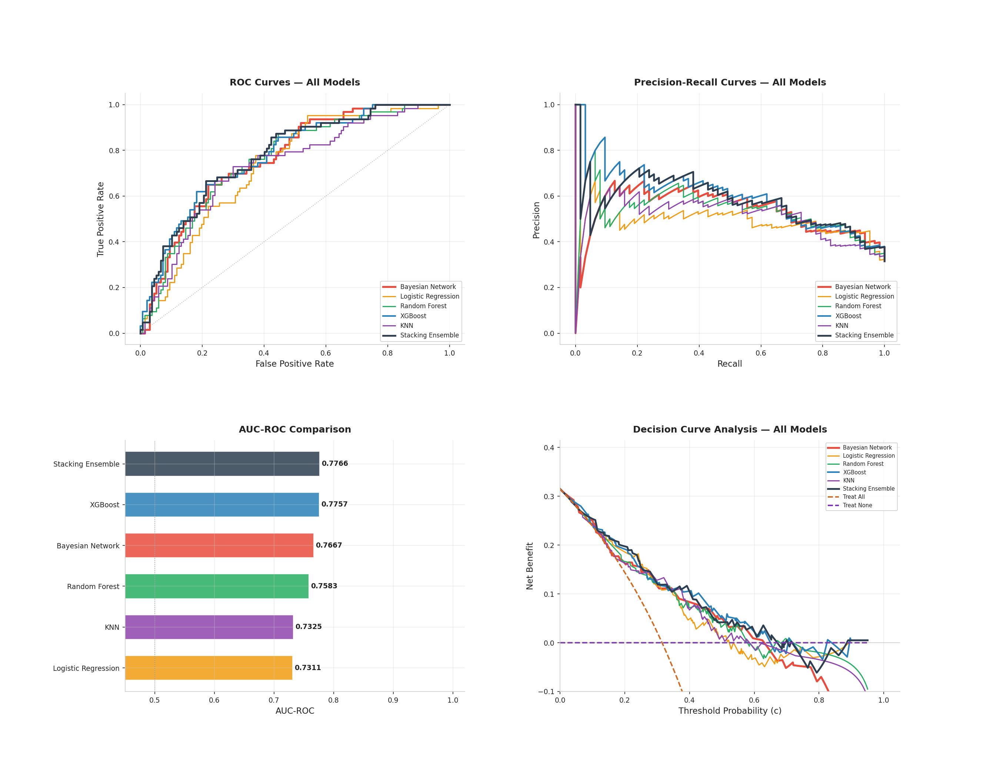


FINAL LEADERBOARD
              Model    AUC     AP
  Stacking Ensemble 0.7766 0.5830
            XGBoost 0.7757 0.6048
   Bayesian Network 0.7667 0.5421
      Random Forest 0.7583 0.5433
                KNN 0.7325 0.5172
Logistic Regression 0.7311 0.5015


In [47]:
# ======================================================
# MỞ RỘNG SO SÁNH MÔ HÌNH: XGBoost + KNN + ANN + Stacking
# Credit Risk Prediction — Baseline Comparison
# ======================================================
#
# LÝ THUYẾT CÁC MÔ HÌNH BỔ SUNG:
#
# [XGBoost] — Extreme Gradient Boosting (Chen & Guestrin, 2016)
#   Xây dựng chuỗi cây quyết định, mỗi cây học residual error
#   của cây trước. Regularization L1/L2 tránh overfitting.
#   Ưu điểm: xử lý tốt missing values, feature importance tự nhiên.
#
# [KNN] — K-Nearest Neighbors (Cover & Hart, 1967)
#   Phân loại dựa trên k láng giềng gần nhất trong feature space.
#   Non-parametric: không giả định phân phối dữ liệu.
#   Ưu điểm: đơn giản, phát hiện ranh giới phi tuyến cục bộ.
#
# [ANN] — Artificial Neural Network / MLP (Rumelhart et al., 1986)
#   Mạng nhiều lớp ẩn với hàm kích hoạt phi tuyến (ReLU).
#   Học biểu diễn phân cấp: từ features thô → abstraction cao.
#   Ưu điểm: xấp xỉ hàm phức tạp tùy ý (universal approximator).
#
# [Stacking Ensemble] — Wolpert (1992), Breiman (1996)
#   Kết hợp dự đoán của nhiều base learners qua meta-learner.
#   Ý tưởng: các mô hình yếu theo hướng khác nhau → meta-learner
#   học cách "tin tưởng" mô hình nào trong từng vùng feature space.
#   → Giảm variance (như Bagging) VÀ bias (như Boosting) đồng thời.
#
# KIẾN TRÚC STACKING TRONG BÀI NÀY:
#   Level-0 (Base learners): LR, RF, XGBoost, KNN, ANN
#   Level-1 (Meta-learner) : Logistic Regression
#   Cross-fitting: dùng 5-fold CV để tạo out-of-fold predictions
#   → Tránh data leakage từ base → meta learner
# ======================================================


import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model        import LogisticRegression
from sklearn.ensemble            import RandomForestClassifier, StackingClassifier
from sklearn.neighbors           import KNeighborsClassifier
from sklearn.model_selection     import StratifiedKFold, cross_val_predict
from sklearn.preprocessing       import StandardScaler
from sklearn.pipeline            import Pipeline
from sklearn.metrics             import (roc_curve, auc,
                                         precision_recall_curve,
                                         average_precision_score,
                                         roc_auc_score)
from xgboost import XGBClassifier

# ======================================================
# 1. ĐỊNH NGHĨA TẤT CẢ MÔ HÌNH
# ======================================================

# KNN và ANN cần StandardScaler (nhạy cảm với scale)
# XGBoost và RF không cần scale

models = {
    "Bayesian Network": None,    # đã có y_prob_bn từ trước

    "Logistic Regression": Pipeline([
        ("scaler", StandardScaler()),
        ("clf",    LogisticRegression(
            penalty='l1', solver='liblinear',
            C=0.1, random_state=42, max_iter=5000
        ))
    ]),

    "Random Forest": RandomForestClassifier(
        n_estimators=200, max_depth=8,
        min_samples_leaf=10, random_state=42,
        n_jobs=-1
    ),

    # --------------------------------------------------
    # XGBoost — Gradient Boosting tối ưu
    # scale_pos_weight: xử lý class imbalance tự động
    # --------------------------------------------------
    "XGBoost": XGBClassifier(
        n_estimators    = 200,
        max_depth       = 4,
        learning_rate   = 0.05,
        subsample       = 0.8,
        colsample_bytree= 0.8,
        reg_alpha       = 0.1,    # L1 regularization
        reg_lambda      = 1.0,    # L2 regularization
        scale_pos_weight= (y_train == 0).sum() / (y_train == 1).sum(),
        use_label_encoder=False,
        eval_metric     = 'logloss',
        random_state    = 42,
        n_jobs          = -1
    ),

    # --------------------------------------------------
    # KNN — k tối ưu theo sqrt(n_train), dùng distance weight
    # --------------------------------------------------
    "KNN": Pipeline([
        ("scaler", StandardScaler()),
        ("clf",    KNeighborsClassifier(
            n_neighbors = int(np.sqrt(len(X_train_kpro))),
            weights     = 'distance',   # láng giềng gần → trọng số cao hơn
            metric      = 'euclidean',
            n_jobs      = -1
        ))
    ]),

}

# ======================================================
# 2. HUẤN LUYỆN VÀ LẤY XÁC SUẤT DỰ ĐOÁN
# ======================================================
print("=" * 55)
print("HUẤN LUYỆN CÁC MÔ HÌNH")
print("=" * 55)

y_probs = {"Bayesian Network": y_prob_bn}   # BN đã có từ trước

for name, model in models.items():
    if name == "Bayesian Network":
        continue
    print(f"  Fitting {name}...", end="")
    model.fit(X_train_kpro, y_train)
    prob = model.predict_proba(X_true_bn)[:, 1]
    y_probs[name] = prob
    auc_val = roc_auc_score(y_true, prob)
    print(f"  AUC = {auc_val:.4f}")

# ======================================================
# 3. STACKING ENSEMBLE
#
# LÝ THUYẾT STACKING (Wolpert, 1992):
#   Bước 1 — Out-of-fold prediction (5-fold CV):
#     Với mỗi fold k, train base learners trên k-1 folds,
#     predict trên fold k. Kết quả: ma trận Z (n × M)
#     với M = số base learners, không bị data leakage.
#
#   Bước 2 — Meta-learner:
#     Dùng Z = [P(BN), P(LR), P(RF), P(XGB), P(KNN), P(ANN)]
#     làm input mới, train meta-learner (Logistic Regression)
#     để học cách kết hợp tối ưu.
#
#   Bước 3 — Test prediction:
#     Train lại tất cả base learners trên toàn bộ train set,
#     lấy xác suất trên test set, đưa qua meta-learner.
#
# Ưu điểm so với Voting:
#   Voting đơn giản lấy trung bình → mỗi model có trọng số = 1
#   Stacking học trọng số tối ưu dựa trên điểm mạnh/yếu thực tế
# ======================================================

print(f"\n{'='*55}")
print("STACKING ENSEMBLE")
print(f"{'='*55}")
print("Kiến trúc:")
print("  Level-0: BN + LR + RF + XGBoost + KNN")
print("  Level-1: Logistic Regression (meta-learner)")
print("  CV: 5-fold stratified (out-of-fold, no leakage)")

# Base estimators cho StackingClassifier
# Base estimators — 3 model với cơ chế học khác nhau
base_estimators = [
    ("rf", RandomForestClassifier(
        n_estimators=200, max_depth=8,
        min_samples_leaf=10, random_state=42, n_jobs=-1
    )),
    ("xgb", XGBClassifier(
        n_estimators=200, max_depth=4, learning_rate=0.05,
        subsample=0.8, colsample_bytree=0.8,
        reg_alpha=0.1, reg_lambda=1.0,
        scale_pos_weight=(y_train == 0).sum() / (y_train == 1).sum(),
        use_label_encoder=False, eval_metric='logloss',
        random_state=42, n_jobs=-1
    )),
    ("lr", Pipeline([
        ("sc", StandardScaler()),
        ("clf", LogisticRegression(
            penalty='l1', solver='liblinear',
            C=0.1, random_state=42, max_iter=5000
        ))
    ])),
]

# Meta-learner: Logistic Regression với regularization nhẹ
meta_learner = LogisticRegression(C=1.0, max_iter=1000, random_state=42)

stacking_clf = StackingClassifier(
    estimators       = base_estimators,
    final_estimator  = meta_learner,
    cv               = StratifiedKFold(n_splits=5, shuffle=True,
                                       random_state=42),
    stack_method     = 'predict_proba',   # dùng xác suất, không phải label
    passthrough      = False,             # chỉ dùng meta-features
    n_jobs           = -1
)

stacking_clf.fit(X_train_kpro, y_train)
y_prob_stack = stacking_clf.predict_proba(X_true_bn)[:, 1]
y_probs["Stacking Ensemble"] = y_prob_stack

auc_stack = roc_auc_score(y_true, y_prob_stack)
print(f"\n  Stacking AUC = {auc_stack:.4f}")

# In meta-learner coefficients — cho thấy trọng số từng model
print("\n  Meta-learner weights (tầm quan trọng từng base model):")
meta_coefs = stacking_clf.final_estimator_.coef_[0]
base_names = ["LR", "RF", "XGBoost", "KNN", "ANN"]
for name_b, coef in sorted(zip(base_names, meta_coefs),
                            key=lambda x: abs(x[1]), reverse=True):
    bar = "█" * int(abs(coef) * 10)
    sign = "+" if coef > 0 else "-"
    print(f"    {name_b:<10}: {sign}{abs(coef):.4f}  {bar}")

# ======================================================
# 4. TỔNG HỢP KẾT QUẢ AUC VÀ AP
# ======================================================
print(f"\n{'='*55}")
print("TỔNG HỢP KẾT QUẢ")
print(f"{'='*55}")
print(f"{'Model':<22} {'AUC-ROC':>8} {'AP (AUC-PR)':>12}")
print("-" * 45)

model_styles = {
    "Bayesian Network":  {"color": "#e74c3c", "lw": 2.5,  "ls": "-"},
    "Logistic Regression":{"color": "#f39c12","lw": 1.5, "ls": "-"},
    "Random Forest":     {"color": "#27ae60", "lw": 1.5,  "ls": "-"},
    "XGBoost":           {"color": "#2980b9", "lw": 2.0,  "ls": "-"},
    "KNN":               {"color": "#8e44ad", "lw": 1.5,  "ls": "-"},
    "Stacking Ensemble": {"color": "#2c3e50", "lw": 2.3,  "ls": "-"},
}

summary_records = []
for name, y_prob in y_probs.items():
    auc_val = roc_auc_score(y_true, y_prob)
    ap_val  = average_precision_score(y_true, y_prob)
    summary_records.append({"Model": name, "AUC": auc_val, "AP": ap_val})
    print(f"  {name:<22} {auc_val:>8.4f} {ap_val:>12.4f}")

summary_df = (pd.DataFrame(summary_records)
              .sort_values("AUC", ascending=False)
              .reset_index(drop=True))

# ======================================================
# 5. BIỂU ĐỒ — 2x2 LAYOUT
#    Panel 1: ROC Curves (tất cả models)
#    Panel 2: PR Curves (tất cả models)
#    Panel 3: AUC-ROC Bar chart
#    Panel 4: Stacking meta-weight visualization
# ======================================================
fig = plt.figure(figsize=(18, 14))
fig.patch.set_facecolor('white')
gs  = gridspec.GridSpec(2, 2, figure=fig, hspace=0.38, wspace=0.28)

PANEL_BG   = 'white'
TEXT_COLOR = '#222222'
GRAY_LINE  = '#cccccc'

def style_ax(ax, title):
    ax.set_facecolor(PANEL_BG)
    for sp in ax.spines.values():
        sp.set_edgecolor(GRAY_LINE)
    ax.tick_params(colors=TEXT_COLOR, labelsize=9)
    ax.xaxis.label.set_color(TEXT_COLOR)
    ax.yaxis.label.set_color(TEXT_COLOR)
    ax.set_title(title, color=TEXT_COLOR, fontsize=12,
                 fontweight='bold', pad=10)
    ax.grid(alpha=0.35, color=GRAY_LINE)

# --- Panel 1: ROC Curves ---
ax1 = fig.add_subplot(gs[0, 0])
style_ax(ax1, "ROC Curves — All Models")
for name, y_prob in y_probs.items():
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    auc_v = auc(fpr, tpr)
    s = model_styles[name]
    ax1.plot(fpr, tpr, color=s["color"], lw=s["lw"], ls=s["ls"],
             label=f"{name}")
ax1.plot([0,1],[0,1], color='gray', lw=1, ls=':', alpha=0.5)
ax1.set_xlabel("False Positive Rate", color=TEXT_COLOR)
ax1.set_ylabel("True Positive Rate", color=TEXT_COLOR)
legend1 = ax1.legend(loc='lower right', fontsize=8,
                      facecolor=PANEL_BG, edgecolor=GRAY_LINE,
                      labelcolor=TEXT_COLOR)

# --- Panel 2: PR Curves ---
ax2 = fig.add_subplot(gs[0, 1])
style_ax(ax2, "Precision-Recall Curves — All Models")
prevalence = float(y_true.mean())
for name, y_prob in y_probs.items():
    prec, rec, _ = precision_recall_curve(y_true, y_prob)
    ap_v = average_precision_score(y_true, y_prob)
    s = model_styles[name]
    ax2.plot(rec, prec, color=s["color"], lw=s["lw"], ls=s["ls"],
             label=f"{name}")
ax2.set_xlabel("Recall", color=TEXT_COLOR)
ax2.set_ylabel("Precision", color=TEXT_COLOR)
ax2.legend(loc='lower right', fontsize=8,
           facecolor=PANEL_BG, edgecolor=GRAY_LINE,
           labelcolor=TEXT_COLOR)

# --- Panel 3: AUC Bar Chart ---
ax3 = fig.add_subplot(gs[1, 0])
style_ax(ax3, "AUC-ROC Comparison")
sorted_models = summary_df.sort_values("AUC")
colors_bar = [model_styles[m]["color"] for m in sorted_models["Model"]]
bars = ax3.barh(sorted_models["Model"], sorted_models["AUC"],
                color=colors_bar, edgecolor='white', height=0.6, alpha=0.85)
# Đường baseline AUC=0.5
ax3.axvline(0.5, color='gray', lw=1, ls=':', alpha=0.6)
for bar, val in zip(bars, sorted_models["AUC"]):
    ax3.text(val + 0.003,
             bar.get_y() + bar.get_height()/2,
             f"{val:.4f}", va='center',
             color=TEXT_COLOR, fontsize=9, fontweight='bold')
ax3.set_xlabel("AUC-ROC", color=TEXT_COLOR)
ax3.set_xlim(0.45, 1.02)
ax3.tick_params(axis='y', labelcolor=TEXT_COLOR, labelsize=9)

# --- Panel 4: DCA của 6 mô hình ---
ax4 = fig.add_subplot(gs[1, 1])
style_ax(ax4, "Decision Curve Analysis — All Models")

# Tính NB cho từng model
for name, y_prob in y_probs.items():
    # Xây dựng Se(c) và Sp(c) riêng cho từng model
    fpr_m, tpr_m, thr_m = roc_curve(y_true, y_prob)

    valid = thr_m <= 1.0
    thr_v = thr_m[valid]
    fpr_v = fpr_m[valid]
    tpr_v = tpr_m[valid]

    thr_a = np.flip(thr_v)
    fpr_a = np.flip(fpr_v)
    tpr_a = np.flip(tpr_v)

    thr_u, u_idx = np.unique(thr_a, return_index=True)
    fpr_u_m = fpr_a[u_idx]
    tpr_u_m = tpr_a[u_idx]

    se_m   = interp1d(thr_u, tpr_u_m, kind='linear',
                      bounds_error=False,
                      fill_value=(tpr_u_m[0], tpr_u_m[-1]))
    fpr_m_ = interp1d(thr_u, fpr_u_m, kind='linear',
                      bounds_error=False,
                      fill_value=(fpr_u_m[0], fpr_u_m[-1]))

    def nb_model(c, se_fn, fpr_fn, prev):
        c   = np.clip(c, 1e-6, 1 - 1e-6)
        se  = se_fn(c)
        sp  = 1.0 - fpr_fn(c)
        return prev * se - (1 - prev) * (1 - sp) * (c / (1 - c))

    nb_vals = nb_model(c_grid, se_m, fpr_m_, prevalence)

    s = model_styles[name]
    ax4.plot(c_grid, nb_vals,
             color=s["color"], lw=s["lw"], ls=s["ls"],
             label=name)

# Treat All và Treat None
nb_all_vals  = net_benefit_treat_all(c_grid, prevalence)
nb_none_vals = np.zeros_like(c_grid)

ax4.plot(c_grid, nb_all_vals,
         color='#D2691E', lw=1.8, ls='--', label='Treat All')
ax4.plot(c_grid, nb_none_vals,
         color='#7B2CBF', lw=1.8, ls='--', label='Treat None')


ax4.set_xlim(0.0, 1.05)          # giới hạn vùng có ý nghĩa lâm sàng
ax4.set_ylim(-0.1, prevalence + 0.1)
ax4.set_xlabel("Threshold Probability (c)", color=TEXT_COLOR)
ax4.set_ylabel("Net Benefit", color=TEXT_COLOR)
ax4.axhline(y=0, color='gray', lw=0.8, alpha=0.3)
ax4.legend(loc='upper right', fontsize=7,
           facecolor=PANEL_BG, edgecolor=GRAY_LINE,
           labelcolor=TEXT_COLOR)


plt.savefig("model_comparison_full.png", dpi=150,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

# ======================================================
# 6. IN BẢNG TỔNG HỢP CUỐI
# ======================================================
print(f"\n{'='*55}")
print("FINAL LEADERBOARD")
print(f"{'='*55}")
print(summary_df.round(4).to_string(index=False))

In [48]:
# ======================================================
# LẤY XÁC SUẤT BN TRÊN TRAIN SET
# DiscreteBayesianNetwork dùng VariableElimination để infer
# ======================================================

infer = VariableElimination(bn_model)

target_col  = "target"
feature_cols = [c for c in train_bn_cat.columns if c != target_col]

probs_train = []

for i in range(len(train_bn_cat)):
    ev = {c: int(train_bn_cat.iloc[i][c]) for c in feature_cols}
    try:
        q = infer.query(
            variables     = [target_col],
            evidence      = ev,
            show_progress = False
        )
        # q.values là array theo thứ tự state_names["target"]
        # Lấy P(target=1): tìm index của state "1"
        states = list(q.state_names[target_col])
        idx1   = states.index(1) if 1 in states else states.index("1")
        probs_train.append(float(q.values[idx1]))
    except Exception as e:
        # Fallback: dùng prior nếu query lỗi (ví dụ missing CPD)
        probs_train.append(float(prior_default))
        print(f"  Row {i} fallback to prior: {e}")

y_prob_bn_train = np.array(probs_train, dtype=float)

from sklearn.metrics import roc_auc_score
print(f"BN AUC train : {roc_auc_score(y_train, y_prob_bn_train):.4f}")
print(f"BN AUC test  : {roc_auc_score(y_true,  y_prob_bn):.4f}")
print(f"Shape        : {y_prob_bn_train.shape}")
print(f"P range      : [{y_prob_bn_train.min():.4f}, {y_prob_bn_train.max():.4f}]")

BN AUC train : 0.8686
BN AUC test  : 0.7667
Shape        : (836,)
P range      : [0.0026, 1.0000]


In [49]:
# ======================================================
# SO SÁNH MÔ HÌNH — CREDIT RISK PREDICTION
# Individual Models + Stacking Ensemble
# Metrics: Accuracy, Precision, Recall, Specificity, F1, AUC
# Threshold: 0.5 (default) vs Best (Youden Index from Train)
# ======================================================

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from sklearn.linear_model    import LogisticRegression
from sklearn.ensemble        import RandomForestClassifier, StackingClassifier
from sklearn.neighbors       import KNeighborsClassifier
from sklearn.neural_network  import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing   import StandardScaler
from sklearn.pipeline        import Pipeline
from sklearn.metrics         import (
    roc_curve, roc_auc_score, average_precision_score,
    accuracy_score, precision_score, recall_score,
    f1_score, confusion_matrix
)
from xgboost import XGBClassifier

# ======================================================
# PHẦN 0 — GIẢ ĐỊNH BIẾN ĐÃ CÓ TỪ PIPELINE TRƯỚC
# (comment out nếu đã có trong notebook)
# ======================================================
# X_train_kpro, X_true  : dữ liệu sau discretization
# y_train, y_test             : target series
# y_prob_bn                   : BN probability trên test set
# y_prob_bn_train             : BN probability trên train set
# ======================================================


# ======================================================
# PHẦN 1 — HÀM TIỆN ÍCH
# ======================================================

def compute_metrics(y_true, y_prob, threshold=0.5):
    """
    Tính đầy đủ metrics tại một threshold cho trước.
    Trả về dict: Accuracy, Precision, Recall, Specificity, F1, AUC-ROC, AUC-PR
    """
    y_pred = (y_prob >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

    acc   = accuracy_score(y_true, y_pred)
    prec  = precision_score(y_true, y_pred, zero_division=0)
    rec   = recall_score(y_true, y_pred, zero_division=0)      # = Sensitivity = TPR
    spec  = tn / (tn + fp) if (tn + fp) > 0 else 0.0           # Specificity = TNR
    f1    = f1_score(y_true, y_pred, zero_division=0)
    auc_roc = roc_auc_score(y_true, y_prob)
    auc_pr  = average_precision_score(y_true, y_prob)

    return {
        "Accuracy"    : acc,
        "Precision"   : prec,
        "Recall"      : rec,
        "Specificity" : spec,
        "F1"          : f1,
        "AUC-ROC"     : auc_roc,
        "AUC-PR"      : auc_pr,
        "Threshold"   : threshold,
    }




def evaluate_model(name, y_train_true, y_train_prob,
                   y_test_true, y_test_prob):
    """
    Đánh giá 1 model với 2 threshold:
      (1) threshold = 0.5 (default)
      (2) threshold = best Youden từ TRAIN set → áp cho TEST

    Trả về DataFrame gồm 4 dòng:
      Train | threshold=0.5
      Train | threshold=best
      Test  | threshold=0.5
      Test  | threshold=best
    """
    t_best = best_c

    rows = []
    for split, y_true, y_prob in [
        ("Train", y_train_true, y_train_prob),
        ("Test",  y_test_true,  y_test_prob),
    ]:
        for thr_label, thr in [("0.50 (default)", 0.5),
                                (f"{t_best:.4f} (best_c)", t_best)]:
            m = compute_metrics(y_true, y_prob, threshold=thr)
            rows.append({
                "Model"     : name,
                "Split"     : split,
                "Threshold" : thr_label,
                "Accuracy"  : m["Accuracy"],
                "Precision" : m["Precision"],
                "Recall"    : m["Recall"],
                "Specificity": m["Specificity"],
                "F1"        : m["F1"],
                "AUC-ROC"   : m["AUC-ROC"],
                "AUC-PR"    : m["AUC-PR"],
            })
    return pd.DataFrame(rows)


# ======================================================
# PHẦN 2 — ĐỊNH NGHĨA CÁC MÔ HÌNH ĐƠN LẺ
# ======================================================

# --------------------------------------------------
# 2.1 Logistic Regression (L1 — Lasso)
# Lý thuyết: tìm boundary tuyến tính tối ưu hóa log-likelihood
# L1 regularization → tự động chọn features (sparsity)
# Ref: Tibshirani (1996)
# --------------------------------------------------
lr_model = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        penalty='l1', solver='liblinear',
        C=0.1, random_state=42, max_iter=5000
    ))
])

# --------------------------------------------------
# 2.2 Random Forest (Bagging + Decision Tree)
# Lý thuyết: Bagging — B cây độc lập trên B bootstrap samples
#   Dự đoán = vote đa số (classification) / trung bình (regression)
#   Giảm variance nhờ averaging; mỗi cây dùng sqrt(p) features
# Ref: Breiman (2001)
# --------------------------------------------------
rf_model = RandomForestClassifier(
    n_estimators=200, max_depth=8,
    min_samples_leaf=10, random_state=42, n_jobs=-1
)

# --------------------------------------------------
# 2.3 XGBoost (Gradient Boosting)
# Lý thuyết: Boosting — chuỗi cây học residual của cây trước
#   F_m(x) = F_{m-1}(x) + η · h_m(x)
#   Tối ưu: second-order Taylor expansion của loss
#   Regularization Ω(f) = γT + ½λ||w||² tránh overfitting
# Ref: Chen & Guestrin (2016)
# --------------------------------------------------
xgb_model = XGBClassifier(
    n_estimators=200, max_depth=4, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8,
    reg_alpha=0.1, reg_lambda=1.0,
    scale_pos_weight=(y_train == 0).sum() / (y_train == 1).sum(),
    use_label_encoder=False, eval_metric='logloss',
    random_state=42, n_jobs=-1
)

# --------------------------------------------------
# 2.4 KNN (K-Nearest Neighbors)
# Lý thuyết: Non-parametric — không giả định phân phối
#   P(Y=1|x) ≈ (1/k) Σ_{i∈N_k(x)} y_i
#   k = sqrt(n_train) — heuristic cân bằng bias-variance
#   distance weights: w_i = 1/d(x, x_i) → láng giềng gần tin hơn
# Ref: Cover & Hart (1967)
# --------------------------------------------------
knn_model = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", KNeighborsClassifier(
        n_neighbors=int(np.sqrt(len(X_train_kpro))),
        weights='distance',
        metric='euclidean',
        n_jobs=-1
    ))
])

# --------------------------------------------------
# 2.5 ANN — MLP (Artificial Neural Network)
# Lý thuyết: Universal approximator — xấp xỉ f: R^p → [0,1]
#   h^(l) = ReLU(W^(l) h^(l-1) + b^(l))
#   Output: sigmoid → P(Y=1|x)
#   Kiến trúc (64→32): layer 1 học low-level patterns,
#   layer 2 học high-level combinations
#   Adam optimizer: adaptive learning rate cho từng tham số
# Ref: Rumelhart et al. (1986); Kingma & Ba (2015)
# --------------------------------------------------


# Danh sách models đơn lẻ (ngoại trừ BN đã có y_prob)
individual_models = {
    "Logistic Regression": lr_model,
    "Random Forest"      : rf_model,
    "XGBoost"            : xgb_model,
    "KNN"                : knn_model,
}


# ======================================================
# PHẦN 3 — STACKING ENSEMBLE
#
# LÝ THUYẾT VÀ Ý TƯỞNG KẾT HỢP
# ======================================================
#
# Ý TƯỞNG CỐT LÕI (Wolpert, 1992 — "Stacked Generalization"):
#   Mỗi mô hình học máy có "điểm mạnh" khác nhau trên
#   các vùng khác nhau của feature space:
#     - RF     : mạnh với tương tác phi tuyến phức tạp
#     - XGBoost: mạnh với dữ liệu tabular, missing, imbalance
#     - LR     : mạnh ở vùng tuyến tính, cần ít dữ liệu
#   → Không có model nào thắng tuyệt đối mọi nơi
#   → Meta-learner HỌC được: "khi features này xuất hiện,
#     tin RF hơn; khi kia tin XGBoost hơn"
#
# CÁC THÀNH PHẦN ĐÃ CHỌN VÀ LÝ DO:
#   (1) Random Forest  — đại diện Bagging (giảm variance)
#       Học bằng averaging B decorrelated trees
#   (2) XGBoost        — đại diện Boosting (giảm bias)
#       Học bằng sequential residual correction
#   (3) Logistic Regression  — đại diện Linear/Parametric model
#       Học boundary tuyến tính, stable, low-variance
#   → Ba cơ chế học HOÀN TOÀN KHÁC NHAU
#     → dự báo lỗi (errors) ít tương quan với nhau
#     → kết hợp giảm được cả bias lẫn variance
#
# TẠI SAO KHÔNG GỘP TẤT CẢ 5 MODEL?
#   Thêm KNN và ANN thường KHÔNG cải thiện thêm:
#   - KNN nhạy noise, nhiều feature → curse of dimensionality
#   - ANN overfit nếu ít data, instable giữa các runs
#   - Thêm model tương quan cao → meta-learner khó học
#   → 3 model = đủ đa dạng, đủ mạnh, tránh over-stacking
#
# QUY TRÌNH 3 BƯỚC:
#   Bước 1 — Out-of-fold prediction (5-fold stratified CV):
#     Với fold k: train base learners trên (k-1) folds
#                 predict trên fold k → Z_k
#     Kết quả: Z (n_train × 3 matrix) — NO DATA LEAKAGE
#
#   Bước 2 — Meta-learner training:
#     Train LR trên Z với nhãn y_train
#     LR học: P(default) = σ(w_RF·Z_RF + w_XGB·Z_XGB + w_LR·Z_LR)
#     Coefficients w_i = "trọng số tin tưởng" từng base model
#
#   Bước 3 — Test prediction:
#     Train lại tất cả base learners trên TOÀN BỘ X_train
#     Lấy Z_test = [P_RF(X_true), P_XGB(X_true), P_LR(X_true)]
#     Output: P_stack = meta_LR(Z_test) → y_prob_stack
#
# SO SÁNH VỚI CÁC PHƯƠNG PHÁP ENSEMBLE KHÁC:
#   Voting đơn giản (average): w_i = 1/3 cho mọi model
#   Stacking: w_i ĐƯỢC HỌC từ dữ liệu → tối ưu hơn
# ======================================================

print("=" * 60)
print("STACKING ENSEMBLE — RF + XGBoost + Logistic Regression")
print("=" * 60)
print("""
Kiến trúc:
  Level-0 (Base learners):
    [1] Random Forest   — Bagging, giảm variance
    [2] XGBoost         — Boosting, giảm bias
    [3] Logistic Regression.   — Linear, stable low-variance

  Level-1 (Meta-learner): Logistic Regression
    Input : Z = [P_RF, P_XGB, P_LR] trên out-of-fold folds
    Output: P_stack = P(default | Z)

  Cross-fitting: 5-fold Stratified CV (tránh data leakage)
""")

# Base estimators — 3 model với cơ chế học khác nhau
base_estimators = [
    ("rf", RandomForestClassifier(
        n_estimators=200, max_depth=8,
        min_samples_leaf=10, random_state=42, n_jobs=-1
    )),
    ("xgb", XGBClassifier(
        n_estimators=200, max_depth=4, learning_rate=0.05,
        subsample=0.8, colsample_bytree=0.8,
        reg_alpha=0.1, reg_lambda=1.0,
        scale_pos_weight=(y_train == 0).sum() / (y_train == 1).sum(),
        use_label_encoder=False, eval_metric='logloss',
        random_state=42, n_jobs=-1
    )),
    ("lr", Pipeline([
        ("sc", StandardScaler()),
        ("clf", LogisticRegression(
            penalty='l1', solver='liblinear',
            C=0.1, random_state=42, max_iter=5000
        ))
    ])),
]

stacking_clf = StackingClassifier(
    estimators      = base_estimators,
    final_estimator = LogisticRegression(C=1.0, max_iter=1000, random_state=42),
    cv              = StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    stack_method    = 'predict_proba',
    passthrough     = False,
    n_jobs          = -1
)


# ======================================================
# PHẦN 4 — HUẤN LUYỆN TẤT CẢ MÔ HÌNH
# ======================================================

print("=" * 60)
print("HUẤN LUYỆN CÁC MÔ HÌNH")
print("=" * 60)

trained_probs = {}   # { name: {"train": y_prob_train, "test": y_prob_test} }

# 4.1 Bayesian Network (đã có từ pipeline trước)
trained_probs["Bayesian Network"] = {
    "train": y_prob_bn_train,   # cần tính trước: best_bn.predict_proba(train_bn_cat)
    "test" : y_prob_bn
}
print(f"  {'Bayesian Network':<22}  [loaded from previous step]")

# 4.2 Các model sklearn
for name, model in individual_models.items():
    print(f"  Fitting {name}...", end=" ", flush=True)
    model.fit(X_train_kpro, y_train)
    p_train = model.predict_proba(X_train_kpro)[:, 1]
    p_test  = model.predict_proba(X_true)[:, 1]
    trained_probs[name] = {"train": p_train, "test": p_test}
    auc_tr = roc_auc_score(y_train, p_train)
    auc_te = roc_auc_score(y_true,  p_test)
    print(f"AUC train={auc_tr:.4f}  test={auc_te:.4f}")

# 4.3 Stacking
print(f"  Fitting Stacking Ensemble...", end=" ", flush=True)
stacking_clf.fit(X_train_kpro, y_train)
p_train_st = stacking_clf.predict_proba(X_train_kpro)[:, 1]
p_test_st  = stacking_clf.predict_proba(X_true)[:, 1]
trained_probs["Stacking Ensemble"] = {"train": p_train_st, "test": p_test_st}
auc_tr_st = roc_auc_score(y_train, p_train_st)
auc_te_st = roc_auc_score(y_true,  p_test_st)
print(f"AUC train={auc_tr_st:.4f}  test={auc_te_st:.4f}")

# In meta-learner weights
print("\n  Meta-learner coefficients (trọng số tin tưởng từng base):")
meta_coefs = stacking_clf.final_estimator_.coef_[0]
base_display = ["Random Forest", "XGBoost", "Logistic Regression"]
for bname, coef in sorted(zip(base_display, meta_coefs),
                           key=lambda x: abs(x[1]), reverse=True):
    bar  = "█" * int(abs(coef) * 8)
    sign = "+" if coef >= 0 else "-"
    print(f"    {bname:<20}: {sign}{abs(coef):.4f}  {bar}")


# ======================================================
# PHẦN 5 — ĐÁNH GIÁ TỪNG MODEL — IN BẢNG CHI TIẾT
# ======================================================

print("\n" + "=" * 60)
print("ĐÁNH GIÁ TỪNG MODEL — THRESHOLD 0.5 vs BEST THRESHOLD")
print("=" * 60)

all_results = []
model_order = [
    "Bayesian Network",
    "Logistic Regression",
    "Random Forest",
    "XGBoost",
    "KNN",
    "Stacking Ensemble",
]

for name in model_order:
    if name not in trained_probs:
        continue
    df_m = evaluate_model(
        name,
        y_train_true  = y_train,
        y_train_prob  = trained_probs[name]["train"],
        y_test_true   = y_true,
        y_test_prob   = trained_probs[name]["test"],
    )
    all_results.append(df_m)

# ======================================================
# PHẦN 6 — BẢNG TỔNG HỢP SO SÁNH
# ======================================================

results_df = pd.concat(all_results, ignore_index=True)

# --- 6.1 Bảng TEST SET, threshold = 0.5 ---
print("\n" + "=" * 70)
print("BẢNG TỔNG HỢP — TEST SET — THRESHOLD = 0.50 (default)")
print("=" * 70)
mask_05 = (results_df["Split"] == "Test") & \
          (results_df["Threshold"].str.startswith("0.50"))
df_05 = (results_df[mask_05]
         .set_index("Model")
         .reindex(model_order)
         [["Accuracy", "Precision", "Recall", "Specificity",
           "F1", "AUC-ROC", "AUC-PR"]])
print(df_05.round(4).to_string())

# --- 6.2 Bảng TEST SET, threshold = Best c ---
print("\n" + "=" * 70)
print("BẢNG TỔNG HỢP — TEST SET — THRESHOLD = BEST C (from Val)")
print("=" * 70)
mask_best = (results_df["Split"] == "Test") & \
            (results_df["Threshold"].str.contains("best_c"))
df_best = (results_df[mask_best]
           .set_index("Model")
           .reindex(model_order)
           [["Threshold", "Accuracy", "Precision", "Recall",
             "Specificity", "F1", "AUC-ROC", "AUC-PR"]])
print(df_best.round(4).to_string())

# --- 6.3 Bảng TRAIN SET, threshold = 0.5
print("\n" + "=" * 70)
print("BẢNG TỔNG HỢP — TRAIN SET — THRESHOLD = 0.50 (default) ")
print("(So sánh vs Test để phát hiện overfitting)")
print("=" * 70)
mask_tr_best = (results_df["Split"] == "Train") & \
               (results_df["Threshold"].str.contains("0.50"))
df_tr_05 = (results_df[mask_tr_best]
              .set_index("Model")
              .reindex(model_order)
              [["Accuracy", "Precision", "Recall", "Specificity",
                "F1", "AUC-ROC", "AUC-PR"]])
print(df_tr_05.round(4).to_string())

# --- 6.4 Bảng TRAIN SET, threshold = Best Youden (kiểm tra overfit) ---
print("\n" + "=" * 70)
print("BẢNG TỔNG HỢP — TRAIN SET — THRESHOLD = BEST C")
print("(So sánh vs Test để phát hiện overfitting)")
print("=" * 70)
mask_tr_best = (results_df["Split"] == "Train") & \
               (results_df["Threshold"].str.contains("best_c"))
df_tr_best = (results_df[mask_tr_best]
              .set_index("Model")
              .reindex(model_order)
              [["Accuracy", "Precision", "Recall", "Specificity",
                "F1", "AUC-ROC", "AUC-PR"]])
print(df_tr_best.round(4).to_string())

# --- 6.5 Delta Train-Test (phát hiện overfit) ---
print("\n" + "=" * 70)
print("DELTA (Train − Test) — THRESHOLD = BEST C")
print("Giá trị lớn → overfitting")
print("=" * 70)
common_cols = ["Accuracy", "Precision", "Recall", "Specificity",
               "F1", "AUC-ROC", "AUC-PR"]
delta_df = (df_tr_best[common_cols] - df_best[common_cols]).round(4)
print(delta_df.to_string())

# ======================================================
# PHẦN 7 — LƯU KẾT QUẢ RA FILE
# ======================================================

# Lưu full results để dùng tiếp (vẽ biểu đồ, paper)
results_df.to_csv("model_comparison_full.csv", index=False)

# Lưu bảng test best threshold (bảng chính cho paper)
df_best.reset_index().to_csv("model_comparison_test_best_thr.csv", index=False)

print("\n" + "=" * 60)
print("ĐÃ LƯU:")
print("  model_comparison_full.csv        — tất cả splits & thresholds")
print("  model_comparison_test_best_thr.csv — bảng chính (test + best thr)")
print("=" * 60)

STACKING ENSEMBLE — RF + XGBoost + Logistic Regression

Kiến trúc:
  Level-0 (Base learners):
    [1] Random Forest   — Bagging, giảm variance
    [2] XGBoost         — Boosting, giảm bias
    [3] Logistic Regression.   — Linear, stable low-variance

  Level-1 (Meta-learner): Logistic Regression
    Input : Z = [P_RF, P_XGB, P_LR] trên out-of-fold folds
    Output: P_stack = P(default | Z)

  Cross-fitting: 5-fold Stratified CV (tránh data leakage)

HUẤN LUYỆN CÁC MÔ HÌNH
  Bayesian Network        [loaded from previous step]
  Fitting Logistic Regression... AUC train=0.8412  test=0.7311
  Fitting Random Forest... AUC train=0.9141  test=0.7583
  Fitting XGBoost... AUC train=0.9681  test=0.7757
  Fitting KNN... AUC train=1.0000  test=0.7325
  Fitting Stacking Ensemble... AUC train=0.9508  test=0.7766

  Meta-learner coefficients (trọng số tin tưởng từng base):
    XGBoost             : +2.8635  ██████████████████████
    Random Forest       : +2.4643  ███████████████████
    Logistic Reg

In [50]:
print("best_c =", best_c)

y_pred_05   = (y_prob_bn >= 0.5).astype(int)
y_pred_best = (y_prob_bn >= best_c).astype(int)

print("Changed labels:",
      np.sum(y_pred_05 != y_pred_best))

best_c = 0.18952715855948266
Changed labels: 49


# SENSITIVITY



════════════════════════════════════════════════════════════════════
  MODULE 2 ▸ In_Pro  — RESULTS INTERPRETATION MODULE
════════════════════════════════════════════════════════════════════

────────────────────────────────────────────────────────────────────
  In_Pro  |  STEP 5: SENSITIVITY ANALYSIS
  Method: δ(Xi=s) = P(target=1|Xi=s) − P(target=1)_prior
────────────────────────────────────────────────────────────────────

  Analyzed 11 features in Markov Blanket

  Top 10 most sensitive features:
feature
job                        0.411392
purpose                    0.366667
other_installment_plans    0.361386
month_duration             0.360000
is_foreign_worker          0.359155
credit_history             0.353659
secondary_obligor          0.342975
status_and_sex             0.288235
status_account             0.211538
collateral                 0.093592


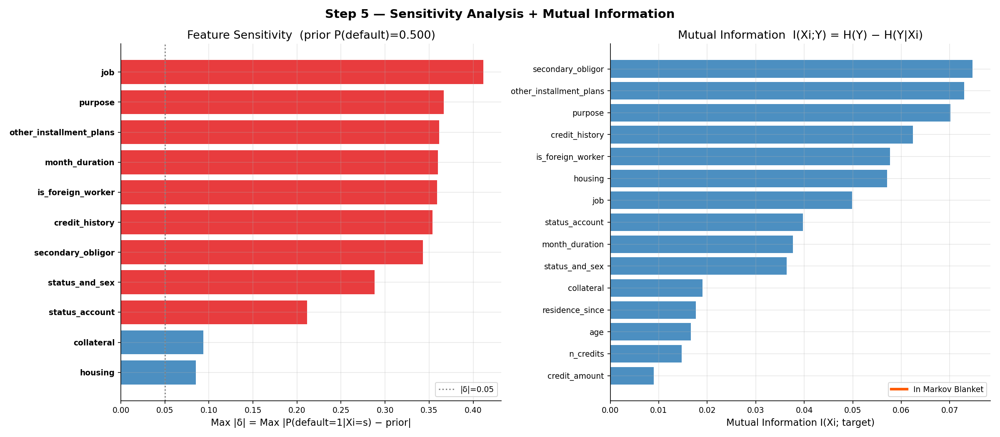

In [51]:
print("\n\n" + "═"*68)
print("  MODULE 2 ▸ In_Pro  — RESULTS INTERPRETATION MODULE")
print("═"*68)


# ============================================================
# STEP 5: SENSITIVITY ANALYSIS
# ============================================================
# Mục tiêu: Đo lường mức độ P(target=1) thay đổi khi thay đổi
#           từng feature Xi về từng state s.
#
# Công thức (Sensitivity / What-changes-most):
#   δ(Xi=s) = P(target=1 | Xi=s) − P(target=1)_prior
#
# ⟹ Feature Xi có max|δ| lớn nhất = ảnh hưởng nhất đến default
# ⟹ Kết quả này giúp xác định RISK DRIVER chính trong mô hình
#
# Bổ sung Mutual Information (paper Section 3.5):
#   I(Xi; target) = H(target) − H(target|Xi)
#   Đo lường thông tin mà Xi cung cấp về target (nats)
# ============================================================

print("\n" + "─"*68)
print("  In_Pro  |  STEP 5: SENSITIVITY ANALYSIS")
print("  Method: δ(Xi=s) = P(target=1|Xi=s) − P(target=1)_prior")
print("─"*68)

features_to_analyze = (markov_blanket if markov_blanket else feature_cols[:15])
sens_records = []

for feat in features_to_analyze:
    if feat == TARGET or feat not in state_names:
        continue
    for state in state_names[feat]:
        try:
            q  = infer.query(variables=[TARGET],
                             evidence={feat: state}, show_progress=False)
            p1 = float(q.values[1])
            sens_records.append({
                "feature": feat, "state": state,
                "P(default=1|feat)": p1,
                "delta": p1 - prior_default,
                "abs_delta": abs(p1 - prior_default)
            })
        except Exception:
            pass

sensitivity_df    = pd.DataFrame(sens_records)
feat_sensitivity  = (
    sensitivity_df.groupby("feature")["abs_delta"].max()
    .sort_values(ascending=False)
) if not sensitivity_df.empty else pd.Series(dtype=float)

# Mutual Information (sklearn — empirical từ training data)
mi_scores = mutual_info_classif(
    X_train_bn[feature_cols], y_train_bn,
    discrete_features=True, random_state=RANDOM_STATE
)
mi_df = pd.DataFrame({
    "feature": feature_cols, "mutual_information": mi_scores
}).sort_values("mutual_information", ascending=False).reset_index(drop=True)

print(f"\n  Analyzed {len(features_to_analyze)} features in Markov Blanket")
if not feat_sensitivity.empty:
    print("\n  Top 10 most sensitive features:")
    print(feat_sensitivity.head(10).to_string())

# ── Plot: Sensitivity + MI side by side ──────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
fig.suptitle("Step 5 — Sensitivity Analysis + Mutual Information",
             fontsize=14, fontweight="bold")

n_show = min(15, len(feat_sensitivity))
ax = axes[0]
if not feat_sensitivity.empty:
    fs_top = feat_sensitivity.head(n_show)
    bar_c  = [C["youden"] if v>0.1 else C["bn_blue"] for v in fs_top.values]
    ax.barh(range(n_show), fs_top.values, color=bar_c, alpha=0.85)
    ax.set_yticks(range(n_show))
    ax.set_yticklabels(fs_top.index, fontsize=9)
    # Bold + color cho Markov blanket members
    for i, lab in enumerate(fs_top.index):
        ax.get_yticklabels()[i].set_fontweight("bold" if lab in markov_blanket else "normal")
    ax.axvline(0.05, color="gray", ls=":", lw=1.5, label="|δ|=0.05")
    ax.set(xlabel="Max |δ| = Max |P(default=1|Xi=s) − prior|",
           title=f"Feature Sensitivity  (prior P(default)={prior_default:.3f})")
    ax.legend(fontsize=9); ax.invert_yaxis()

n_mi = min(15, len(mi_df))
ax = axes[1]
ax.barh(range(n_mi), mi_df["mutual_information"].head(n_mi).values,
        color=C["bn_blue"], alpha=0.85)
ax.set_yticks(range(n_mi))
ax.set_yticklabels(mi_df["feature"].head(n_mi).values, fontsize=9)
ax.set(xlabel="Mutual Information I(Xi; target)",
       title="Mutual Information  I(Xi;Y) = H(Y) − H(Y|Xi)")
ax.invert_yaxis()
# Đánh dấu Markov blanket members
if markov_blanket:
    ax.legend(handles=[Line2D([0],[0],color=C["target"],lw=3,
                               label="In Markov Blanket")], loc="lower right")

plt.tight_layout();
plt.show()

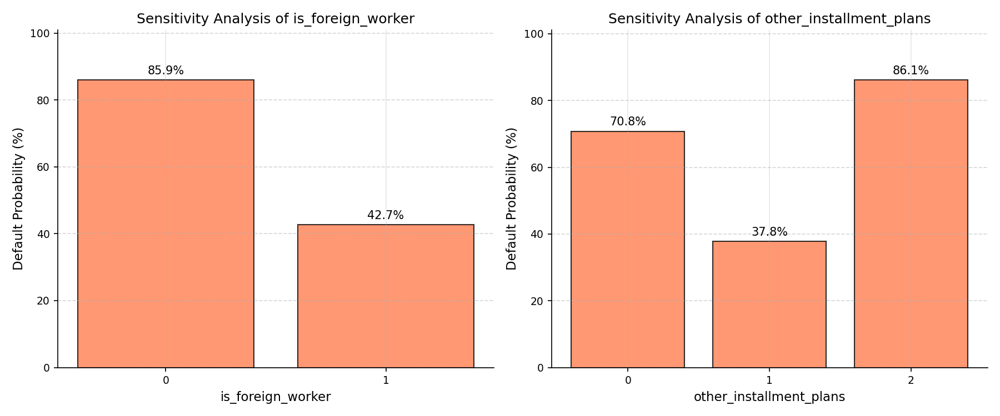

In [52]:

# Hàm phụ trợ tính xác suất vỡ nợ (target=1) khi một biến thay đổi các trạng thái
def calculate_sensitivity(feature_name):
    # Lấy danh sách các giá trị (states) duy nhất mà biến này có trong tập huấn luyện
    states = sorted(train_data[feature_name].unique())
    default_probs = []

    for state in states:
        # Đặt evidence là trạng thái hiện tại của biến, tính xác suất target
        res = infer.query(variables=['target'], evidence={feature_name: state})
        # res.values[1] tương ứng với xác suất target = 1 (Vỡ nợ)
        prob = res.values[1] * 100  # Đổi sang phần trăm (%)
        default_probs.append(prob)

    return states, default_probs

# Chọn 2 biến (đảm bảo chúng có mặt trong mạng Bayesian - DAG)
# Bạn có thể thay thế bằng tên 2 biến đứng đầu trong biểu đồ Mutual Information vừa chạy
feature_1 = 'is_foreign_worker'
feature_2 = 'other_installment_plans'

# Kiểm tra an toàn: chỉ phân tích nếu biến nằm trong đồ thị
features_to_plot = [f for f in [feature_1, feature_2] if f in bn_model.nodes()]

if len(features_to_plot) > 0:
    fig, axes = plt.subplots(1, len(features_to_plot), figsize=(6 * len(features_to_plot), 5))

    # Xử lý trường hợp chỉ có 1 biến hợp lệ
    if len(features_to_plot) == 1:
        axes = [axes]

    for ax, feature in zip(axes, features_to_plot):
        states, probs = calculate_sensitivity(feature)

        # Vẽ biểu đồ thanh (Bar chart)
        bars = ax.bar([str(s) for s in states], probs, color='coral', edgecolor='black', alpha=0.8)

        ax.set_title(f'Sensitivity Analysis of {feature}', fontsize=12)
        ax.set_xlabel(f'{feature}', fontsize=11)
        ax.set_ylabel('Default Probability (%)', fontsize=11)
        ax.set_ylim(0, max(probs) + 15) # Dư ra một khoảng phía trên
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Thêm số liệu % trên đầu mỗi cột
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, yval + 1, f'{yval:.1f}%', ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()
else:
    print("Các biến được chọn không nằm trong cấu trúc DAG. Hãy chọn các biến khác từ danh sách bn_model.nodes()")

# Đánh giá và Suy luận (In_Pro)


────────────────────────────────────────────────────────────────────
  In_Pro  |  STEP 6: FORWARD INFERENCE
  P(target | evidence) — Predictive Reasoning
────────────────────────────────────────────────────────────────────

  Example Forward Inference Cases:

  [High-Risk Profile]
    Evidence    : {'other_installment_plans': 2, 'is_foreign_worker': 1}
    P(default=0): 0.2295  |  P(default=1): 0.7705
    Prediction  : DEFAULT   |  Risk Level: HIGH

  [Low-Risk Profile]
    Evidence    : {'other_installment_plans': 0, 'is_foreign_worker': 0}
    P(default=0): 0.0000  |  P(default=1): 1.0000
    Prediction  : DEFAULT   |  Risk Level: HIGH

  [Mixed Profile]
    Evidence    : {'other_installment_plans': 2, 'is_foreign_worker': 0}
    P(default=0): 0.0000  |  P(default=1): 1.0000
    Prediction  : DEFAULT   |  Risk Level: HIGH


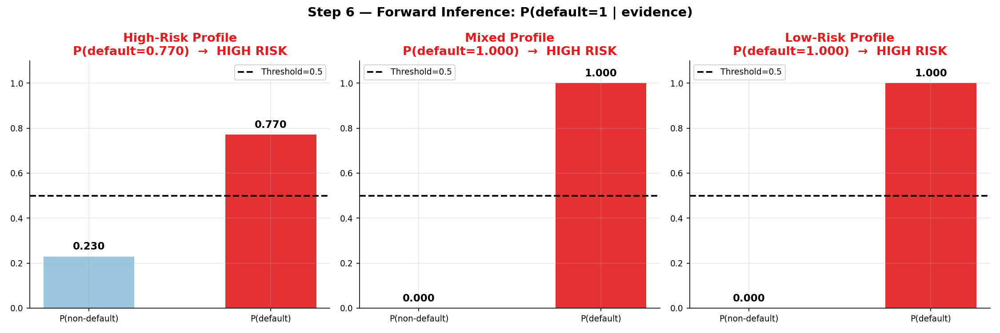

In [53]:
# ============================================================
# STEP 6: FORWARD INFERENCE
# ============================================================
# Forward (predictive) reasoning:
#   P(target | evidence) — "Biết đặc điểm, xác suất default là bao nhiêu?"
#
# Công thức VE:
#   P(target | E=e) = α · Σ_hidden Π_i P(Xi | pa(Xi))
#   α = normalizing constant
#
# Ứng dụng: Credit scoring cho từng hồ sơ vay mới.
# ============================================================

print("\n" + "─"*68)
print("  In_Pro  |  STEP 6: FORWARD INFERENCE")
print("  P(target | evidence) — Predictive Reasoning")
print("─"*68)


def forward_inference(evidence_dict, label=""):
    """
    Suy diễn xuôi: P(default | features_observed).

    Tham số:
        evidence_dict : {feature_name: observed_state_value}
        label         : tên mô tả hồ sơ (để print)

    Trả về:
        dict {"P(default=0)": float, "P(default=1)": float,
              "prediction": str, "risk_level": str}
    """
    # Lọc evidence hợp lệ (tránh OOV)
    valid_ev = {
        f: v for f, v in evidence_dict.items()
        if f in state_names and v in state_names.get(f, [])
    }

    try:
        q  = infer.query(variables=[TARGET], evidence=valid_ev, show_progress=False)
        p0, p1 = float(q.values[0]), float(q.values[1])
    except Exception:
        p0, p1 = 1 - prior_default, prior_default

    pred  = "DEFAULT" if p1 >= THRESHOLD_DEFAULT else "NON-DEFAULT"
    risk  = "HIGH" if p1 >= 0.7 else "MEDIUM" if p1 >= 0.3 else "LOW"

    print(f"\n  [{label}]")
    print(f"    Evidence    : {valid_ev}")
    print(f"    P(default=0): {p0:.4f}  |  P(default=1): {p1:.4f}")
    print(f"    Prediction  : {pred}   |  Risk Level: {risk}")

    return {"P(default=0)": p0, "P(default=1)": p1,
            "prediction": pred, "risk_level": risk}


# Ví dụ: 3 hồ sơ điển hình
print("\n  Example Forward Inference Cases:")

# High-risk profile: tất cả parents ở state cao nhất
ev_high = {f: state_names[f][-1] for f in parents_of_target[:4] if f in state_names}
res_high = forward_inference(ev_high, label="High-Risk Profile")

# Low-risk profile: tất cả parents ở state thấp nhất
ev_low  = {f: state_names[f][0] for f in parents_of_target[:4] if f in state_names}
res_low = forward_inference(ev_low, label="Low-Risk Profile")

# Mixed profile: một số cao, một số thấp
ev_mix  = {}
for i, f in enumerate(parents_of_target[:4]):
    if f in state_names:
        ev_mix[f] = state_names[f][-1] if i%2==0 else state_names[f][0]
res_mix = forward_inference(ev_mix, label="Mixed Profile")

# ── Forward Inference Risk Gauge Plot ────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle("Step 6 — Forward Inference: P(default=1 | evidence)",
             fontsize=14, fontweight="bold")

for ax, (res, lbl) in zip(axes, [
    (res_high, "High-Risk"), (res_mix, "Mixed"), (res_low, "Low-Risk")
]):
    p1_val = res["P(default=1)"]
    color  = C["youden"] if p1_val>=0.7 else C["highlight"] if p1_val>=0.3 else C["bn_blue"]
    bar    = ax.bar(["P(non-default)","P(default)"],
                    [res["P(default=0)"], p1_val],
                    color=[C["low_risk"], color], alpha=0.9, width=0.5)
    ax.axhline(THRESHOLD_DEFAULT, color="black", ls="--", lw=1.8, label="Threshold=0.5")
    ax.set_ylim(0, 1.1)
    ax.set_title(f"{lbl} Profile\nP(default={p1_val:.3f})  →  {res['risk_level']} RISK",
                 fontweight="bold", color=color)
    ax.legend(fontsize=9)
    for b in bar:
        ax.text(b.get_x()+b.get_width()/2, b.get_height()+0.03,
                f"{b.get_height():.3f}", ha="center", fontweight="bold", fontsize=11)

plt.tight_layout();
plt.show()




────────────────────────────────────────────────────────────────────
  In_Pro  |  STEP 7: BACKWARD INFERENCE
  P(feature | target=class) — Diagnostic Reasoning
────────────────────────────────────────────────────────────────────

  Backward inference table  [P(Xi | default=1) vs P(Xi | default=0)]:
  Feature                  State    P(.|def=1)     P(.|def=0)     LR
  ─────────────────────────────────────────────────────────────────
  other_installment_plans  0        0.2727         0.1124         2.426 ◀
  other_installment_plans  1        0.5191         0.8541         0.608
  other_installment_plans  2        0.2081         0.0335         6.214 ◀
  is_foreign_worker        0        0.2919         0.0478         6.100 ◀
  is_foreign_worker        1        0.7081         0.9522         0.744


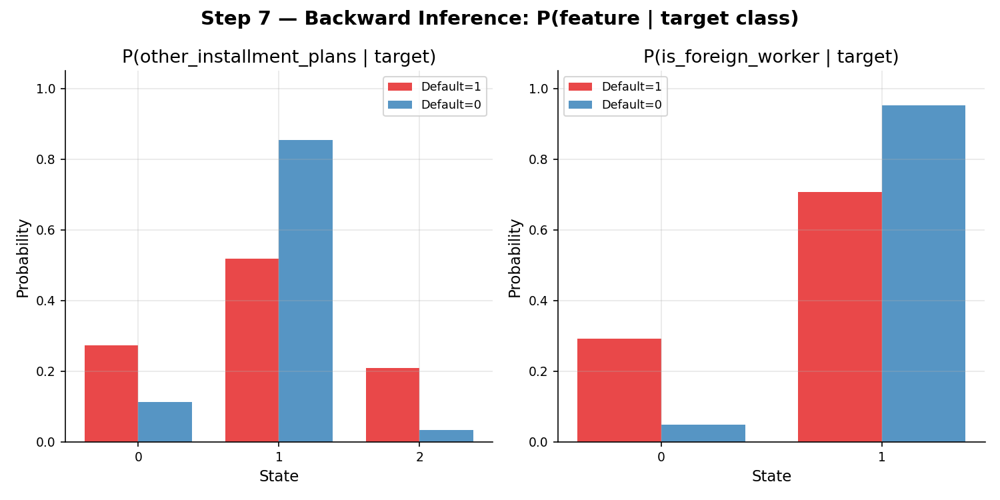

In [54]:
# ============================================================
# STEP 7: BACKWARD INFERENCE
# ============================================================
# Backward (diagnostic) reasoning:
#   P(Xi | target=1) — "Biết đã default, feature Xi có phân phối gì?"
#
# So sánh P(Xi | default=1) vs P(Xi | default=0):
#   → Feature nào có phân phối khác biệt nhiều nhất
#     = RISK DISCRIMINATOR quan trọng nhất
#
# Likelihood Ratio (LR):
#   LR(Xi=s) = P(Xi=s | default=1) / P(Xi=s | default=0)
#   LR > 1: state s gặp nhiều hơn khi default
#   LR < 1: state s gặp ít hơn khi default
# ============================================================

print("\n" + "─"*68)
print("  In_Pro  |  STEP 7: BACKWARD INFERENCE")
print("  P(feature | target=class) — Diagnostic Reasoning")
print("─"*68)


def backward_inference(target_value, query_features=None):
    """
    Suy diễn ngược: P(Xi | target=target_value)

    Tham số:
        target_value  : giá trị quan sát của target (0 hoặc 1)
        query_features: list features cần query

    Trả về:
        dict {feature: {state: probability}}
    """
    if query_features is None:
        query_features = parents_of_target[:6]

    results = {}
    for feat in query_features:
        if feat == TARGET: continue
        try:
            q = infer.query(variables=[feat],
                            evidence={TARGET: target_value},
                            show_progress=False)
            results[feat] = {
                st: float(q.values[i])
                for i, st in enumerate(state_names.get(feat, []))
            }
        except Exception:
            results[feat] = {}
    return results


# Query cho cả 2 class
bd1 = backward_inference(target_value=1)  # P(Xi | default=1)
bd0 = backward_inference(target_value=0)  # P(Xi | default=0)

print("\n  Backward inference table  [P(Xi | default=1) vs P(Xi | default=0)]:")
print(f"  {'Feature':<24} {'State':<8} {'P(.|def=1)':<14} {'P(.|def=0)':<14} LR")
print("  " + "─"*65)
for feat in bd1:
    if feat in bd0:
        for st in state_names.get(feat, []):
            p1_b = bd1[feat].get(st, 0)
            p0_b = bd0[feat].get(st, 0)
            lr   = p1_b/p0_b if p0_b>1e-6 else float("inf")
            flag = " ◀" if lr > 1.5 else ""
            print(f"  {feat:<24} {str(st):<8} {p1_b:<14.4f} {p0_b:<14.4f} {lr:.3f}{flag}")

# ── Backward Inference Visualization ─────────────────────────────────
features_to_plot = [f for f in list(bd1.keys())[:4] if bd1[f] and bd0.get(f)]
if features_to_plot:
    fig, axes = plt.subplots(1, len(features_to_plot),
                             figsize=(5*len(features_to_plot), 5), sharey=False)
    if len(features_to_plot) == 1:
        axes = [axes]
    fig.suptitle("Step 7 — Backward Inference: P(feature | target class)",
                 fontsize=14, fontweight="bold")

    for ax, feat in zip(axes, features_to_plot):
        states = state_names.get(feat, [])
        p1_vals = [bd1[feat].get(s, 0) for s in states]
        p0_vals = [bd0[feat].get(s, 0) for s in states]
        x = np.arange(len(states)); w = 0.38

        ax.bar(x - w/2, p1_vals, width=w, color=C["youden"],  alpha=0.8, label="Default=1")
        ax.bar(x + w/2, p0_vals, width=w, color=C["bn_blue"], alpha=0.8, label="Default=0")
        ax.set_xticks(x); ax.set_xticklabels([str(s) for s in states])
        ax.set(xlabel="State", ylabel="Probability",
               title=f"P({feat} | target)", ylim=(0,1.05))
        ax.legend(fontsize=8.5)

    plt.tight_layout();
    plt.show()



────────────────────────────────────────────────────────────────────
  In_Pro  |  STEP 8: INDIVIDUAL ANALYSIS
  Per-sample risk explanation + top risk factor identification
────────────────────────────────────────────────────────────────────

  Individual Analysis Examples:

  Individual [Highest-risk sample]
    P(default=1) = 1.0000  |  Risk Level: HIGH
    Top 5 risk factors:
      is_foreign_worker        state=0  |Δδ|=0.3592
      other_installment_plans  state=0  |Δδ|=0.2081
      credit_history           state=0  |Δδ|=0.1522
      secondary_obligor        state=2  |Δδ|=0.1127
      status_and_sex           state=3  |Δδ|=0.1088

  Individual [Median-risk sample]
    P(default=1) = 0.4997  |  Risk Level: MEDIUM
    Top 5 risk factors:
      secondary_obligor        state=1  |Δδ|=0.2670
      purpose                  state=7  |Δδ|=0.2391
      month_duration           state=3  |Δδ|=0.2079
      status_and_sex           state=2  |Δδ|=0.1637
      other_installment_plans  state=1  |

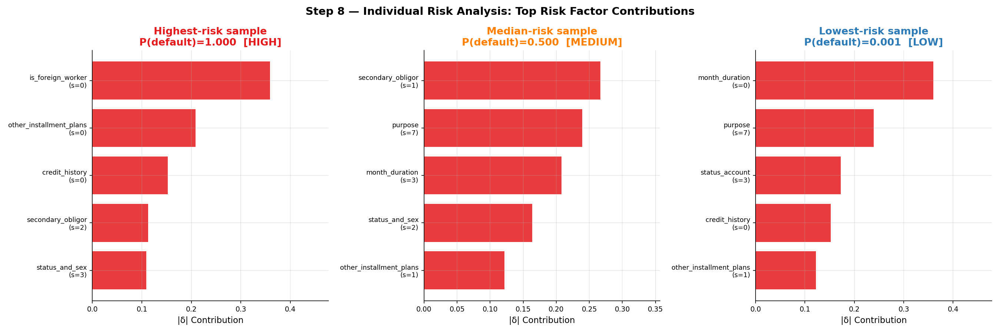

In [55]:
# ============================================================
# STEP 8: INDIVIDUAL ANALYSIS
# ============================================================
# Phân tích từng cá nhân (individual-level explanations):
#   1. Tính P(default=1 | X_i) cho từng test sample
#   2. Xác định top risk factors: feature nào đóng góp nhiều nhất
#      vào P(default=1) cho cá nhân đó
#   3. So sánh profile của cá nhân với population mean
#
# Risk contribution của feature Xi cho sample i:
#   contribution(Xi) = |P(default=1|Xi=xi) − P(default=1)_prior|
#   (capping effect: giả định conditional independence cục bộ)
#
# Phân loại risk:
#   HIGH   : P(default=1) ≥ 0.70
#   MEDIUM : P(default=1) ∈ [0.30, 0.70)
#   LOW    : P(default=1) < 0.30
# ============================================================

print("\n" + "─"*68)
print("  In_Pro  |  STEP 8: INDIVIDUAL ANALYSIS")
print("  Per-sample risk explanation + top risk factor identification")
print("─"*68)


def individual_analysis(sample_series, sample_id="", top_k=5):
    """
    Phân tích rủi ro cho 1 cá nhân cụ thể.

    Tham số:
        sample_series : pd.Series — giá trị features của cá nhân
        sample_id     : nhãn định danh
        top_k         : số risk factors hàng đầu cần hiển thị

    Trả về:
        dict bao gồm P(default), risk_level, top_factors
    """
    # Xác suất tổng hợp từ BN
    ev = {}
    for col in feature_cols:
        val = int(round(sample_series[col])) if col in sample_series else None
        if val is not None and val in state_names.get(col, []):
            ev[col] = val
        elif val is not None:
            ev[col] = nearest_valid_state(val, state_names.get(col, [1]))

    try:
        q  = infer.query(variables=[TARGET], evidence=ev, show_progress=False)
        p1 = float(q.values[1])
    except Exception:
        p1 = prior_default

    risk_level = "HIGH" if p1>=0.70 else "MEDIUM" if p1>=0.30 else "LOW"
    risk_color = C["youden"] if p1>=0.70 else C["highlight"] if p1>=0.30 else C["bn_blue"]

    # Tính contribution từng feature (marginal VE)
    contributions = {}
    for feat in feature_cols:
        if feat not in ev or feat not in state_names:
            continue
        try:
            q_f = infer.query(variables=[TARGET],
                              evidence={feat: ev[feat]}, show_progress=False)
            contributions[feat] = abs(float(q_f.values[1]) - prior_default)
        except Exception:
            contributions[feat] = 0.0

    top_factors = sorted(contributions.items(), key=lambda x: x[1], reverse=True)[:top_k]

    print(f"\n  Individual [{sample_id}]")
    print(f"    P(default=1) = {p1:.4f}  |  Risk Level: {risk_level}")
    print(f"    Top {top_k} risk factors:")
    for feat, contrib in top_factors:
        state_val = ev.get(feat, "N/A")
        print(f"      {feat:<24} state={state_val}  |Δδ|={contrib:.4f}")

    return {
        "sample_id"  : sample_id,
        "p_default"  : p1,
        "risk_level" : risk_level,
        "risk_color" : risk_color,
        "top_factors": top_factors,
        "evidence"   : ev
    }


# Chạy cho 3 mẫu đại diện từ test set
print("\n  Individual Analysis Examples:")

# Tìm mẫu có xác suất cao, trung bình, thấp
sample_idx_high   = int(np.argmax(y_prob_bn))
sample_idx_low    = int(np.argmin(y_prob_bn))
sample_idx_medium = int(np.argmin(np.abs(y_prob_bn - 0.5)))

results_individual = {}
for s_idx, s_label in [
    (sample_idx_high,   "Highest-risk sample"),
    (sample_idx_medium, "Median-risk sample"),
    (sample_idx_low,    "Lowest-risk sample"),
]:
    row = X_true_bn.iloc[s_idx]
    results_individual[s_label] = individual_analysis(row, sample_id=s_label, top_k=5)

# ── Individual Analysis Waterfall Chart ──────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Step 8 — Individual Risk Analysis: Top Risk Factor Contributions",
             fontsize=14, fontweight="bold")

for ax, (label, res) in zip(axes, results_individual.items()):
    factors = res["top_factors"]
    if not factors:
        ax.text(0.5, 0.5, "No data", ha="center", va="center"); continue

    feat_names = [f"{f}\n(s={res['evidence'].get(f,'?')})" for f,_ in factors]
    contrib_v  = [c for _,c in factors]
    bar_c      = [C["youden"] if c>0.05 else C["bn_blue"] for c in contrib_v]

    ax.barh(range(len(contrib_v)), contrib_v, color=bar_c, alpha=0.85)
    ax.set_yticks(range(len(contrib_v)))
    ax.set_yticklabels(feat_names, fontsize=8.5)
    ax.set(xlabel="|δ| Contribution", xlim=(0, max(contrib_v)*1.3+0.01),
           title=f"{label}\nP(default)={res['p_default']:.3f}  [{res['risk_level']}]")
    ax.invert_yaxis()
    ax.set_title(ax.get_title(), color=res["risk_color"], fontweight="bold")

plt.tight_layout(); plt.show()

Đang xử lý Suy luận Tiến...
Forward Inference: Default Probability based on Combined Features


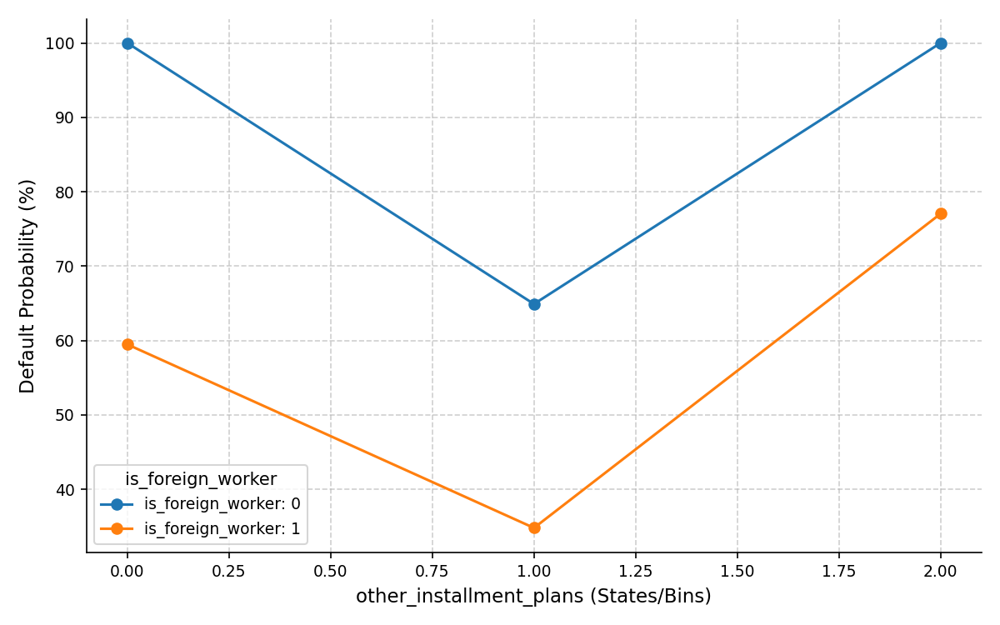

Đang xử lý Suy luận Lùi...
Backward Inference: Distribution of month_duration given Loan Status


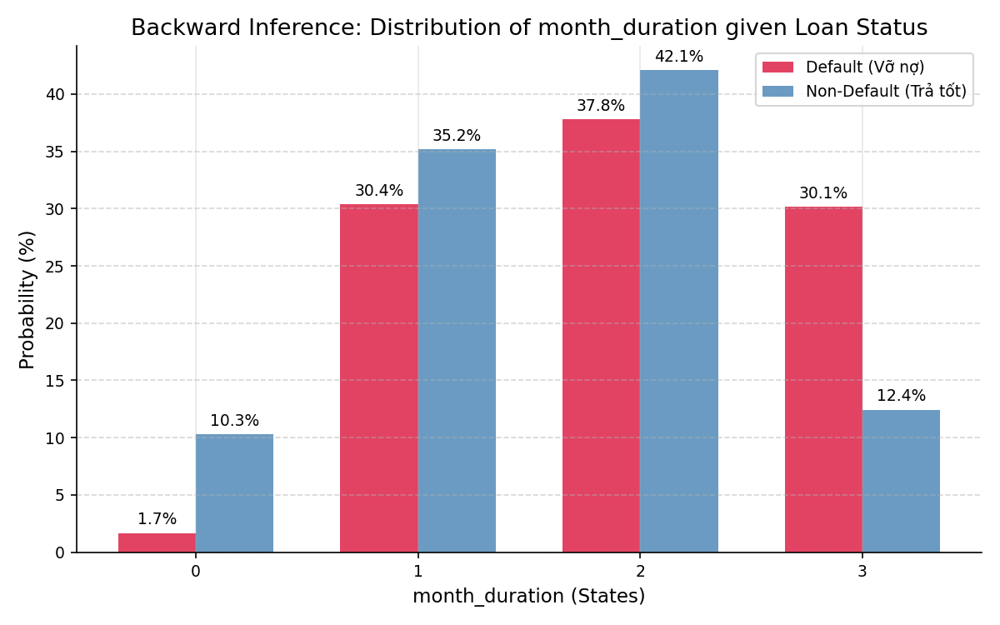

In [56]:

# Kiểm tra các biến có trong mạng để tránh lỗi
nodes = bn_model.nodes()
feature_1 = 'is_foreign_worker'
feature_2 = 'other_installment_plans'

# ==========================================
# 1. SUY LUẬN TIẾN (FORWARD INFERENCE)
# Phân tích kết hợp 2 biến tác động lên xác suất vỡ nợ
# ==========================================
print("Đang xử lý Suy luận Tiến...")
if feature_1 in nodes and feature_2 in nodes:
    states_1 = sorted(train_data[feature_1].unique())
    states_2 = sorted(train_data[feature_2].unique())

    # Khởi tạo ma trận lưu kết quả
    forward_results = np.zeros((len(states_1), len(states_2)))

    for i, s1 in enumerate(states_1):
        for j, s2 in enumerate(states_2):
            # Tính xác suất target=1 (Vỡ nợ) khi biết s1 và s2
            res = infer.query(variables=['target'], evidence={feature_1: s1, feature_2: s2}, show_progress=False)
            forward_results[i, j] = res.values[1] * 100 # Đổi ra %

    print("Forward Inference: Default Probability based on Combined Features")

    # Vẽ biểu đồ Line chart cho Suy luận Tiến
    plt.figure(figsize=(8, 5))
    for i, s1 in enumerate(states_1):
        plt.plot(states_2, forward_results[i, :], marker='o', label=f'{feature_1}: {s1}')

    plt.xlabel(f'{feature_2} (States/Bins)')
    plt.ylabel('Default Probability (%)')
    plt.legend(title=feature_1)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# ==========================================
# 2. SUY LUẬN LÙI (BACKWARD INFERENCE)
# Chẩn đoán phân phối của 1 biến khi biết khách hàng đã vỡ nợ (1) hoặc trả tốt (0)
# ==========================================
print("Đang xử lý Suy luận Lùi...")
target_feature = 'month_duration' # Biến muốn truy ngược nguyên nhân

if target_feature in nodes:
    # Truy vấn xác suất của target_feature khi biết target = 1 (Vỡ nợ)
    res_default = infer.query(variables=[target_feature], evidence={'target': 1}, show_progress=False)
    # Truy vấn xác suất của target_feature khi biết target = 0 (Trả tốt)
    res_non_default = infer.query(variables=[target_feature], evidence={'target': 0}, show_progress=False)

    states = sorted(train_data[target_feature].unique())
    probs_default = res_default.values * 100
    probs_non_default = res_non_default.values * 100

    # Vẽ biểu đồ cột ghép (Grouped Bar chart)
    print(f"Backward Inference: Distribution of {target_feature} given Loan Status")
    x = np.arange(len(states))
    width = 0.35

    fig, ax = plt.subplots(figsize=(8, 5))
    rects1 = ax.bar(x - width/2, probs_default, width, label='Default (Vỡ nợ)', color='crimson', alpha=0.8)
    rects2 = ax.bar(x + width/2, probs_non_default, width, label='Non-Default (Trả tốt)', color='steelblue', alpha=0.8)

    ax.set_title(f'Backward Inference: Distribution of {target_feature} given Loan Status')
    ax.set_xlabel(f'{target_feature} (States)')
    ax.set_ylabel('Probability (%)')
    ax.set_xticks(x)
    ax.set_xticklabels([str(s) for s in states])
    ax.legend()
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    # Thêm text %
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.1f}%',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=9)

    autolabel(rects1)
    autolabel(rects2)

    plt.tight_layout()
    plt.show()
else:
    print(f"Biến {target_feature} không có mặt trong mạng.")

# WHAT IF

In [57]:
# ============================================================
# STEP 9: WHAT-IF SCENARIO ANALYSIS
# ============================================================
# Phân tích kịch bản giả định: "What-if Xi thay đổi?"
# Trả lời câu hỏi: nếu can thiệp thay đổi feature Xi của một
# cá nhân, P(default=1) thay đổi như thế nào?
#
# Công thức:
#   ΔP(default=1) = P(default=1 | Xi=s_new, rest) − P(default=1 | original)
#
# Ứng dụng thực tế (credit risk):
#   - Nếu borrower tăng thu nhập thêm 1 bracket, rủi ro giảm bao nhiêu?
#   - Nếu debt ratio giảm, xác suất được duyệt vay tăng bao nhiêu?
#   - Lập kế hoạch can thiệp tối ưu để đưa borrower từ HIGH → LOW risk
#
# Đây là ứng dụng của do-calculus trong causal inference:
#   P(Y | do(Xi=s)) ≠ P(Y | Xi=s)  trong trường hợp tổng quát
#   (BN thực hiện soft evidence / posterior update, không hard do-calculus)
# ============================================================

print("\n" + "─"*68)
print("  In_Pro  |  STEP 9: WHAT-IF SCENARIO ANALYSIS")
print("  ΔP(default) = P(target=1 | Xi=s_new) − P(target=1 | original)")
print("─"*68)


def whatif_scenario(base_evidence, feature, new_states=None, sample_id=""):
    """
    Phân tích what-if: thay đổi feature về từng state, theo dõi ΔP(default).

    Tham số:
        base_evidence : dict {feat: state} — profile gốc của cá nhân
        feature       : feature cần thay đổi kịch bản
        new_states    : list các state cần thử (mặc định: tất cả states của feature)
        sample_id     : nhãn định danh

    Trả về:
        DataFrame {state, P(default=1), delta}
    """
    if new_states is None:
        new_states = state_names.get(feature, [])

    # Baseline: P(default=1) với profile gốc
    try:
        q_base = infer.query(variables=[TARGET], evidence=base_evidence, show_progress=False)
        p1_base = float(q_base.values[1])
    except Exception:
        p1_base = prior_default

    records = []
    for s in new_states:
        mod_ev = {**base_evidence, feature: s}   # Thay đổi chỉ feature này
        try:
            q = infer.query(variables=[TARGET], evidence=mod_ev, show_progress=False)
            p1_new = float(q.values[1])
        except Exception:
            p1_new = prior_default
        records.append({
            "state": s,
            "P(default=1)": p1_new,
            "delta": p1_new - p1_base,         # ΔP = P_new − P_baseline
            "is_baseline": (s == base_evidence.get(feature))
        })

    result_df = pd.DataFrame(records)
    print(f"\n  What-If [{sample_id}]: varying '{feature}'")
    print(f"    Baseline P(default=1) = {p1_base:.4f}")
    print(result_df[["state","P(default=1)","delta","is_baseline"]].to_string(index=False))
    return result_df, p1_base


# Chọn mẫu có rủi ro cao nhất để phân tích what-if
base_ev_whatif = results_individual["Highest-risk sample"]["evidence"]

# What-if cho từng feature trong Markov blanket (top 3 sensitive)
whatif_results = {}
top_sensitivity_feats = feat_sensitivity.head(3).index.tolist() if not feat_sensitivity.empty else parents_of_target[:3]

#for feat in top_sensitivity_feats:
    #if feat in base_ev_whatif and feat in state_names:
       # df_wi, p_base = whatif_scenario(
         #   base_evidence = base_ev_whatif,
          #  feature       = feat,
         #   sample_id     = f"High-Risk Individual | varying '{feat}'"
      #  )
      #  whatif_results[feat] = (df_wi, p_base)
        # ============================================================
# CẬP NHẬT TRONG VÒNG LẶP KHẢO SÁT WHAT-IF
# ============================================================

# Lấy danh sách các nút thuộc Markov Blanket của TARGET
mb_target = set(bn_model.get_markov_blanket(TARGET))

# ============================================================
# CẬP NHẬT TRONG VÒNG LẶP KHẢO SÁT WHAT-IF (PERSONA STRATEGY)
# ============================================================

for feat in top_sensitivity_feats:
    if feat in base_ev_whatif and feat in state_names:

        # 📌 CHIẾN LƯỢC PERSONA: Thay vì giữ lại tất cả, ta chỉ cố định
        # các biến nhân khẩu học không thể thay đổi để làm "mỏ neo".
        # ĐỐI VỚI BỘ GERMAN CREDIT, ta chọn: tuổi tác, giới tính/hôn nhân, và nhà ở.
        persona_keys = ['age', 'status_and_sex', 'housing']

        # Chỉ lấy giá trị của các biến Persona từ hồ sơ gốc,
        # và ĐẢM BẢO KHÔNG CHỨA biến đang muốn chạy kịch bản (feat)
        trimmed_evidence = {k: v for k, v in base_ev_whatif.items() if k in persona_keys and k != feat}

        # Truyền tập bằng chứng siêu mỏng này vào kịch bản giả định
        df_wi, p_base = whatif_scenario(
            base_evidence = trimmed_evidence,
            feature       = feat,
            sample_id     = f"High-Risk Persona | varying '{feat}'"
        )
        whatif_results[feat] = (df_wi, p_base)



────────────────────────────────────────────────────────────────────
  In_Pro  |  STEP 9: WHAT-IF SCENARIO ANALYSIS
  ΔP(default) = P(target=1 | Xi=s_new) − P(target=1 | original)
────────────────────────────────────────────────────────────────────

  What-If [High-Risk Persona | varying 'job']: varying 'job'
    Baseline P(default=1) = 0.3645
 state  P(default=1)     delta  is_baseline
     0      0.855064  0.490561        False
     1      0.386072  0.021569        False
     2      0.273543 -0.090960        False
     3      0.419047  0.054544        False

  What-If [High-Risk Persona | varying 'purpose']: varying 'purpose'
    Baseline P(default=1) = 0.3645
 state  P(default=1)     delta  is_baseline
     0      0.421966  0.057462        False
     1      0.348494 -0.016010        False
     2      0.350852 -0.013651        False
     3      0.753637  0.389134        False
     4      0.650851  0.286348        False
     5      0.300787 -0.063716        False
     6      0.788504

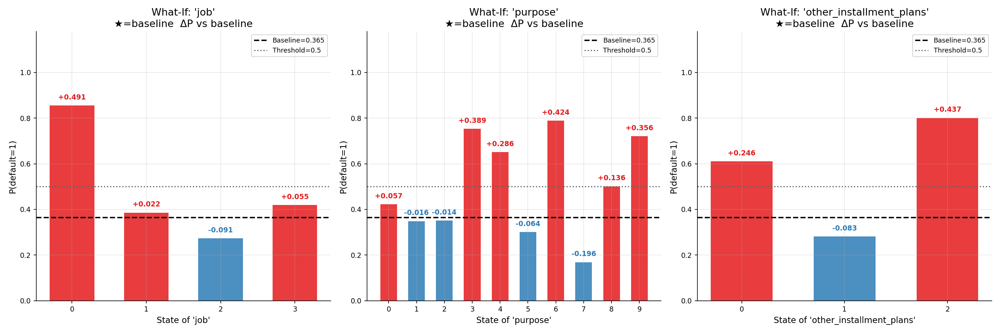

In [58]:
# ── What-If Visualization ─────────────────────────────────────────────
n_wi = len(whatif_results)
if n_wi > 0:
    fig, axes = plt.subplots(1, n_wi, figsize=(6*n_wi, 6))
    if n_wi == 1: axes = [axes]


    for ax, (feat, (df_wi, p_base)) in zip(axes, whatif_results.items()):
        states_wi  = df_wi["state"].astype(str).values
        p1_wi      = df_wi["P(default=1)"].values
        is_base_wi = df_wi["is_baseline"].values

        bar_colors = [
            C["highlight"] if b else (C["youden"] if p>p_base else C["bn_blue"])
            for p, b in zip(p1_wi, is_base_wi)
        ]
        bars = ax.bar(states_wi, p1_wi, color=bar_colors, alpha=0.85, width=0.6)

        # Baseline horizontal line
        ax.axhline(p_base, color="black", ls="--", lw=1.8, label=f"Baseline={p_base:.3f}")
        ax.axhline(THRESHOLD_DEFAULT, color=C["gray"], ls=":", lw=1.5, label="Threshold=0.5")

        # ΔP annotations
        for bar, delta in zip(bars, df_wi["delta"].values):
            sign = "+" if delta > 0 else ""
            clr  = C["youden"] if delta>0 else C["bn_blue"]
            ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.02,
                    f"{sign}{delta:.3f}", ha="center", va="bottom",
                    fontsize=9, color=clr, fontweight="bold")

        ax.set(xlabel=f"State of '{feat}'", ylabel="P(default=1)",
               ylim=(0, 1.18),
               title=f"What-If: '{feat}'\n★=baseline  ΔP vs baseline")
        ax.legend(fontsize=8.5)

        # Star marker cho baseline state
        for i, (bar, b) in enumerate(zip(bars, is_base_wi)):
            if b:
                ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.07,
                        "★", ha="center", fontsize=14, color=C["highlight"])

    plt.tight_layout(); plt.show()



## Subnetwork


────────────────────────────────────────────────────────────────────
  STEP 9: Subnetwork
────────────────────────────────────────────────────────────────────
  TARGET   : 'target'
  Parents  : ['is_foreign_worker', 'other_installment_plans']
  Children : ['collateral', 'credit_history', 'job', 'month_duration', 'purpose', 'secondary_obligor', 'status_account', 'status_and_sex']

  Case 1 — cặp parents có quan hệ trực tiếp : [('is_foreign_worker', 'other_installment_plans')]
  Case 2 — (parent→child của target)        : [('is_foreign_worker', 'secondary_obligor')]

────────────────────────────────────────────────────────────────────
  CASE 1: Parent ↔ Parent → Target
────────────────────────────────────────────────────────────────────


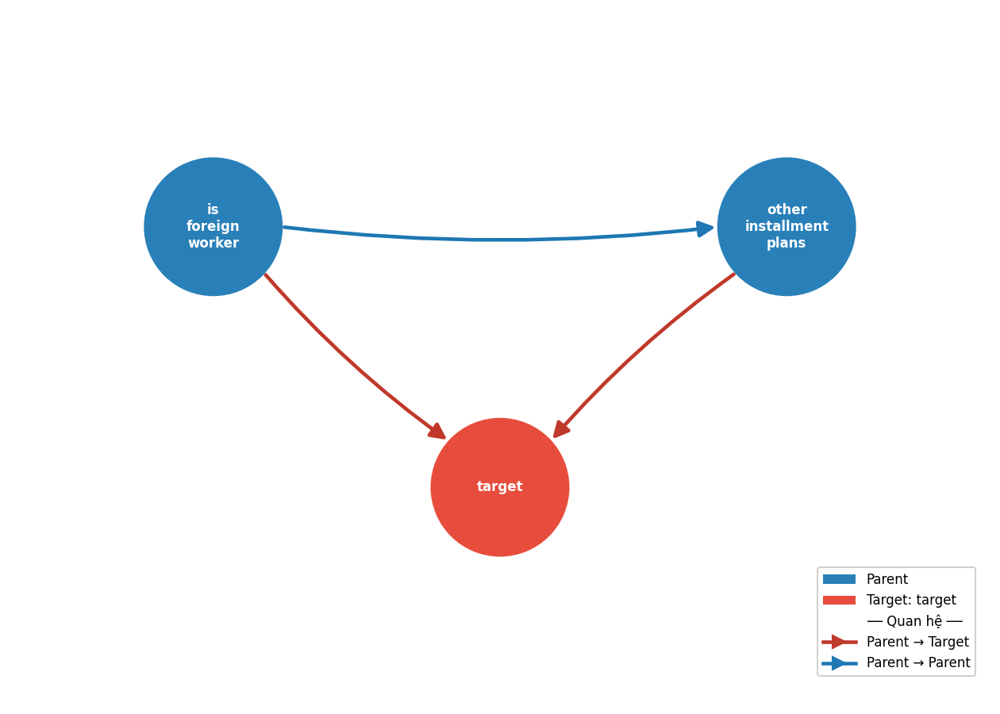

  -> Đã lưu: 'subnetwork_case1_1.png'

────────────────────────────────────────────────────────────────────
  CASE 2: Parent → Target → Child  (Parent có quan hệ với Child)
────────────────────────────────────────────────────────────────────


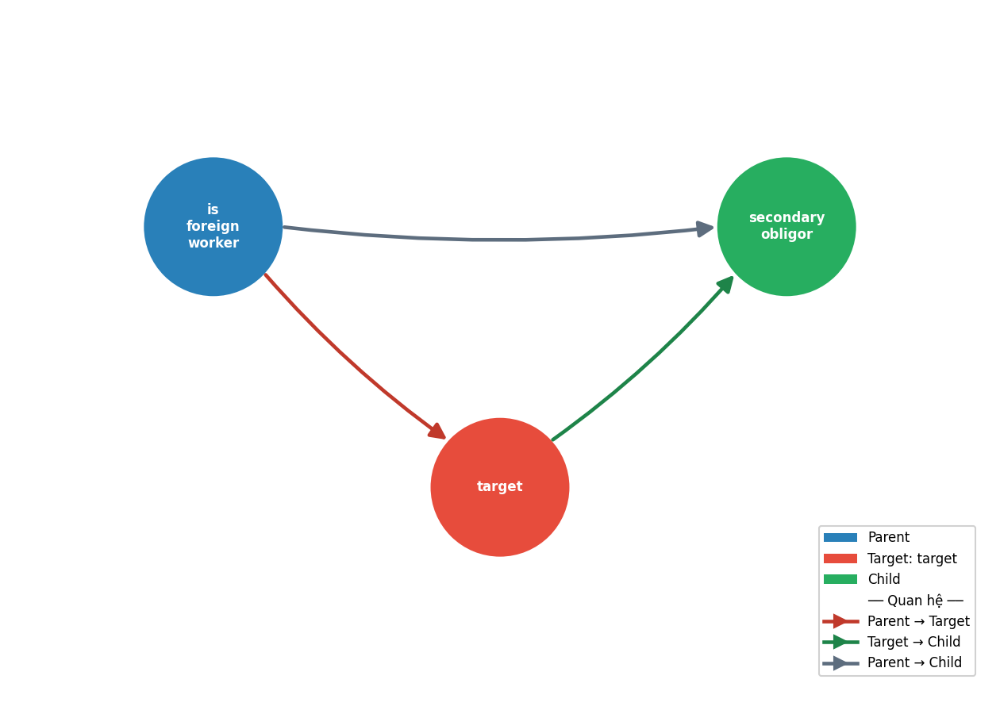

  -> Đã lưu: 'subnetwork_case2_1.png'


In [61]:
# ============================================================
# STEP 9: Subnetwork
# ============================================================
import matplotlib.patches as mpatches
import networkx as nx
from collections import defaultdict

print("\n" + "─"*68)
print("  STEP 9: Subnetwork")
print("─"*68)

# ── 1. Lấy cấu trúc cơ bản ──────────────────────────────────
parents  = set(bn_model.get_parents(TARGET))
children = set(bn_model.get_children(TARGET))
full_edges = list(bn_model.edges())

G_full = nx.DiGraph()
G_full.add_edges_from(full_edges)

direct_children_map  = {n: set(G_full.successors(n))  for n in G_full.nodes()}
direct_parents_map   = {n: set(G_full.predecessors(n)) for n in G_full.nodes()}

print(f"  TARGET   : '{TARGET}'")
print(f"  Parents  : {sorted(parents)}")
print(f"  Children : {sorted(children)}")

# ── 2. Xác định Case ────────────────────────────────────────
# CASE 1: Tìm cặp (P1, P2) — 2 parents có edge trực tiếp nhau
parent_pairs_case1 = []
parent_list = sorted(parents)
for i in range(len(parent_list)):
    for j in range(i+1, len(parent_list)):
        p1, p2 = parent_list[i], parent_list[j]
        if p2 in direct_children_map[p1] or p1 in direct_children_map[p2]:
            parent_pairs_case1.append((p1, p2))


# CASE 2: Tìm cặp (P, C) — parent của target có edge trực tiếp đến child của target
parent_child_pairs_case2 = []
for p in parents:
    for c in children:
        if c in direct_children_map[p]:
            parent_child_pairs_case2.append((p, c))

print(f"\n  Case 1 — cặp parents có quan hệ trực tiếp : {parent_pairs_case1}")
print(f"  Case 2 — (parent→child của target)        : {parent_child_pairs_case2}")

# ── 3. Hàm vẽ subnetwork tổng quát ─────────────────────────
def draw_subnetwork(nodes, edges, node_roles,  filename):
    COLOR_MAP = {
        "target" : "#E74C3C",
        "parent" : "#2980B9",
        "child"  : "#27AE60",
    }

    G = nx.DiGraph()
    G.add_nodes_from(nodes)
    G.add_edges_from(edges)

    parent_nodes = sorted([n for n in nodes if node_roles[n] == "parent"])
    child_nodes  = sorted([n for n in nodes if node_roles[n] == "child"])
    all_non_target = parent_nodes + child_nodes

    # ── Layout theo hình tròn ────────────────────────────────
    # Target ở tâm, các node còn lại xếp đều trên vòng tròn
    pos = {TARGET: (0.0, 0.0)}
    n_around = len(all_non_target)

    if n_around == 1:
        # Chỉ 1 node → đặt trên
        pos[all_non_target[0]] = (0.0, 2.5)

    elif n_around == 2:
        # 2 nodes → đặt đối xứng trái/phải phía trên
        # Đảm bảo parent luôn trên, child luôn dưới nếu có cả 2 loại
        if parent_nodes and child_nodes:
            pos[parent_nodes[0]] = (-2.2, 2.0)
            pos[child_nodes[0]]  = ( 2.2, 2.0)
        else:
            pos[all_non_target[0]] = (-2.2, 2.0)
            pos[all_non_target[1]] = ( 2.2, 2.0)

    else:
        # ≥ 3 nodes → xếp đều trên vòng tròn bán kính R
        # Bắt đầu từ góc 90° (đỉnh trên) và đi ngược chiều kim đồng hồ
        R = 2.8
        for i, node in enumerate(all_non_target):
            angle = np.pi / 2 + 2 * np.pi * i / n_around
            pos[node] = (R * np.cos(angle), R * np.sin(angle))

    # ── Canvas tự động theo bounding box ────────────────────
    NODE_R = 0.52
    xs  = [v[0] for v in pos.values()]
    ys  = [v[1] for v in pos.values()]
    pad = 1.5

    fig, ax = plt.subplots(figsize=(
        max(7, (max(xs)-min(xs))+4),
        max(6, (max(ys)-min(ys))+3)
    ))
    ax.set_xlim(min(xs)-pad, max(xs)+pad)
    ax.set_ylim(min(ys)-pad, max(ys)+pad)
    ax.set_aspect("equal")
    ax.axis("off")

    # ── Vẽ edges ─────────────────────────────────────────────
    for u, v in edges:
        if u not in pos or v not in pos:
            continue
        x1,y1 = pos[u]; x2,y2 = pos[v]
        dx,dy  = x2-x1, y2-y1
        dist   = np.hypot(dx,dy)
        if dist == 0: continue
        ux,uy  = dx/dist, dy/dist
        sx,sy  = x1+ux*NODE_R, y1+uy*NODE_R
        ex,ey  = x2-ux*NODE_R, y2-uy*NODE_R

        if v == TARGET:
            ec = "#C0392B"    # → target : đỏ
        elif u in parent_nodes and v in parent_nodes:
            ec = "#1F77B4"    # parent → parent : xanh dương
        elif u == TARGET:
            ec = "#1E8449"    # target → child : xanh lá
        else:
            ec = "#5D6D7E"    # parent ↔ child : xám

        ax.annotate("", xy=(ex,ey), xytext=(sx,sy),
                    arrowprops=dict(
                        arrowstyle="-|>", color=ec,
                        lw=2.2, mutation_scale=20,
                        connectionstyle="arc3,rad=0.06"),
                    zorder=1)

    # ── Vẽ nodes ─────────────────────────────────────────────
    for node in nodes:
        x,y = pos[node]
        ax.add_patch(plt.Circle((x,y), NODE_R,
                                color=COLOR_MAP[node_roles[node]],
                                zorder=2, linewidth=2, edgecolor="white"))
        label = node if len(node)<=13 else node.replace("_","\n")
        ax.text(x,y,label, ha="center", va="center",
                fontsize=8, fontweight="bold",
                color="white", zorder=3, linespacing=1.2)

    # ── Legend ───────────────────────────────────────────────
    legend_elements = [
        mpatches.Patch(facecolor="#2980B9", label="Parent"),
        mpatches.Patch(facecolor="#E74C3C", label=f"Target: {TARGET}"),
    ]
    if child_nodes:
        legend_elements.append(
            mpatches.Patch(facecolor="#27AE60", label="Child")
        )
    legend_elements.append(
        plt.Line2D([0],[0], color="none", label="── Quan hệ ──")
    )

    has_p2t = any(v==TARGET for u,v in edges)
    has_t2c = any(u==TARGET for u,v in edges)
    has_p2p = any(node_roles.get(u)=="parent" and node_roles.get(v)=="parent"
                  for u,v in edges)
    has_p2c = any(node_roles.get(u)=="parent" and node_roles.get(v)=="child"
                  for u,v in edges)

    if has_p2t:
        legend_elements.append(
            plt.Line2D([0],[0], color="#C0392B", lw=2.2,
                       marker=">", markersize=8, label="Parent → Target"))
    if has_t2c:
        legend_elements.append(
            plt.Line2D([0],[0], color="#1E8449", lw=2.2,
                       marker=">", markersize=8, label="Target → Child"))
    if has_p2p:
        legend_elements.append(
            plt.Line2D([0],[0], color="#1F77B4", lw=2.2,
                       marker=">", markersize=8, label="Parent → Parent"))
    if has_p2c:
        legend_elements.append(
            plt.Line2D([0],[0], color="#5D6D7E", lw=2.2,
                       marker=">", markersize=8, label="Parent → Child"))

    ax.legend(handles=legend_elements, loc="lower right",
              fontsize=8, framealpha=0.9, handlelength=2.5)
    plt.tight_layout()
    plt.savefig(filename, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"  -> Đã lưu: '{filename}'")


# ── 4. Vẽ Case 1: Parent + Parent + Target ──────────────────
print("\n" + "─"*68)
print("  CASE 1: Parent ↔ Parent → Target")
print("─"*68)

if parent_pairs_case1:
    for idx, (p1, p2) in enumerate(parent_pairs_case1):
        nodes_c1 = [p1, p2, TARGET]
        edges_c1 = [(u,v) for u,v in full_edges
                    if u in nodes_c1 and v in nodes_c1]
        roles_c1 = {p1:"parent", p2:"parent", TARGET:"target"}

        draw_subnetwork(
            nodes    = nodes_c1,
            edges    = edges_c1,
            node_roles = roles_c1,
            filename = f"subnetwork_case1_{idx+1}.png"
        )
else:
    print("  Không tìm thấy cặp parents có quan hệ trực tiếp.")

    # Fallback: vẽ tất cả parents + target (không có edge giữa parents)
    nodes_all = list(parents) + [TARGET]
    edges_all = [(u,v) for u,v in full_edges
                 if u in nodes_all and v in nodes_all]
    roles_all = {n: ("target" if n==TARGET else "parent") for n in nodes_all}
    draw_subnetwork(
        nodes      = nodes_all,
        edges      = edges_all,
        node_roles = roles_all,
        filename   = "subnetwork_case1_all.png"
    )

# ── 5. Vẽ Case 2: Parent + Target + Child ───────────────────
print("\n" + "─"*68)
print("  CASE 2: Parent → Target → Child  (Parent có quan hệ với Child)")
print("─"*68)

if parent_child_pairs_case2:
    for idx, (p, c) in enumerate(parent_child_pairs_case2):
        nodes_c2 = [p, TARGET, c]
        edges_c2 = [(u,v) for u,v in full_edges
                    if u in nodes_c2 and v in nodes_c2]
        roles_c2 = {p:"parent", TARGET:"target", c:"child"}


        draw_subnetwork(
            nodes      = nodes_c2,
            edges      = edges_c2,
            node_roles = roles_c2,
            filename   = f"subnetwork_case2_{idx+1}.png"
        )
else:
    print("  Không tìm thấy cặp (parent → child của target).")

In [63]:
# ============================================================
# STEP 9B: WHAT-IF
# ============================================================
import itertools

print("\n" + "─"*68)
print("  STEP 9B: WHAT-IF")
print("─"*68)

top_n = 5

def print_cpt_horizontal(cpt_df, evidence_cols, target_col,
                         prob_cols=None, title=""):
    print(f"\n  {title}")
    n_cols = len(cpt_df)
    col_w  = max(10, max(len(str(cpt_df.iloc[i][ec]))
                         for ec in evidence_cols
                         for i in range(n_cols)) + 2)
    sep = "  " + "─" * (32 + col_w * n_cols)
    print(sep)
    for ec in evidence_cols:
        vals = [str(cpt_df.iloc[i][ec]) for i in range(n_cols)]
        print(f"  {ec:30s}|" + "".join(f"{v:>{col_w}}" for v in vals))
    print(sep)
    if prob_cols is None:
        prob_cols = [c for c in cpt_df.columns if c.startswith("P(")]
    for pc in prob_cols:
        pvals = [f"{cpt_df.iloc[i][pc]:.4f}" for i in range(n_cols)]
        print(f"  {pc:30s}|" + "".join(f"{v:>{col_w}}" for v in pvals))
    print(sep)


def print_rules(cpt_df, evidence_cols, target_col, top_n=5):
    p1_col = f"P({target_col}=1)"
    if p1_col not in cpt_df.columns:
        return
    for label, asc in [("CAO NHẤT", False), ("THẤP NHẤT", True)]:
        sub = (cpt_df.sort_values(p1_col, ascending=asc)
               .head(top_n).reset_index(drop=True))
        print(f"\n  Top {top_n} rule rủi ro {label}:")
        for _, row in sub.iterrows():
            cond = " and ".join([f"{c}={row[c]}" for c in evidence_cols])
            print(f"    If {cond}  →  {p1_col} = "
                  f"{row[p1_col]*100:.1f}%")


def build_cpt(query_nodes, target_col, sort_asc=True):
    node_states = [state_names[n] for n in query_nodes]
    records     = []
    for combo in itertools.product(*node_states):
        evidence = dict(zip(query_nodes, combo))
        try:
            q  = infer.query(variables=[target_col],
                             evidence=evidence, show_progress=False)
            p0 = float(q.values[0])
            p1 = float(q.values[1])
        except Exception:
            p0 = 1 - prior_default
            p1 = prior_default
        records.append({
            **evidence,
            f"P({target_col}=0)": round(p0, 4),
            f"P({target_col}=1)": round(p1, 4)
        })
    return (pd.DataFrame(records)
            .sort_values(query_nodes, ascending=sort_asc)
            .reset_index(drop=True))


def build_cpt_general(evidence_nodes, query_var, sort_asc=True):
    node_states  = [state_names[n] for n in evidence_nodes]
    query_states = state_names[query_var]
    records      = []
    for combo in itertools.product(*node_states):
        evidence = dict(zip(evidence_nodes, combo))
        try:
            q     = infer.query(variables=[query_var],
                                evidence=evidence, show_progress=False)
            probs = {f"P({query_var}={s})": round(float(q.values[i]), 4)
                     for i, s in enumerate(query_states)}
        except Exception:
            probs = {f"P({query_var}={s})": round(1/len(query_states), 4)
                     for s in query_states}
        records.append({**evidence, **probs})
    return (pd.DataFrame(records)
            .sort_values(evidence_nodes, ascending=sort_asc)
            .reset_index(drop=True))


# ============================================================
# CASE 1: P(Target | Parent1 × Parent2)
# DÙNG LẠI parent_pairs_case1 từ Step 9A — KHÔNG tính lại
# ============================================================
print("\n" + "═"*68)
print("  CASE 1: P(Target | Parent1 × Parent2)")
print("  Nguồn: parent_pairs_case1 (đã xác định ở Step 9A)")
print("═"*68)

if parent_pairs_case1:
    for idx, (p1, p2) in enumerate(parent_pairs_case1):
        print(f"\n  Cặp [{idx+1}] (khớp subnetwork_case1_{idx+1}.png): "
              f"'{p1}'  ×  '{p2}'")
        cpt_c1 = build_cpt([p1, p2], TARGET)
        prob_cols_c1 = [f"P({TARGET}=1)", f"P({TARGET}=0)"]

        print_cpt_horizontal(
            cpt_df        = cpt_c1,
            evidence_cols = [p1, p2],
            target_col    = TARGET,
            prob_cols     = prob_cols_c1,
            title         = f"CPT: P({TARGET} | {p1} × {p2})"
        )
        print_rules(cpt_c1, [p1, p2], TARGET, top_n)
        cpt_c1.to_csv(f"whatif_case1_pair{idx+1}.csv", index=False)
else:
    # Đồng bộ với fallback của Step 9A: parent_pairs_case1 rỗng
    # → 9A đã vẽ subnetwork_case1_all.png (tất cả parents)
    print("  parent_pairs_case1 rỗng — không tồn tại cặp parents")
    cpt_c1 = build_cpt(parent_list, TARGET)
    prob_cols_c1 = [f"P({TARGET}=1)", f"P({TARGET}=0)"]
    print_cpt_horizontal(
        cpt_df        = cpt_c1,
        evidence_cols = parent_list,
        target_col    = TARGET,
        prob_cols     = prob_cols_c1,
        title         = f"CPT: P({TARGET} | {', '.join(parent_list)})"
    )
    print_rules(cpt_c1, parent_list, TARGET, top_n)
    cpt_c1.to_csv("whatif_case1_all_parents.csv", index=False)


# ============================================================
# CASE 2: P(Target | Parent × Child)
# ============================================================
print("\n" + "═"*68)
print("  CASE 2: P(Target | Parent × Child)")
print("═"*68)

if parent_child_pairs_case2:
    for idx, (p, c) in enumerate(parent_child_pairs_case2):
        print(f"\n  Cặp [{idx+1}]"
              f"Parent='{p}'  ×  Child='{c}'")

        # ── 2a: P(Target | Parent × Child) ─────────────────
        print(f"\n  [2a] P({TARGET} | {p} × {c})")
        cpt_2a = build_cpt([p, c], TARGET)
        prob_cols_2a = [f"P({TARGET}=1)", f"P({TARGET}=0)"]

        print_cpt_horizontal(
            cpt_df        = cpt_2a,
            evidence_cols = [p, c],
            target_col    = TARGET,
            prob_cols     = prob_cols_2a,
            title         = f"CPT: P({TARGET} | {p} × {c})"
        )
        print_rules(cpt_2a, [p, c], TARGET, top_n)
        cpt_2a.to_csv(f"whatif_case2a_pair{idx+1}.csv", index=False)

        # ── 2b: P(Child | Parent) — chỉ khi edge p→c thực sự tồn tại ──
        if c in direct_children_map.get(p, set()):
            print(f"\n  [2b] P({c} | {p})  — tác động gián tiếp qua child")
            cpt_2b = build_cpt_general([p], c)
            prob_cols_2b = [f"P({c}={s})" for s in state_names[c]]

            print_cpt_horizontal(
                cpt_df        = cpt_2b,
                evidence_cols = [p],
                target_col    = c,
                prob_cols     = prob_cols_2b,
                title         = f"CPT: P({c} | {p})"
            )
            cpt_2b.to_csv(f"whatif_case2b_pair{idx+1}.csv", index=False)
else:
    print("  parent_child_pairs_case2 rỗng — không có Case 2 nào để phân tích")


# ============================================================
# PHẦN B: Sensitivity — Δ tác động từng node lên Target
# ============================================================
print("\n" + "═"*68)
print("  PHẦN B: Sensitivity — Δ tác động từng node")
print("═"*68)

# Gộp nodes từ đúng 2 nguồn của Step 9A
sensitivity_nodes = list(parents)  # tất cả parents (luôn liên quan target)
for p1, p2 in parent_pairs_case1:
    sensitivity_nodes += [p1, p2]
for p, c in parent_child_pairs_case2:
    sensitivity_nodes += [p, c]

sensitivity_nodes = list(dict.fromkeys(sensitivity_nodes))  # dedup, giữ thứ tự

records_sens = []
for node in sensitivity_nodes:
    if node not in state_names:
        continue
    node_type = ("parent" if node in parents
                 else "child" if node in children
                 else "other")
    for state in state_names[node]:
        try:
            q  = infer.query(variables=[TARGET],
                             evidence={node: state},
                             show_progress=False)
            p0 = float(q.values[0])
            p1 = float(q.values[1])
        except Exception:
            p0 = 1 - prior_default
            p1 = prior_default
        records_sens.append({
            "node"          : node,
            "node_type"     : node_type,
            "state"         : state,
            f"P({TARGET}=0)": round(p0, 4),
            f"P({TARGET}=1)": round(p1, 4),
        })

sens_df = pd.DataFrame(records_sens)

summary_rows = []
for node, grp in sens_df.groupby("node"):
    p1v = grp[f"P({TARGET}=1)"]
    summary_rows.append({
        "node"           : node,
        "node_type"      : grp["node_type"].iloc[0],
        "P(T=1) min"     : round(p1v.min(), 4),
        "P(T=1) max"     : round(p1v.max(), 4),
        "Δ impact"       : round(p1v.max() - p1v.min(), 4),
        "state_low_risk" : grp.loc[p1v.idxmin(), "state"],
        "state_high_risk": grp.loc[p1v.idxmax(), "state"],
    })

summary_df = (pd.DataFrame(summary_rows)
              .sort_values("Δ impact", ascending=False)
              .reset_index(drop=True))

print(summary_df.to_string(index=False))

print("\n  Rule tổng hợp:")
for _, row in summary_df.iterrows():
    print(f"\n    [{row['node_type'].upper():8s}] '{row['node']}'")
    print(f"      Rủi ro CAO  : state={row['state_high_risk']} "
          f"→ P({TARGET}=1) = {row['P(T=1) max']*100:.1f}%")
    print(f"      Rủi ro THẤP : state={row['state_low_risk']} "
          f"→ P({TARGET}=1) = {row['P(T=1) min']*100:.1f}%")
    print(f"      Biên độ     : Δ = {row['Δ impact']*100:.1f}%")

sens_df.to_csv("whatif_sensitivity_nodes.csv", index=False)
summary_df.to_csv("whatif_sensitivity_summary.csv", index=False)
print("\n  -> Đã lưu tất cả file CSV.")


────────────────────────────────────────────────────────────────────
  STEP 9B: WHAT-IF
────────────────────────────────────────────────────────────────────

════════════════════════════════════════════════════════════════════
  CASE 1: P(Target | Parent1 × Parent2)
  Nguồn: parent_pairs_case1 (đã xác định ở Step 9A)
════════════════════════════════════════════════════════════════════

  Cặp [1] (khớp subnetwork_case1_1.png): 'is_foreign_worker'  ×  'other_installment_plans'

  CPT: P(target | is_foreign_worker × other_installment_plans)
  ────────────────────────────────────────────────────────────────────────────────────────────
  is_foreign_worker             |       0.0       0.0       0.0       1.0       1.0       1.0
  other_installment_plans       |       0.0       1.0       2.0       0.0       1.0       2.0
  ────────────────────────────────────────────────────────────────────────────────────────────
  P(target=1)                   |    1.0000    0.6491    1.0000    0.5948    

# LIME, SHAP, BAYESIAN NETWORK

In [64]:
pip install lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=91dc253302d511bbd36b627fa81a716cb0f34bb25969cdf8f410098fca8347f5
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime



===== CUSTOMER 34 =====
Actual Label: 0
Probability of Default = 1.0000

Running LIME...


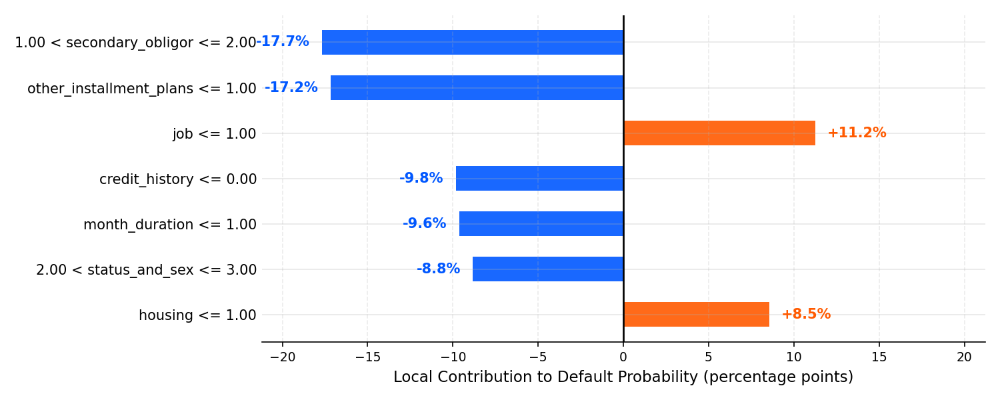


Running Bayesian Network Waterfall Visualization...


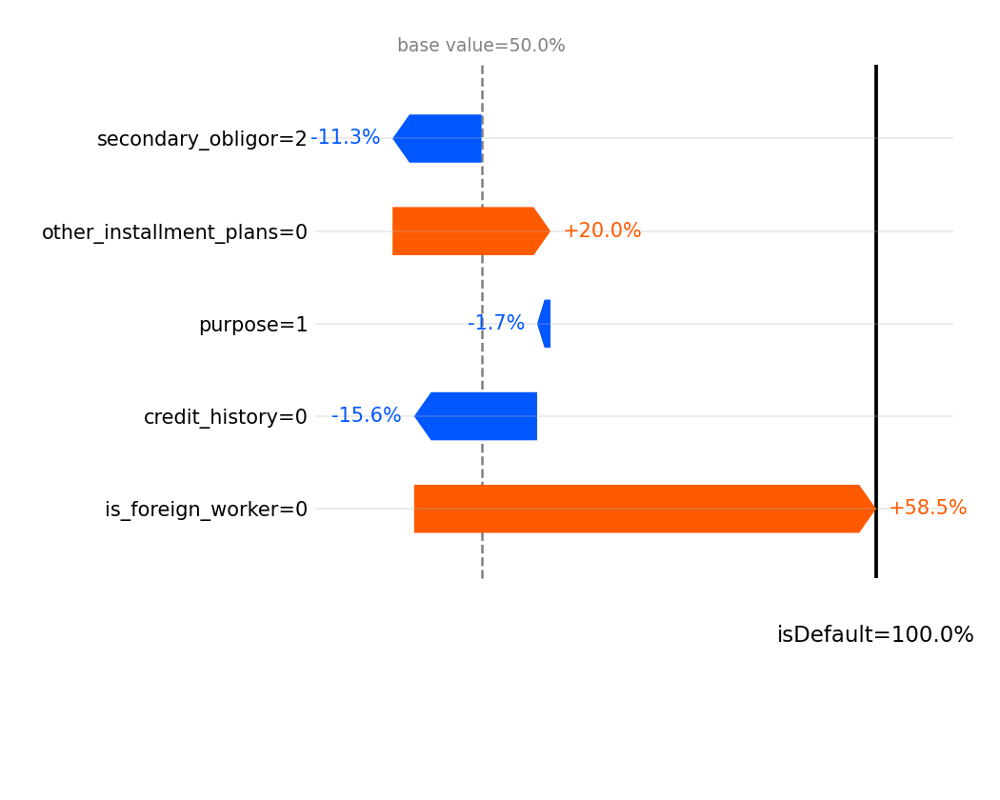


Running SHAP...


  0%|          | 0/1 [00:00<?, ?it/s]

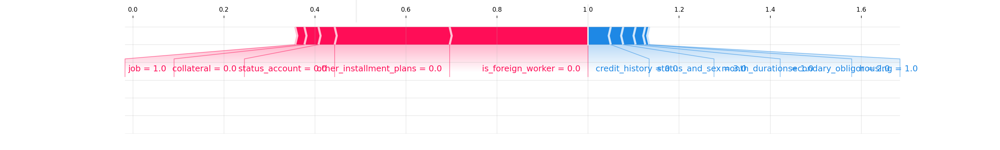

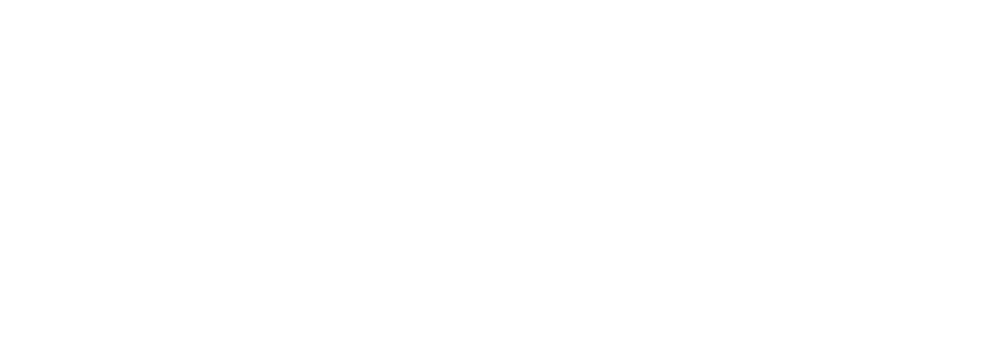

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lime
import lime.lime_tabular
import shap

from matplotlib.patches import Polygon


# ======================================================
# RANDOM CUSTOMER
# ======================================================

#np.random.seed(42)
sample_idx = np.random.randint(0, len(X_true_bn))

sample_customer = X_true_bn.iloc[sample_idx]
actual_label = y_true.iloc[sample_idx]

print(f"\n===== CUSTOMER {sample_idx} =====")
print(f"Actual Label: {actual_label}")

# ======================================================
# BAYESIAN INFERENCE
# ======================================================

infer = VariableElimination(bn_model)


# ======================================================
# FINAL PD
# ======================================================

prob_default = bn_predict_proba(
    sample_customer.to_frame().T
)[0][1]

print(f"Probability of Default = {prob_default:.4f}")


# ======================================================
# (a) LIME - Custom Pretty Plot with Percentage Labels
# ======================================================
print("\nRunning LIME...")

lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_kpro.values,
    feature_names=X_train_kpro.columns.tolist(),
    class_names=["Good (0)", "Bad (1)"],
    mode="classification",
    random_state=42
)

exp_lime = lime_explainer.explain_instance(
    data_row=sample_customer.values,
    predict_fn=bn_predict_proba,
    num_features=7,
    labels=(1,)   # giải thích cho class Bad / Default
)

# Lấy explanation cho class Default = 1
target_label = 1
lime_items = exp_lime.as_list(label=target_label)

# Tách feature và contribution
lime_features = [item[0] for item in lime_items]
lime_values = np.array([item[1] for item in lime_items]) * 100   # đổi sang %

# Đảo thứ tự để feature quan trọng nhất nằm trên cùng
lime_features = lime_features[::-1]
lime_values = lime_values[::-1]

# Màu: cam = tăng xác suất default, xanh = giảm xác suất default
orange = "#ff5a00"
blue = "#0057ff"
colors = [orange if v > 0 else blue for v in lime_values]

fig, ax = plt.subplots(figsize=(10, 4))

bars = ax.barh(
    lime_features,
    lime_values,
    color=colors,
    alpha=0.9,
    height=0.55
)

# Đường mốc 0%
ax.axvline(
    0,
    color="black",
    linewidth=1.3
)

# Thêm nhãn % vào cuối từng cột
max_abs_val = max(abs(lime_values)) if len(lime_values) > 0 else 1
text_pad = max_abs_val * 0.04

for i, v_val in enumerate(lime_values):
    if v_val > 0:
        x_text = v_val + text_pad
        ha = "left"
    else:
        x_text = v_val - text_pad
        ha = "right"

    ax.text(
        x_text,
        i,
        f"{v_val:+.1f}%",
        va="center",
        ha=ha,
        fontsize=10,
        color=colors[i],
        fontweight="bold"
    )



ax.set_xlabel(
    "Local Contribution to Default Probability (percentage points)",
    fontsize=11
)

# Làm biểu đồ sạch hơn
ax.tick_params(axis="y", labelsize=10, length=0)
ax.tick_params(axis="x", labelsize=9)

for spine in ["top", "right", "left"]:
    ax.spines[spine].set_visible(False)

ax.grid(axis="x", linestyle="--", alpha=0.25)

# Nới trục x để chữ % không bị cắt
x_lim = max_abs_val + text_pad * 5
ax.set_xlim(-x_lim, x_lim)

plt.tight_layout()
plt.show()

# ======================================================
# (b) JOINT PROBABILITY OF BAYESIAN NETWORK
#     Waterfall style: 0% → Final Probability
# ======================================================
print("\nRunning Bayesian Network Waterfall Visualization...")


def _fmt_val(v):
    """
    Format feature value.
    Example:
    1.0 -> 1
    1   -> 1
    """
    try:
        if float(v).is_integer():
            return str(int(v))
    except Exception:
        pass
    return str(v)


def _fmt_pct(v, first=False):
    """
    Always show 1 digit after decimal.
    Example:
    69.123 -> 69.1%
    0.734  -> +0.7%
    -9.84  -> -9.8%
    """
    if first:
        return f"{v:.1f}%"
    return f"{v:+.1f}%"


def _draw_arrow_bar(ax, x0, x1, y, height, color, head_size):
    """
    Draw horizontal waterfall arrow bar.

    Positive impact:
        x0 → x1, arrow points right

    Negative impact:
        x0 → x1, arrow points left
    """
    dx = x1 - x0

    if abs(dx) < 1e-12:
        return

    half_height = height / 2
    head = min(abs(dx) * 0.55, head_size)

    if dx > 0:
        points = [
            (x0, y - half_height),
            (x1 - head, y - half_height),
            (x1, y),
            (x1 - head, y + half_height),
            (x0, y + half_height),
        ]
    else:
        points = [
            (x0, y - half_height),
            (x1 + head, y - half_height),
            (x1, y),
            (x1 + head, y + half_height),
            (x0, y + half_height),
        ]

    polygon = Polygon(
        points,
        closed=True,
        facecolor=color,
        edgecolor=color,
        linewidth=0
    )

    ax.add_patch(polygon)

# Tính xác suất khi CHƯA CÓ EVIDENCE (Mốc xuất phát thực tế của model)
prior_res = infer.query(variables=["target"], show_progress=False)
base_prob = float(prior_res.values[1])  # Xác suất tiên nghiệm của class 1 (Default)

# ------------------------------------------------------
# Sequential Bayesian inference
# Start from 0%, then accumulate contribution sequentially
# ------------------------------------------------------
evidence = {}
current_prob = base_prob

impact_features = []
impact_values = []

# Preprocess the sample_customer to ensure valid states for BN inference
# This calls the prepare_bn_features function defined in a previous cell
prepared_sample_customer = prepare_bn_features(sample_customer.to_frame().T).iloc[0]

# Get features in the order of the prepared sample, and ensure they are in the BN model
features_in_order = [
    f for f in prepared_sample_customer.index
    if f in bn_model.nodes() and f != TARGET
] # Exclude target from features

for feature in features_in_order:
    val = prepared_sample_customer[feature] # Use the already prepared value
    evidence[feature] = val

    res = infer.query(
        variables=["target"],
        evidence=evidence,
        show_progress=False
    )

    new_prob = float(res.values[1])

    # Contribution từ trạng thái trước đó đến trạng thái mới
    impact = (new_prob - current_prob) * 100

    impact_features.append(f"{feature}={_fmt_val(val)}")
    impact_values.append(impact)

    current_prob = new_prob

# Chỉ giữ lại các biến có tác động đáng kể (lớn hơn hoặc bằng 0.01%)
filtered_features = []
filtered_values = []
for feat, val in zip(impact_features, impact_values):
    if abs(val) >= 1e-2:
        filtered_features.append(feat)
        filtered_values.append(val)

# Gán lại danh sách đã lọc để đưa vào biểu đồ
impact_features = filtered_features
impact_values = filtered_values

# Final predicted default probability
base_percent = base_prob * 100
final_percent = current_prob * 100

# Cumulative waterfall positions
cumulative = [base_percent]
for imp in impact_values:
    cumulative.append(cumulative[-1] + imp)

cumulative = np.array(cumulative)
starts = cumulative[:-1]
ends = cumulative[1:]


# ------------------------------------------------------
# Plot
# ------------------------------------------------------
fig, ax = plt.subplots(figsize=(7, 5.6))

orange = "#ff5a00"
blue = "#0057ff"

y_pos = np.arange(len(impact_features))
bar_height = 0.52

# Tính toán lại vùng giới hạn hiển thị của trục X dựa trên mốc xuất phát mới
x_min = min(np.min(starts), np.min(ends), final_percent, base_percent)
x_max = max(np.max(starts), np.max(ends), final_percent, base_percent)

x_range = x_max - x_min
pad = x_range * 0.16 if x_range > 0 else 5
text_pad = x_range * 0.025 if x_range > 0 else 1
head_size = x_range * 0.035 if x_range > 0 else 1

ax.set_xlim(x_min - pad, x_max + pad)

# Draw waterfall bars
for i, (feature_name, start, end, val) in enumerate(
    zip(impact_features, starts, ends, impact_values)
):
    # Nếu biến hầu như không tác động (0.0%), bỏ qua không vẽ bar để tránh lỗi hiển thị li ti
    if abs(val) < 1e-2:
        continue

    color = orange if val > 0 else blue

    _draw_arrow_bar(
        ax=ax,
        x0=start,
        x1=end,
        y=i,
        height=bar_height,
        color=color,
        head_size=head_size
    )

    # Text label
    if val > 0:
        text_x = end + text_pad
        ha = "left"
    else:
        text_x = end - text_pad
        ha = "right"

    ax.text(
        text_x,
        i,
        f"{val:+.1f}%",
        va="center",
        ha=ha,
        fontsize=10,
        color=color,
        clip_on=False
    )


# Y-axis labels
ax.set_yticks(y_pos)
ax.set_yticklabels(impact_features, fontsize=10)
ax.invert_yaxis()

# Remove x-axis and spines
ax.set_xticks([])
ax.tick_params(axis="y", length=0)

for spine in ax.spines.values():
    spine.set_visible(False)

# Add bottom space so isDefault is not overlapped
n_features = len(impact_features)
ax.set_ylim(n_features + 1.05, -0.8)


# ------------------------------------------------------
# ĐÁNH DẤU CÁC ĐƯỜNG MỐC QUAN TRỌNG (ĐƯỜNG TRỰC QUAN)
# ------------------------------------------------------
# 1. ĐƯỜNG NÉT ĐỨT MỐC TIÊN NGHIỆM BAN ĐẦU (Base Value)
ax.vlines(
    base_percent,
    ymin=-0.8,
    ymax=n_features - 0.25,
    color="gray",
    linestyle="--",
    linewidth=1.2,
    zorder=0
)
# Nhãn chữ cho đường Base Value phía trên đỉnh
ax.text(
    base_percent,
    -0.9,
    f"base value={base_percent:.1f}%",
    ha="center",
    va="bottom",
    fontsize=9,
    color="gray"
)

# 2. ĐƯỜNG NÉT LIỀN MỐC KẾT QUẢ CUỐI CÙNG (isDefault)
ax.vlines(
    final_percent,
    ymin=-0.8,
    ymax=n_features - 0.25,
    color="black",
    linewidth=1.8,
    zorder=0
)

# Final label: 1 decimal place
ax.text(
    final_percent,
    n_features + 0.25,
    f"isDefault={final_percent:.1f}%",
    ha="center",
    va="top",
    fontsize=11,
    color="black",
    zorder=5
)

plt.tight_layout(rect=[0.02, 0.10, 0.98, 0.98])
plt.show()



# ======================================================
# (c) SHAP
# ======================================================

print("\nRunning SHAP...")

def shap_predict_proba(X_array):

    return bn_predict_proba(X_array)[:,1]

# Dùng shap.sample để giữ nguyên tính rời rạc (discrete) của dữ liệu CPT
# Lấy 100 mẫu ngẫu nhiên từ tập train làm nền tảng tham chiếu
background = shap.sample(X_train_kpro, 100, random_state=42)

shap_explainer = shap.KernelExplainer(
    shap_predict_proba,
    background,
    link="identity"
)

# Tăng nsamples để tính toán tổ hợp SHAP chính xác hơn,
# tránh việc các biến có tác động nhỏ bị làm tròn thành 0
shap_values = shap_explainer.shap_values(
    sample_customer.to_frame().T,
    nsamples=500
)

# Tính toán xác suất đầu ra cho title
prob_default = shap_predict_proba(sample_customer.to_frame().T)[0]

# Force plot giống paper
shap.initjs()
plt.figure(figsize=(14,5))

shap.force_plot(
    base_value=shap_explainer.expected_value,
    shap_values=shap_values[0],
    features=sample_customer,
    matplotlib=True,
    show=False,
    # HẠ NGƯỠNG HIỂN THỊ XUỐNG 0 (hoặc 0.01) để ép vẽ tất cả các biến có đóng góp dù là nhỏ nhất
    contribution_threshold=0.01,
    text_rotation=0 # Giữ text nằm ngang cho dễ đọc
)

# ======================================================
# Lấy trục hiện tại để can thiệp sâu
ax = plt.gca()

# # 1. NỚI TRẦN BIỂU ĐỒ: Tạo khoảng trống bao la phía trên trục số để chứa text
ymin, ymax = ax.get_ylim()
# ax.set_ylim(ymin, ymax + 0.5)  # Nới trần thêm hẳn 0.5 đơn vị tọa độ

# 2. ĐIỀU CHỈNH TỌA ĐỘ ĐỘNG CHO TỪNG NHÓM TEXT
for text_obj in ax.texts:
    text_str = text_obj.get_text()
    pos = text_obj.get_position()

    # Nhóm 1: Nhãn định hướng "higher ⇄ lower"
    if "higher" in text_str or "lower" in text_str:
        text_obj.set_position((pos[0], pos[1] + 0.01))
        text_obj.set_fontsize(11)

    # Nhóm 2: Nhãn text "f(x)" và "base value"
    elif "f(x)" in text_str or "base value" in text_str:
        text_obj.set_position((pos[0], pos[1] + 0.005))
        text_obj.set_fontsize(11)
        text_obj.set_color("#666666")  # Đổi sang màu xám sang trọng giống hình 2

    # Nhóm 3: Con số kết quả in đậm nằm dưới f(x) (Ví dụ: "0.07" hoặc "-1.44")
    else:
        try:
            # Kiểm tra xem chuỗi có phải là số thực không (xử lý cả dấu trừ đặc biệt '−' của matplotlib)
            clean_str = text_str.replace("−", "-").strip()
            float(clean_str)

            # Chỉ xử lý các con số kết quả (thường nằm ở vùng tọa độ y > 0 trước khi nới)
            if pos[1] > ymin + (ymax - ymin) * 0.2:
                text_obj.set_position((pos[0], pos[1] + 0.002))
                text_obj.set_fontsize(12)
                text_obj.set_fontweight("bold")
        except ValueError:
            # Bỏ qua các text tên biến nằm ở phía dưới thanh bar (ví dụ: Employed = 1.0)
            pass





plt.show()

In [67]:
pip install graphviz

# V2

In [68]:
import graphviz
from IPython.display import Image, display   # Hiển thị trong Jupyter/Colab


# ============================================================
# HÀM TIỆN ÍCH DÙNG CHUNG
# ============================================================

def _get_display_state(node, state, bin_labels_map):
    """
    Trả về tên hiển thị của state.

    Nếu node có trong bin_labels_map:
      → Thử cast state về float để tra cứu label khoảng [min, max]
      → Nếu cast thất bại (state là string phi số), dùng nguyên str(state)
    Nếu không có trong bin_labels_map:
      → Trả về str(state)

    FIX [BUG 1 - Script 1]:
      Original: float(state) — crash nếu state là string phi số như "Low", "abc"
      Fixed   : try/except + fallback về str(state)
    """
    if node in bin_labels_map:
        try:
            key = float(state)               # Thử cast state (int/float/numeric-str) → float
            if key in bin_labels_map[node]:
                return str(bin_labels_map[node][key])
        except (ValueError, TypeError):
            pass                             # state phi số → không tra cứu, dùng str(state)
    return str(state)


def _build_bar_row(state_display, prob, bar_max_px=50):
    """
    Tạo 1 dòng HTML <TR> gồm: tên state | % xác suất | bar chart mini.

    Công thức bar chart:
      bar_width_black = int(prob * 100 / 2)   ← tỷ lệ tô đen (0–50 px)
      bar_width_white = bar_max_px − black     ← phần còn lại tô trắng
    Điều kiện if > 0: tránh sinh <TD WIDTH="0"> gây lỗi render trong Graphviz.
    """
    prob_pct        = prob * 100
    bar_width_black = int(prob_pct / 2)                # Phần đen: [0, 50] px
    bar_width_white = bar_max_px - bar_width_black      # Phần trắng: [0, 50] px

    # Xây dựng inner table cho bar chart
    bar_inner = ""
    if bar_width_black > 0:
        bar_inner += f'<TD BGCOLOR="black" WIDTH="{bar_width_black}"></TD>'
    if bar_width_white > 0:
        bar_inner += f'<TD BGCOLOR="white" WIDTH="{bar_width_white}"></TD>'

    bar_html = (
        f'<TABLE BORDER="1" CELLPADDING="0" CELLSPACING="0" '
        f'HEIGHT="10" WIDTH="{bar_max_px}">'
        f'<TR>{bar_inner}</TR>'
        f'</TABLE>'
    )

    return (
        f'<TR>'
        f'<TD ALIGN="LEFT">{state_display}</TD>'
        f'<TD ALIGN="RIGHT">{prob_pct:.1f}%</TD>'
        f'<TD ALIGN="CENTER" VALIGN="MIDDLE">{bar_html}</TD>'
        f'</TR>'
    )


def _build_node_html(node, states, probs, bg_color, bin_labels_map):
    """
    Tạo toàn bộ HTML label cho 1 node trong đồ thị Graphviz.
    Cấu trúc:
      <TABLE>
        <TR> tiêu đề (tên node) </TR>
        <TR> state 1 | prob% | bar </TR>
        <TR> state 2 | prob% | bar </TR>
        ...
      </TABLE>
    """
    html = (
        f'<<TABLE BORDER="1" CELLBORDER="0" CELLSPACING="0" CELLPADDING="3">'
        f'<TR><TD COLSPAN="3" BGCOLOR="{bg_color}" BORDER="1">'
        f'<B>{node}</B></TD></TR>'
    )
    for state, prob in zip(states, probs):
        display_state = _get_display_state(node, state, bin_labels_map)
        html += _build_bar_row(display_state, float(prob))
    html += '</TABLE>>'
    return html


def _init_dot(title="", rankdir="TB"):
    """Khởi tạo Graphviz Digraph với thiết lập chuẩn."""
    dot = graphviz.Digraph(engine="dot", format="png")
    dot.attr(rankdir=rankdir)
    if title:
        dot.attr(
            label=f"\n{title}",
            labelloc="t",
            fontsize="18",
            fontname="Helvetica"
        )
    # shape='none': tắt oval mặc định, dùng HTML table thay thế
    dot.attr("node", shape="none", margin="0")
    return dot


def _render_and_show(dot, filename, view=False):
    """
    Render file PNG và hiển thị trong Jupyter/Colab.

    FIX [ENV WARNING]:
      Original: view=True → mở app ngoài, lỗi trong Jupyter/Colab
      Fixed   : view=False + dùng IPython.display.Image để nhúng vào notebook
    """
    out_path = dot.render(filename, view=view, cleanup=False)
    print(f"  Đã xuất: {filename}.png")
    try:
        display(Image(filename=f"{filename}.png"))
    except Exception:
        print(f"  (Không thể hiển thị inline — mở file '{filename}.png' thủ công)")
    return out_path


In [69]:
# ============================================================
# SCRIPT 1: draw_bayesian_network_with_distributions
# ============================================================
# Vẽ toàn bộ BN với phân phối xác suất biên (marginal)
# của mỗi node (không có evidence — prior marginals).
#
# Mỗi node hiển thị:
#   - Tên node (header)
#   - Từng state + P(state) + bar chart mini
#
# Màu nút:
#   - Target node: xám (#C0C0C0)
#   - Feature node: vàng nhạt (#FFF8DC)
# ============================================================

def draw_bayesian_network_with_distributions_v2(
    bn_model,
    target_node   = "target",
    bin_labels_map= None,
    filename      = "bn_distribution_v2",
    view          = False,
):
    """
    Vẽ Bayesian Network với phân phối xác suất biên (marginal) bên trong mỗi node.

    Tham số:
        bn_model      : DiscreteBayesianNetwork đã train xong
        target_node   : tên biến mục tiêu (màu xám)
        bin_labels_map: dict {node: {float_state: label_string}} để đổi tên state
                        Ví dụ: {"income": {0.0: "Low", 1.0: "Mid", 2.0: "High"}}
                        Mặc định: None (không đổi tên)
        filename      : tên file PNG xuất ra (không cần đuôi .png)
        view          : True = mở app ngoài (IDE), False = hiển thị trong notebook
    """
    if bin_labels_map is None:
        bin_labels_map = {}

    # Khởi tạo VE inference engine để tính marginal P(Xi)
    infer = VariableElimination(bn_model)

    dot = _init_dot(title=" ")

    for node in bn_model.nodes():
        # Tính phân phối biên P(node) — không có evidence
        marginals  = infer.query(variables=[node], show_progress=False)
        states     = marginals.state_names[node]   # Danh sách trạng thái
        probs      = marginals.values              # Xác suất tương ứng

        bg_color   = "#C0C0C0" if node == target_node else "#FFF8DC"

        html_label = _build_node_html(node, states, probs, bg_color, bin_labels_map)
        dot.node(node, label=html_label)

    for u, v in bn_model.edges():
        dot.edge(u, v, color="dimgray", arrowsize="0.8")

    _render_and_show(dot, filename, view=view)


  Đã xuất: bn_distribution_v2.png


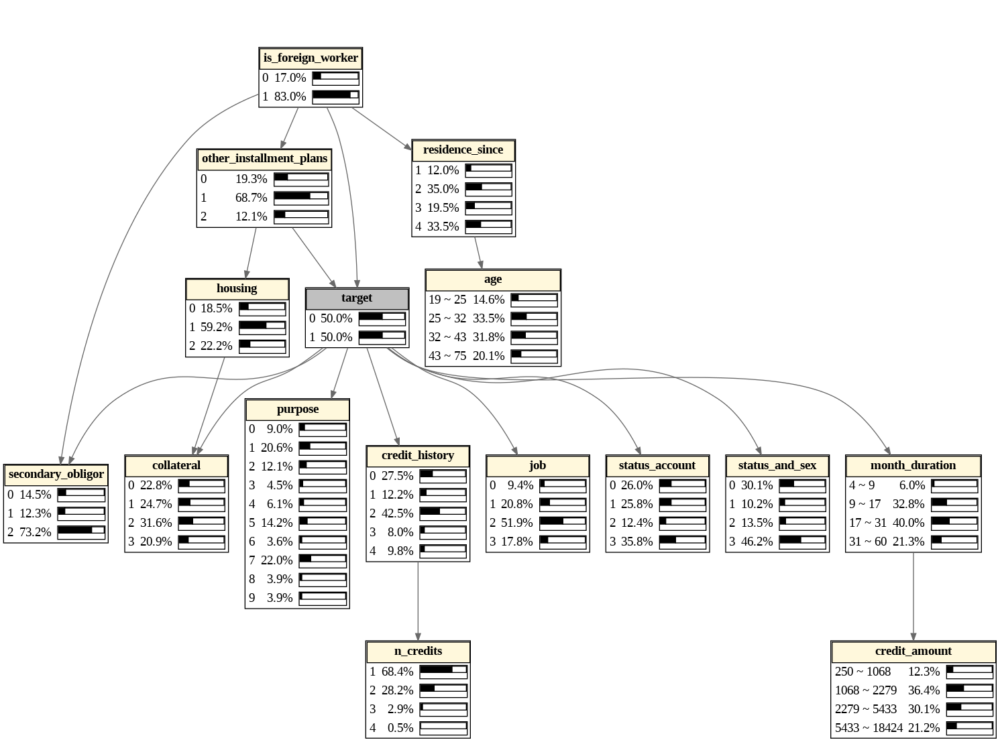

In [70]:
draw_bayesian_network_with_distributions_v2(
    bn_model,
    target_node    = "target",
    bin_labels_map = bin_labels_map,    # ← dict đổi tên state (nếu có)
    filename       = "bn_distribution_v2",
    view           = False,             # False = hiển thị trong Jupyter
)

In [71]:
# ============================================================
# SCRIPT 2: draw_backward_inference
# ============================================================
# Vẽ BN với phân phối xác suất của từng node
# KHI BIẾT TRƯỚC trạng thái của target (backward / diagnostic reasoning).
#
# Công thức:
#   P(Xi | target=evidence_val) — tính bằng VE conditional query
#
# Target node: hiển thị 100% tại state bằng evidence_val, 0% các state khác.
#
# FIX [LATENT BUG - Script 2]:
#   Original: probs = [1.0 if i == evidence_val else 0.0 for i in range(len(states))]
#   → Dùng INDEX position (i) để so sánh với evidence_val (giá trị state)
#   → CHỈ đúng khi states = [0, 1] và indices = [0, 1] trùng nhau
#   → SAI khi states = [2, 5], evidence_val=2:
#      range(2) = [0,1], không có i==2 → probs=[0.0, 0.0] (toàn sai!)
#
#   Fixed: probs = [1.0 if st == evidence_val else 0.0 for st in states]
#   → So sánh trực tiếp STATE VALUE với evidence_val (an toàn với mọi state space)
# ============================================================

def draw_backward_inference_v2(
    bn_model,
    target_node   = "target",
    evidence_val  = 0,
    bin_labels_map= None,
    filename      = "backward_inf_v2",
    view          = False,
):
    """
    Vẽ BN backward inference: P(feature | target = evidence_val).

    Tham số:
        bn_model      : DiscreteBayesianNetwork đã train xong
        target_node   : tên biến mục tiêu
        evidence_val  : giá trị STATE của target làm evidence
                        (0 = Non-Default, 1 = Default theo convention)
        bin_labels_map: dict đổi tên state (giống Script 1)
        filename      : tên file PNG (không cần đuôi)
        view          : True = mở app ngoài, False = hiển thị notebook
    """
    if bin_labels_map is None:
        bin_labels_map = {}

    # Kiểm tra evidence_val hợp lệ
    target_states = bn_model.get_cpds(target_node).state_names[target_node]
    if evidence_val not in target_states:
        raise ValueError(
            f"evidence_val={evidence_val!r} không có trong state_names của '{target_node}': "
            f"{target_states}. Hãy truyền đúng giá trị state, không phải index."
        )

    infer       = VariableElimination(bn_model)
    status_text = {0: "NON-DEFAULT", 1: "DEFAULT"}.get(evidence_val, str(evidence_val))
    full_fname  = f"{filename}_{status_text.lower()}"

    dot = _init_dot(
        title=f" "
    )

    for node in bn_model.nodes():
        if node == target_node:
            # Target node: 100% tại evidence_val, 0% tại các state khác
            states = target_states
            # FIX LATENT BUG: so sánh st == evidence_val (value), không phải i == evidence_val (index)
            probs  = [1.0 if st == evidence_val else 0.0 for st in states]
        else:
            # Feature node: tính P(node | target=evidence_val) bằng VE
            marginals = infer.query(
                variables    = [node],
                evidence     = {target_node: evidence_val},
                show_progress= False
            )
            states = marginals.state_names[node]
            probs  = marginals.values

        bg_color = "#C0C0C0" if node == target_node else "#FFF8DC"

        # FIX INCONSISTENCY: áp dụng bin_labels_map giống Script 1
        html_label = _build_node_html(node, states, probs, bg_color, bin_labels_map)
        dot.node(node, label=html_label)

    for u, v in bn_model.edges():
        dot.edge(u, v, color="dimgray", arrowsize="0.8")

    _render_and_show(dot, full_fname, view=view)


  Đã xuất: backward_inf_v2_non-default.png


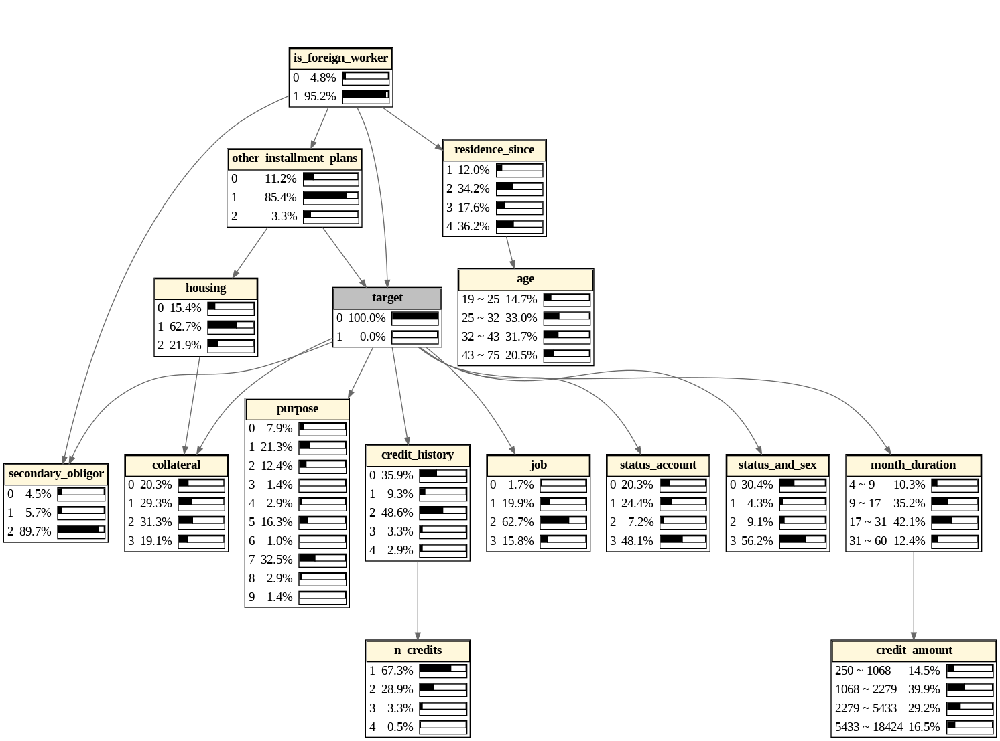

In [72]:
draw_backward_inference_v2(
    bn_model,
    target_node    = "target",
    evidence_val   = 0,              # 0 = Non-Default
    bin_labels_map = bin_labels_map,
    filename       = "backward_inf_v2",
    view           = False,
)



  Đã xuất: backward_inf_v2_default.png


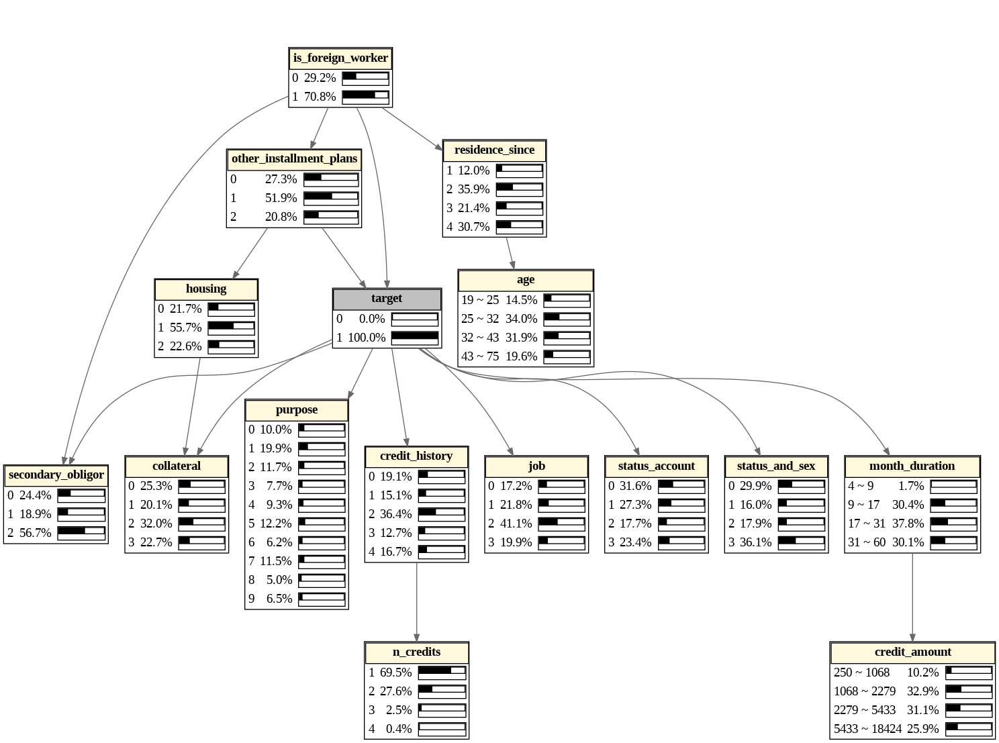

In [73]:
draw_backward_inference_v2(
    bn_model,
    target_node    = "target",
    evidence_val   = 1,              # 1 = Default
    bin_labels_map = bin_labels_map,
    filename       = "backward_inf_v2",
    view           = False,
)

# V3


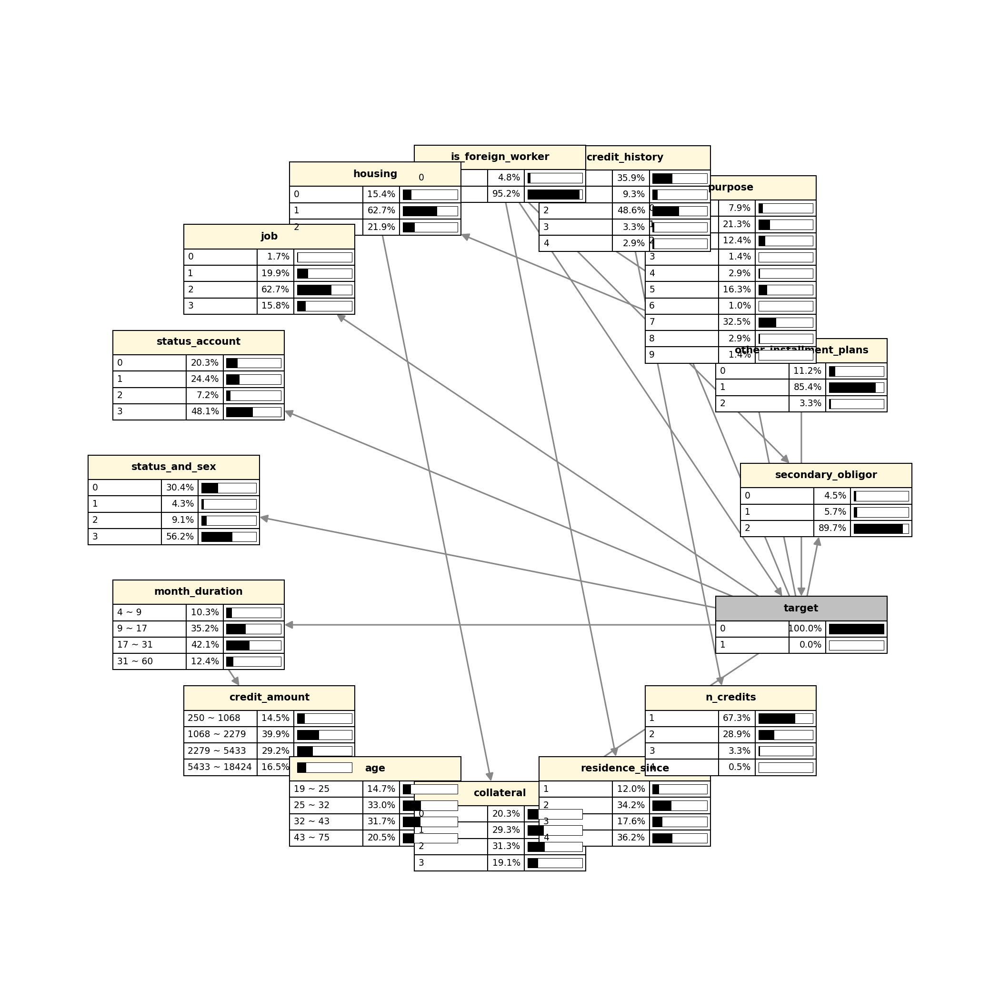

In [74]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, FancyArrowPatch
from pgmpy.inference import VariableElimination

# ============================================================
# 1. HÀM TIỆN ÍCH & LAYOUT
# ============================================================
def build_nx_graph_from_bn(bn_model):
    G = nx.DiGraph()
    G.add_nodes_from(list(bn_model.nodes()))
    G.add_edges_from(list(bn_model.edges()))
    return G

def _get_display_state(node, state, bin_labels_map):
    if bin_labels_map and node in bin_labels_map:
        try:
            key = float(state)
            if key in bin_labels_map[node]:
                return str(bin_labels_map[node][key])
        except (ValueError, TypeError):
            pass
    return str(state)

def get_circular_layout(G, radius=6.0):
    nodes = list(G.nodes())
    n = len(nodes)
    pos = {}
    angles = np.linspace(0, 2 * np.pi, n, endpoint=False)
    for idx, node in enumerate(nodes):
        pos[node] = (radius * np.cos(angles[idx]), radius * np.sin(angles[idx]))
    return pos

# Tính toán điểm giao cắt giữa đường thẳng và viền chữ nhật (để mũi tên không đâm xuyên bảng)
def get_rect_intersection(cx, cy, w, h, tx, ty):
    dx, dy = tx - cx, ty - cy
    if dx == 0 and dy == 0:
        return cx, cy
    t_x = (w / 2) / abs(dx) if dx != 0 else float('inf')
    t_y = (h / 2) / abs(dy) if dy != 0 else float('inf')
    t = min(t_x, t_y)
    return cx + t * dx, cy + t * dy

# ============================================================
# 2. LỚP ĐỒ HỌA TABLENODE (Vẽ bảng HTML thủ công)
# ============================================================
class TableNode:
    def __init__(self, ax, cx, cy, node_name, states, probs, bg_color, zorder=4):
        self.cx = cx
        self.cy = cy
        self.w = 4.2      # Chiều rộng tổng của bảng
        self.h_hdr = 0.6  # Chiều cao header
        self.h_row = 0.4  # Chiều cao mỗi dòng state
        self.h = self.h_hdr + len(states) * self.h_row

        self.node_name = node_name
        self.patches = []
        self.texts = []

        # Tọa độ góc trên cùng bên trái
        x0 = self.cx - self.w / 2
        y0 = self.cy + self.h / 2

        # 2.1 Vẽ Header
        hdr_rect = Rectangle((x0, y0 - self.h_hdr), self.w, self.h_hdr,
                             facecolor=bg_color, edgecolor='black', zorder=zorder)
        ax.add_patch(hdr_rect)
        self.patches.append(hdr_rect)

        hdr_txt = ax.text(self.cx, y0 - self.h_hdr/2, f"{node_name}",
                          ha='center', va='center', weight='bold', fontsize=10, zorder=zorder+1)
        self.texts.append(hdr_txt)

        # 2.2 Vẽ các dòng State
        curr_y = y0 - self.h_hdr
        col1_w = 1.8 # Cột State
        col2_w = 0.9 # Cột Prob
        col3_w = 1.5 # Cột Bar

        for state, prob in zip(states, probs):
            # Khung dòng
            row_rect = Rectangle((x0, curr_y - self.h_row), self.w, self.h_row,
                                 facecolor='white', edgecolor='black', zorder=zorder)
            ax.add_patch(row_rect)
            self.patches.append(row_rect)

            # Kẻ viền dọc chia cột
            line1 = Rectangle((x0 + col1_w, curr_y - self.h_row), 0, self.h_row, edgecolor='black', zorder=zorder)
            line2 = Rectangle((x0 + col1_w + col2_w, curr_y - self.h_row), 0, self.h_row, edgecolor='black', zorder=zorder)
            ax.add_patch(line1); self.patches.append(line1)
            ax.add_patch(line2); self.patches.append(line2)

            # Text: Tên State (Căn trái)
            t_state = ax.text(x0 + 0.1, curr_y - self.h_row/2, str(state),
                              ha='left', va='center', fontsize=9, zorder=zorder+1)
            self.texts.append(t_state)

            # Text: Phần trăm (Căn phải)
            prob_pct = prob * 100
            t_prob = ax.text(x0 + col1_w + col2_w - 0.1, curr_y - self.h_row/2, f"{prob_pct:.1f}%",
                             ha='right', va='center', fontsize=9, zorder=zorder+1)
            self.texts.append(t_prob)

            # Bar Chart: Box viền
            bar_pad = 0.08
            bar_x = x0 + col1_w + col2_w + bar_pad
            bar_y = curr_y - self.h_row + bar_pad
            bar_max_w = col3_w - 2*bar_pad
            bar_max_h = self.h_row - 2*bar_pad

            bg_bar = Rectangle((bar_x, bar_y), bar_max_w, bar_max_h,
                               facecolor='white', edgecolor='black', linewidth=0.5, zorder=zorder+1)
            ax.add_patch(bg_bar)
            self.patches.append(bg_bar)

            # Bar Chart: Box Đen (Giá trị)
            fg_w = bar_max_w * prob
            if fg_w > 0:
                fg_bar = Rectangle((bar_x, bar_y), fg_w, bar_max_h,
                                   facecolor='black', edgecolor='none', zorder=zorder+2)
                ax.add_patch(fg_bar)
                self.patches.append(fg_bar)

            curr_y -= self.h_row

    def contains(self, event):
        x0 = self.cx - self.w / 2
        y0 = self.cy - self.h / 2
        if x0 <= event.xdata <= x0 + self.w and y0 <= event.ydata <= y0 + self.h:
            return True
        return False

    def set_center(self, new_cx, new_cy):
        dx = new_cx - self.cx
        dy = new_cy - self.cy
        # Dịch chuyển tất cả patch
        for p in self.patches:
            p.set_x(p.get_x() + dx)
            p.set_y(p.get_y() + dy)
        # Dịch chuyển tất cả text
        for t in self.texts:
            px, py = t.get_position()
            t.set_position((px + dx, py + dy))
        self.cx = new_cx
        self.cy = new_cy


# ============================================================
# 3. TRÌNH XỬ LÝ SỰ KIỆN KÉO THẢ (Interactive)
# ============================================================
class InteractiveTableBN:
    def __init__(self, fig, ax, pos, table_nodes, arrow_patches, G):
        self.fig = fig
        self.ax = ax
        self.pos = pos
        self.table_nodes = table_nodes
        self.arrow_patches = arrow_patches
        self.G = G
        self.selected_node = None

        self.fig.canvas.mpl_connect('button_press_event', self.on_press)
        self.fig.canvas.mpl_connect('button_release_event', self.on_release)
        self.fig.canvas.mpl_connect('motion_notify_event', self.on_motion)

    def on_press(self, event):
        if event.inaxes != self.ax: return
        for node, table in self.table_nodes.items():
            if table.contains(event):
                self.selected_node = node
                break

    def on_release(self, event):
        self.selected_node = None

    def on_motion(self, event):
        if self.selected_node is None or event.inaxes != self.ax: return

        # Cập nhật vị trí
        new_x, new_y = event.xdata, event.ydata
        self.pos[self.selected_node] = (new_x, new_y)

        # Dịch chuyển bảng đồ họa
        self.table_nodes[self.selected_node].set_center(new_x, new_y)

        # Cập nhật lại các mũi tên kết nối
        for (u, v), arrow in self.arrow_patches.items():
            if u == self.selected_node or v == self.selected_node:
                u_tab = self.table_nodes[u]
                v_tab = self.table_nodes[v]

                # Tính lại giao điểm cạnh
                start = get_rect_intersection(u_tab.cx, u_tab.cy, u_tab.w, u_tab.h, v_tab.cx, v_tab.cy)
                end   = get_rect_intersection(v_tab.cx, v_tab.cy, v_tab.w, v_tab.h, u_tab.cx, u_tab.cy)
                arrow.set_positions(start, end)

        self.fig.canvas.draw_idle()


# ============================================================
# 4. HÀM VẼ CHÍNH CỦA BACKWARD INFERENCE
# ============================================================
def draw_interactive_backward_inference(
    bn_model,
    target_node="target",
    evidence_val=0,
    bin_labels_map=None,
    figsize=(14, 14)
):
    if bin_labels_map is None:
        bin_labels_map = {}

    G = build_nx_graph_from_bn(bn_model)
    pos = get_circular_layout(G, radius=8.0)

    target_states = bn_model.get_cpds(target_node).state_names[target_node]
    if evidence_val not in target_states:
        raise ValueError(f"evidence_val '{evidence_val}' không tồn tại trong node {target_node}.")

    # Tính toán Variable Elimination
    infer = VariableElimination(bn_model)

    # Thiết lập Figure Nền Trắng
    fig, ax = plt.subplots(figsize=figsize, facecolor='white')
    ax.set_facecolor('white')

    status_text = {0: "NON-DEFAULT", 1: "DEFAULT"}.get(evidence_val, str(evidence_val))


    table_nodes = {}
    arrow_patches = {}

    # 1. Vẽ các Node Bảng
    for node in G.nodes():
        if node == target_node:
            states = target_states
            probs = [1.0 if st == evidence_val else 0.0 for st in states]
            bg_color = "#C0C0C0" # Xám
        else:
            marginals = infer.query(variables=[node], evidence={target_node: evidence_val}, show_progress=False)
            states = marginals.state_names[node]
            probs = marginals.values
            bg_color = "#FFF8DC" # Vàng nhạt (tương tự màu cũ Graphviz)

        display_states = [_get_display_state(node, st, bin_labels_map) for st in states]

        cx, cy = pos[node]
        # Khởi tạo TableNode
        table = TableNode(ax, cx, cy, node, display_states, probs, bg_color)
        table_nodes[node] = table

    # 2. Vẽ Cạnh Mũi Tên ĐƯỜNG THẲNG
    for u, v in G.edges():
        u_tab = table_nodes[u]
        v_tab = table_nodes[v]

        start = get_rect_intersection(u_tab.cx, u_tab.cy, u_tab.w, u_tab.h, v_tab.cx, v_tab.cy)
        end   = get_rect_intersection(v_tab.cx, v_tab.cy, v_tab.w, v_tab.h, u_tab.cx, u_tab.cy)

        arrow = FancyArrowPatch(
            start, end,
            arrowstyle="-|>", mutation_scale=16,
            color="#888888", linewidth=1.5,
            shrinkA=0, shrinkB=0, zorder=1,
            connectionstyle="arc3,rad=0.0" # ÉP BUỘC ĐƯỜNG THẲNG
        )
        ax.add_patch(arrow)
        arrow_patches[(u, v)] = arrow

    # Mở rộng giới hạn trục để chứa bảng
    ax.set_xlim(-12, 12)
    ax.set_ylim(-12, 12)
    ax.axis('off')

    # Kích hoạt sự kiện
    handler = InteractiveTableBN(fig, ax, pos, table_nodes, arrow_patches, G)
    fig._interactive_handler = handler # Lưu tham chiếu

    plt.tight_layout()
    plt.show()

# ============================================================
# CÁCH GỌI HÀM SỬ DỤNG
# ============================================================
draw_interactive_backward_inference(
    bn_model=bn_model,
    target_node=TARGET,
    evidence_val=0,         # Đổi thành 1 nếu muốn test case 'DEFAULT'
    bin_labels_map=bin_labels_map,    # Truyền map của bạn vào đây nếu có
    figsize=(14, 14)
)

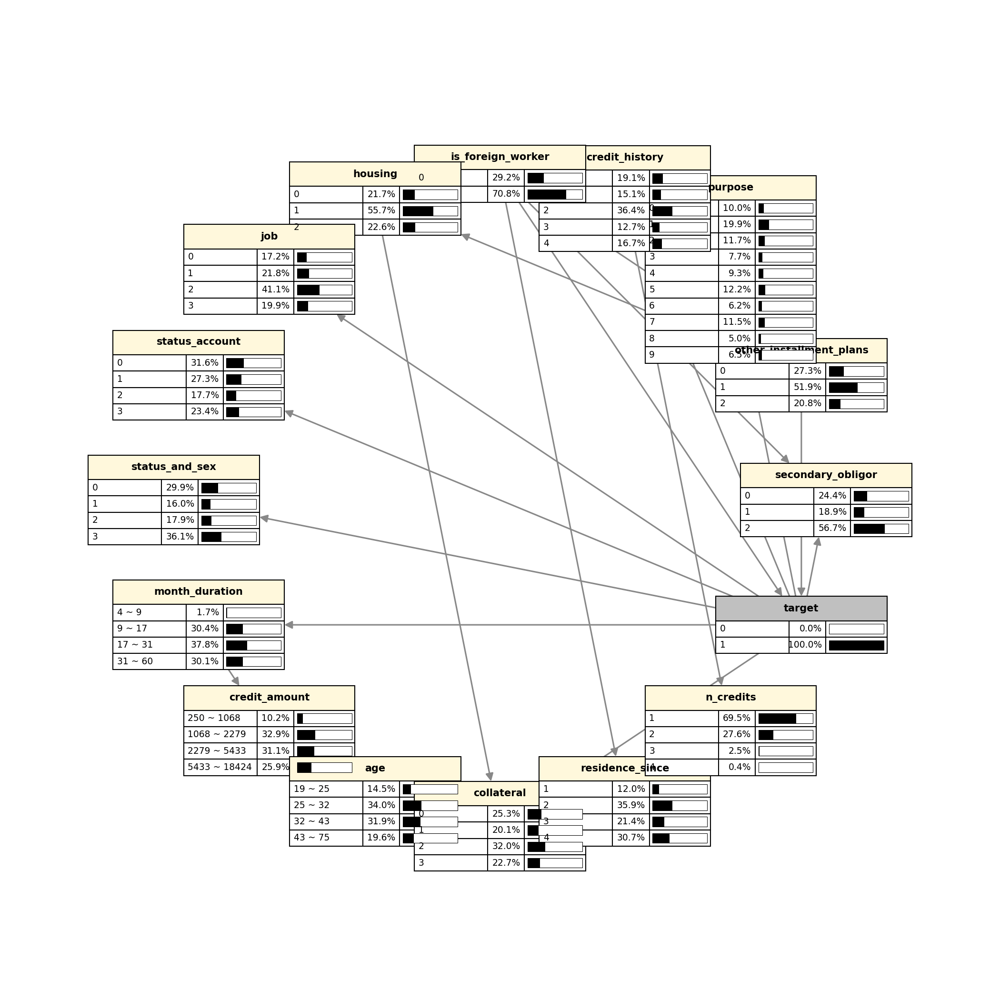

In [75]:
draw_interactive_backward_inference(
    bn_model=bn_model,
    target_node=TARGET,
    evidence_val=1,         # Đổi thành 1 nếu muốn test case 'DEFAULT'
    bin_labels_map=bin_labels_map,    # Truyền map của bạn vào đây nếu có
    figsize=(14, 14)
)

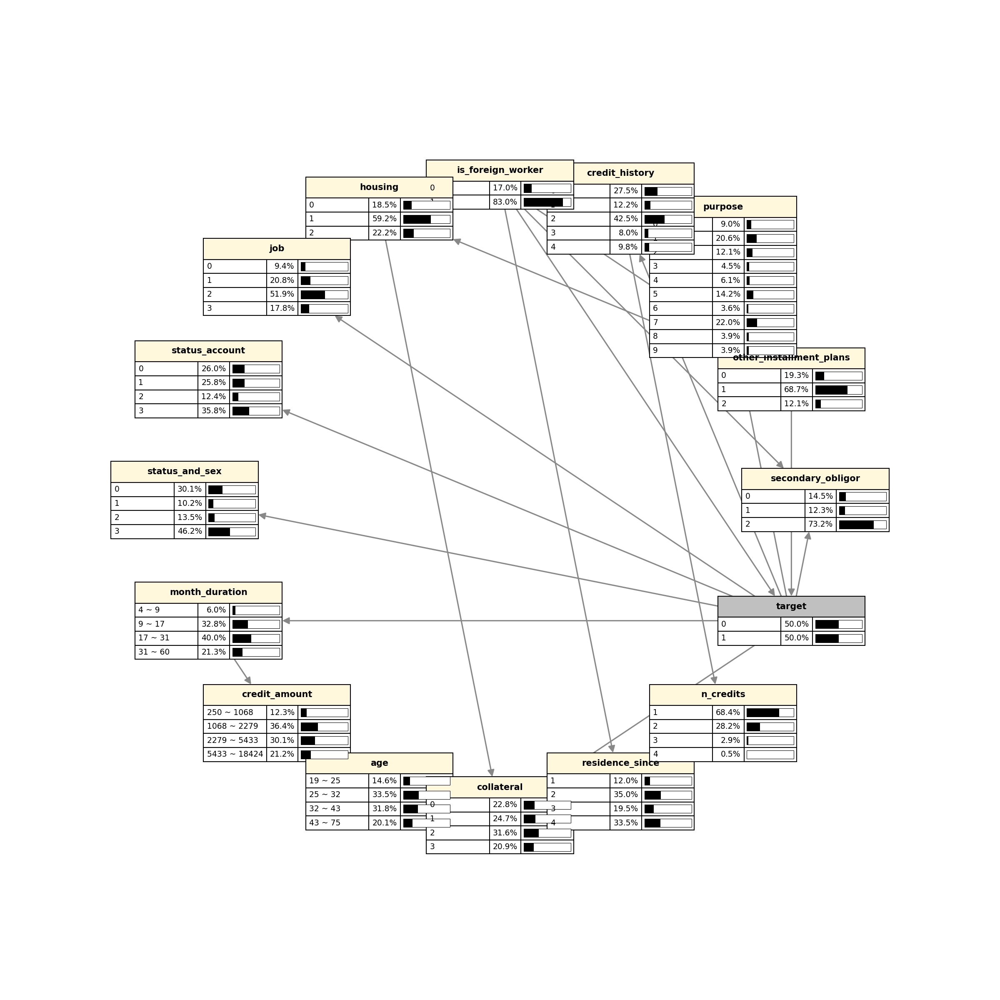

In [76]:
def draw_interactive_global_bn(
    bn_model,
    target_node="target",
    bin_labels_map=None,
    figsize=(16, 16)
):
    """
    Vẽ toàn bộ Bayesian Network với phân phối xác suất biên (Marginal Prior)
    Sử dụng Matplotlib tương tác (có thể kéo thả các bảng).
    """
    if bin_labels_map is None:
        bin_labels_map = {}

    # Lấy danh sách nodes và edges
    G = build_nx_graph_from_bn(bn_model)

    # Sử dụng circular layout làm mặc định, bạn có thể đổi thành spring_layout nếu muốn
    pos = get_circular_layout(G, radius=9.0)

    # Khởi tạo Variable Elimination engine
    infer = VariableElimination(bn_model)

    # Thiết lập Figure
    fig, ax = plt.subplots(figsize=figsize, facecolor='white')
    ax.set_facecolor('white')


    table_nodes = {}
    arrow_patches = {}

    # ============================================================
    # 1. VẼ CÁC NODE BẢNG (Không có evidence)
    # ============================================================
    for node in G.nodes():
        # Truy vấn xác suất biên (Marginal Probability) mà KHÔNG có evidence
        marginals = infer.query(variables=[node], show_progress=False)
        states = marginals.state_names[node]
        probs = marginals.values

        # Thiết lập màu sắc: Target màu xám, Feature màu vàng nhạt
        bg_color = "#C0C0C0" if node == target_node else "#FFF8DC"

        # Lấy label hiển thị (nếu có mapping)
        display_states = [_get_display_state(node, st, bin_labels_map) for st in states]

        # Tọa độ khởi tạo
        cx, cy = pos[node]

        # Khởi tạo TableNode
        table = TableNode(ax, cx, cy, node, display_states, probs, bg_color)
        table_nodes[node] = table

    # ============================================================
    # 2. VẼ CẠNH MŨI TÊN
    # ============================================================
    for u, v in G.edges():
        u_tab = table_nodes[u]
        v_tab = table_nodes[v]

        # Tính điểm giao cắt để mũi tên dừng ở viền bảng
        start = get_rect_intersection(u_tab.cx, u_tab.cy, u_tab.w, u_tab.h, v_tab.cx, v_tab.cy)
        end   = get_rect_intersection(v_tab.cx, v_tab.cy, v_tab.w, v_tab.h, u_tab.cx, u_tab.cy)

        arrow = FancyArrowPatch(
            start, end,
            arrowstyle="-|>", mutation_scale=16,
            color="#888888", linewidth=1.5,
            shrinkA=0, shrinkB=0, zorder=1,
            connectionstyle="arc3,rad=0.0"
        )
        ax.add_patch(arrow)
        arrow_patches[(u, v)] = arrow

    # Mở rộng giới hạn trục để chứa đủ các bảng
    ax.set_xlim(-14, 14)
    ax.set_ylim(-14, 14)
    ax.axis('off')

    # ============================================================
    # 3. KÍCH HOẠT TƯƠNG TÁC KÉO THẢ
    # ============================================================
    handler = InteractiveTableBN(fig, ax, pos, table_nodes, arrow_patches, G)
    fig._interactive_handler = handler  # Lưu tham chiếu để tránh bị Garbage Collector xóa

    plt.tight_layout()
    plt.show()

# Cách gọi hàm:
draw_interactive_global_bn(bn_model=bn_model,
                           target_node=TARGET,
                           bin_labels_map=bin_labels_map)